# OaSC on Kaggle — OSDD reproduction notebook

**Paper:** *Recognizing Unseen States of Unknown Objects by Leveraging Knowledge Graphs* (WACV 2025)

This notebook is designed to get the **official OaSC method running on Kaggle** with as little dependency pain as possible.

### What this notebook reproduces

For OSDD, the authors' released setup uses:

- **visual backbone:** ResNet-101
- **semantic classifier weights:** generated from the knowledge graph / Tr-GCN stage
- **graph configuration:** `conceptnet_wordnet_hop1_thresh_10`
- **unseen states:** `empty`, `open`, `folded`, `filled`
- **seen states:** the remaining OSDD states
- **evaluation:** calibrated generalized zero-shot recognition, reporting Seen Accuracy, Unseen Accuracy, Harmonic Mean, and AUC

### Important Kaggle setting

Turn **Internet ON** and select a **GPU** before running. The notebook clones the authors' public repository and downloads their released material from the Google Drive ID used by their own `download_data.sh`.

> We intentionally do **not** install the repository's 2020-era full Conda environment (Python 3.7 / PyTorch 1.6). The pretrained OSDD evaluation only needs modern PyTorch/torchvision plus the authors' released embeddings and checkpoint, so this notebook uses a small compatibility layer instead.

In [ ]:
# Cell 1 — Kaggle / GPU sanity check
import os, sys, platform, subprocess
from pathlib import Path

print('Python:', sys.version.split()[0])
print('Platform:', platform.platform())

try:
    import torch, torchvision
    print('PyTorch:', torch.__version__)
    print('Torchvision:', torchvision.__version__)
    print('CUDA available:', torch.cuda.is_available())
    if torch.cuda.is_available():
        print('GPU:', torch.cuda.get_device_name(0))
except Exception as e:
    print('Torch import error:', repr(e))

if not torch.cuda.is_available():
    print('\nWARNING: GPU is not enabled. Kaggle -> Settings -> Accelerator -> GPU.')

In [ ]:
# Cell 2 — Install only the small helper dependency we need
%pip install -q gdown

## 1. Get the complete official repository

The ZIP you supplied contains the OaSC `KG/` implementation, README and environment file, but it does **not** contain several execution files referenced by the README (for example `test.py`, `finetune.py`, `flags.py`, and `download_data.sh`).

So on Kaggle we clone the **complete official repository** automatically.

In [1]:
# Cell 3 — Clone the official repository
from pathlib import Path
import subprocess, shutil, os

WORK = Path('/kaggle/working') if Path('/kaggle/working').exists() else Path.cwd()
REPO_ROOT = WORK / 'OaSC_official'
METHOD_DIR = REPO_ROOT / 'OaSC'
SRC_DIR = METHOD_DIR / 'src'

if not REPO_ROOT.exists():
    subprocess.run([
        'git', 'clone', '--depth', '1',
        'https://github.com/philipposg/OaSC.git',
        str(REPO_ROOT)
    ], check=True)
else:
    print('Repository already exists:', REPO_ROOT)

commit = subprocess.check_output(['git', '-C', str(REPO_ROOT), 'rev-parse', 'HEAD'], text=True).strip()
print('Repository:', REPO_ROOT)
print('Commit:', commit)
print('OaSC method dir:', METHOD_DIR)

required = [
    SRC_DIR / 'test.py',
    SRC_DIR / 'finetune.py',
    SRC_DIR / 'train_gnn.py',
    SRC_DIR / 'download_data.sh',
]
for p in required:
    print(('OK  ' if p.exists() else 'MISS'), p.relative_to(REPO_ROOT))

assert all(p.exists() for p in required), 'The full official repo was not cloned correctly.'

Cloning into '/kaggle/working/OaSC_official'...


Repository: /kaggle/working/OaSC_official
Commit: b031a50f3b93aed1fd45def6319b117fc5eaf8b6
OaSC method dir: /kaggle/working/OaSC_official/OaSC
OK   OaSC/src/test.py
OK   OaSC/src/finetune.py
OK   OaSC/src/train_gnn.py
OK   OaSC/src/download_data.sh


## 2. Download the authors' released OaSC material

The official `download_data.sh` points to Google Drive file ID:

`1i-jaMPKoBOmBncKBQ3qpsGQ9pLWgwRbz`

That archive contains the prepared datasets/materials, generated state embeddings, and released checkpoints. We use `gdown` because it is more reliable in notebooks than the old cookie-based `curl` script.

In [2]:
# Cell 4 — Download OaSC_material.tar.gz (or reuse an uploaded copy)
import gdown, glob, shutil
from pathlib import Path

FILE_ID = '1i-jaMPKoBOmBncKBQ3qpsGQ9pLWgwRbz'
ARCHIVE = WORK / 'OaSC_material.tar.gz'

# Optional offline/manual fallback:
# If you already uploaded OaSC_material.tar.gz as a Kaggle Dataset,
# this searches /kaggle/input and uses it instead of downloading again.
manual_candidates = list(Path('/kaggle/input').rglob('OaSC_material.tar.gz')) if Path('/kaggle/input').exists() else []

if ARCHIVE.exists() and ARCHIVE.stat().st_size > 1_000_000:
    print('Using existing archive:', ARCHIVE)
elif manual_candidates:
    print('Using uploaded Kaggle archive:', manual_candidates[0])
    shutil.copy2(manual_candidates[0], ARCHIVE)
else:
    print('Downloading released OaSC material from the authors\' Google Drive...')
    out = gdown.download(id=FILE_ID, output=str(ARCHIVE), quiet=False)
    if out is None:
        raise RuntimeError(
            'Download failed. Make sure Kaggle Internet is ON, or upload '
            'OaSC_material.tar.gz as a Kaggle Dataset and rerun this cell.'
        )

print('Archive:', ARCHIVE)
print('Size: %.2f GB' % (ARCHIVE.stat().st_size / 1024**3))

Downloading...
From (original): https://drive.google.com/uc?id=1i-jaMPKoBOmBncKBQ3qpsGQ9pLWgwRbz
From (redirected): https://drive.google.com/uc?id=1i-jaMPKoBOmBncKBQ3qpsGQ9pLWgwRbz&confirm=t&uuid=7fe987df-1c3a-46c7-9f83-ff211b9ff4e0
To: /kaggle/working/OaSC_material.tar.gz
100%|██████████| 1.30G/1.30G [00:11<00:00, 115MB/s] 

Archive: /kaggle/working/OaSC_material.tar.gz
Size: 1.21 GB


In [3]:
# Cell 5 — Extract the nested release archives into the locations expected by OaSC
import tarfile, os, shutil
from pathlib import Path

STAGING = WORK / 'oasc_release_staging'
STAGING.mkdir(parents=True, exist_ok=True)

marker = METHOD_DIR / '.oasc_material_extracted'

if marker.exists():
    print('Release material already extracted.')
else:
    print('Extracting outer archive...')
    with tarfile.open(ARCHIVE, 'r:gz') as tf:
        tf.extractall(STAGING)

    # Locate inner archives even if the outer archive adds one directory level.
    inner = {p.name: p for p in STAGING.rglob('*.tar.gz')}
    print('Inner archives found:', sorted(inner))

    def extract(name, destination):
        if name not in inner:
            print(f'WARNING: {name} not found; skipping.')
            return
        destination = Path(destination)
        destination.mkdir(parents=True, exist_ok=True)
        print(f'Extracting {name} -> {destination}')
        with tarfile.open(inner[name], 'r:gz') as tf:
            tf.extractall(destination)

    # Matches the intent of the authors' download_data.sh
    extract('datasets.tar.gz', METHOD_DIR)
    extract('embeddings.tar.gz', METHOD_DIR)
    extract('saved_checkpoints.tar.gz', METHOD_DIR)
    extract('data.tar.gz', SRC_DIR)

    marker.write_text('ok')

print('\nChecking expected OSDD files...')
paths = {
    'OSDD train': METHOD_DIR / 'datasets/osdd/train',
    'OSDD test': METHOD_DIR / 'datasets/osdd/test',
    'OaSC state embeddings': METHOD_DIR / 'embeddings/osdd_emb.pred',
    'Fine-tuned ResNet-101': METHOD_DIR / 'saved_checkpoints/osdd/finetuned_weights.pth',
}
for name, p in paths.items():
    print(f'{name:25s}:', 'OK' if p.exists() else 'MISSING', p)

missing = [name for name, p in paths.items() if not p.exists()]
if missing:
    raise FileNotFoundError('Missing release material: ' + ', '.join(missing))

Extracting outer archive...


/tmp/ipykernel_111/1820145519.py:15: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tf.extractall(STAGING)


Inner archives found: ['data.tar.gz', 'datasets.tar.gz', 'embeddings.tar.gz', 'saved_checkpoints.tar.gz']
Extracting datasets.tar.gz -> /kaggle/working/OaSC_official/OaSC


/tmp/ipykernel_111/1820145519.py:29: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tf.extractall(destination)


Extracting embeddings.tar.gz -> /kaggle/working/OaSC_official/OaSC
Extracting saved_checkpoints.tar.gz -> /kaggle/working/OaSC_official/OaSC
Extracting data.tar.gz -> /kaggle/working/OaSC_official/OaSC/src

Checking expected OSDD files...
OSDD train               : OK /kaggle/working/OaSC_official/OaSC/datasets/osdd/train
OSDD test                : OK /kaggle/working/OaSC_official/OaSC/datasets/osdd/test
OaSC state embeddings    : OK /kaggle/working/OaSC_official/OaSC/embeddings/osdd_emb.pred
Fine-tuned ResNet-101    : OK /kaggle/working/OaSC_official/OaSC/saved_checkpoints/osdd/finetuned_weights.pth


## 3. Inspect the released OaSC state classifier vectors

OaSC's KG/Tr-GCN branch predicts the final classifier parameters for each state. For ResNet-101 there are **2048 feature weights + 1 bias = 2049 numbers per state**.

The graph configuration used by the authors' OSDD test script is `conceptnet_wordnet_hop1_thresh_10`.

In [4]:
# Cell 6 — Load and inspect the Tr-GCN-generated OSDD state vectors
import torch

EMB_PATH = METHOD_DIR / 'embeddings/osdd_emb.pred'
GRAPH_TYPE = 'conceptnet_wordnet_hop1_thresh_10'

# PyTorch >=2.6 changed torch.load's default behavior. These are trusted files
# downloaded from the paper authors' release, so we explicitly allow the old format.
def torch_load_compat(path, map_location='cpu'):
    try:
        return torch.load(path, map_location=map_location, weights_only=False)
    except TypeError:  # older PyTorch
        return torch.load(path, map_location=map_location)

emb_file = torch_load_compat(EMB_PATH)
print('Available graph keys:')
for k in emb_file.keys():
    print('  ', k)

assert GRAPH_TYPE in emb_file, f'{GRAPH_TYPE} not found in embedding file.'
state_vectors = emb_file[GRAPH_TYPE].float()
print('\nSelected graph:', GRAPH_TYPE)
print('State-vector tensor shape:', tuple(state_vectors.shape))
assert state_vectors.ndim == 2 and state_vectors.shape[1] == 2049

Available graph keys:
   osdd2
   osdd_ir_9_graph
   osdd_wordnet_states
   conceptnet_hop2_thresh_10
   wordnet_states_hop2
   conceptnet_hop1_thresh_10
   conceptnet_hop1_thresh_0
   conceptnet_wordnet_hop2_thresh_10
   conceptnet_wordnet_hop1_thresh_0
   conceptnet_wordnet_hop1_thresh_10
   visualgenome_states_hops0
   visualgenome_states_hops1
   visualgenome_hops1
   vg_from_cskg_states_hops0
   vg_from_cskg_states_hops1
   vg_from_cskg_hops1
   cskg_states_hops0
   vg_cn_from_cskg_states_hops0
   vg_cn_wn_from_cskg_states_hops0
   vg_wn_from_cskg_states_hops0
   vg_cn_from_cskg_states_hops1
   vg_cn_wn_from_cskg_states_hops1
   vg_wn_from_cskg_states_hops1
   cn_from_cskg_states_hops0
   cn_wn_from_cskg_states_hops0
   cn_from_cskg_states_hops1
   cn_wn_from_cskg_states_hops1
   cn_from_cskg_states_hops2
   cn_wn_from_cskg_states_hops2
   cn-wk-from-cskg-states-hops0
   vg-cn-wn-wk-from-cskg-states-hops0
   cn-wn-wk-from-cskg-states-hops0
   vg-wk-from-cskg-states-hops0
   cn-wk-

## 4. Load the OaSC visual model

We now reproduce the authors' testing logic in a Kaggle-safe form:

1. create a ResNet-101,
2. remove its classification head to obtain a 2048-D visual feature,
3. load the authors' fine-tuned visual backbone,
4. append a constant `1` to the feature,
5. multiply it by the KG-generated 2049-D state classifier vectors.

This is mathematically equivalent to a linear classifier whose weights and bias came from the KG/Tr-GCN stage.

In [5]:
# Cell 7 — Build the OaSC inference model
import torch
import torch.nn as nn
from torchvision.models import resnet101

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
CKPT_PATH = METHOD_DIR / 'saved_checkpoints/osdd/finetuned_weights.pth'

# Avoid downloading ImageNet weights here: the released fine-tuned checkpoint
# contains the trained backbone weights already.
try:
    cnn = resnet101(weights=None)
except TypeError:
    cnn = resnet101(pretrained=False)

cnn.fc = nn.Identity()
ckpt = torch_load_compat(CKPT_PATH)

# Some checkpoints may be wrapped; the released OaSC checkpoint is normally a state_dict.
if isinstance(ckpt, dict) and 'state_dict' in ckpt and isinstance(ckpt['state_dict'], dict):
    ckpt = ckpt['state_dict']

# Strip DataParallel prefix if present.
ckpt = {k.replace('module.', ''): v for k, v in ckpt.items()}
ckpt.pop('fc.weight', None)
ckpt.pop('fc.bias', None)

missing, unexpected = cnn.load_state_dict(ckpt, strict=False)
print('Missing keys:', missing)
print('Unexpected keys:', unexpected)

cnn = cnn.to(DEVICE).eval()
state_vectors = state_vectors.to(DEVICE)

print('Device:', DEVICE)
print('Visual feature dimension: 2048')
print('Classifier-vector shape:', tuple(state_vectors.shape))

Missing keys: []
Unexpected keys: []
Device: cuda
Visual feature dimension: 2048
Classifier-vector shape: (9, 2049)


## 5. Load OSDD and define the seen/unseen split

The authors' `test_osdd.sh` uses:

`empty_open_folded_filled`

as the omitted/unseen state set. The global OSDD state order used in their testing code is:

`closed, containing, empty, filled, folded, open, plugged, unfolded, unplugged`.

In [6]:
# Cell 8 — Dataset + exact OSDD label mapping used by the authors
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

OSDD_CLASSES = [
    'closed', 'containing', 'empty', 'filled', 'folded',
    'open', 'plugged', 'unfolded', 'unplugged'
]
CLASS_TO_GLOBAL = {name: i for i, name in enumerate(OSDD_CLASSES)}

UNSEEN_NAMES = ['empty', 'open', 'folded', 'filled']
UNSEEN_IDS = [CLASS_TO_GLOBAL[x] for x in UNSEEN_NAMES]
SEEN_IDS = [i for i in range(len(OSDD_CLASSES)) if i not in UNSEEN_IDS]

transform = transforms.Compose([
    transforms.Resize([224, 224]),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

TEST_DIR = METHOD_DIR / 'datasets/osdd/test'
test_ds = datasets.ImageFolder(TEST_DIR, transform=transform)

print('ImageFolder classes:', test_ds.classes)
print('Number of test images:', len(test_ds))

unknown_folders = [c for c in test_ds.classes if c not in CLASS_TO_GLOBAL]
assert not unknown_folders, f'Unexpected OSDD class folders: {unknown_folders}'

folder_idx_to_global = {
    folder_idx: CLASS_TO_GLOBAL[class_name]
    for class_name, folder_idx in test_ds.class_to_idx.items()
}

print('Seen states  :', [OSDD_CLASSES[i] for i in SEEN_IDS])
print('Unseen states:', [OSDD_CLASSES[i] for i in UNSEEN_IDS])
print('Folder -> global mapping:', folder_idx_to_global)

test_loader = DataLoader(
    test_ds,
    batch_size=128,
    shuffle=False,
    num_workers=2,
    pin_memory=torch.cuda.is_available(),
)

ImageFolder classes: ['closed', 'containing', 'empty', 'filled', 'folded', 'open', 'plugged', 'unfolded', 'unplugged']
Number of test images: 3109
Seen states  : ['closed', 'containing', 'plugged', 'unfolded', 'unplugged']
Unseen states: ['empty', 'open', 'folded', 'filled']
Folder -> global mapping: {0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8}


## 6. Run OaSC inference once

The expensive CNN pass is done only once. After that, calibration over many values of \(\gamma\) is very fast.

The authors add \(\gamma\) to the scores of **unseen** classes and sweep it from `-5` to `15` in steps of `0.5`. This traces the seen–unseen trade-off used for HM and AUC.

In [7]:
# Cell 9 — Extract scores for every OSDD test image
import numpy as np
from tqdm.auto import tqdm

all_scores = []
all_targets = []

with torch.inference_mode():
    for images, folder_labels in tqdm(test_loader, desc='OaSC inference'):
        images = images.to(DEVICE, non_blocking=True)
        features = cnn(images)  # [B, 2048]
        features_aug = torch.cat([
            features,
            torch.ones(features.shape[0], 1, device=features.device)
        ], dim=1)  # [B, 2049]

        # state_vectors: [9, 2049]; each row = [linear weights | bias]
        scores = features_aug @ state_vectors.T
        targets = torch.tensor(
            [folder_idx_to_global[int(x)] for x in folder_labels],
            dtype=torch.long
        )

        all_scores.append(scores.cpu())
        all_targets.append(targets)

scores = torch.cat(all_scores, dim=0)
targets = torch.cat(all_targets, dim=0)

print('Scores:', tuple(scores.shape))
print('Targets:', tuple(targets.shape))
assert scores.shape == (len(test_ds), len(OSDD_CLASSES))

OaSC inference:   0%|          | 0/25 [00:00<?, ?it/s]

Scores: (3109, 9)
Targets: (3109,)


In [8]:
# Cell 10 — Exact seen/unseen calibration metrics used by the authors
import pandas as pd
import numpy as np

def evaluate_gamma(scores, targets, gamma):
    calibrated = scores.clone()
    calibrated[:, UNSEEN_IDS] += float(gamma)
    pred = calibrated.argmax(dim=1)

    seen_mask = torch.tensor([int(y) in SEEN_IDS for y in targets], dtype=torch.bool)
    unseen_mask = ~seen_mask

    seen_acc = (pred[seen_mask] == targets[seen_mask]).float().mean().item() if seen_mask.any() else float('nan')
    unseen_acc = (pred[unseen_mask] == targets[unseen_mask]).float().mean().item() if unseen_mask.any() else float('nan')
    hm = 0.0 if (seen_acc + unseen_acc) == 0 else 2 * seen_acc * unseen_acc / (seen_acc + unseen_acc)
    total_acc = (pred == targets).float().mean().item()
    return total_acc, seen_acc, unseen_acc, hm

gammas = np.arange(-5.0, 15.125, 0.5)
rows = []
for gamma in gammas:
    total, seen, unseen, hm = evaluate_gamma(scores, targets, gamma)
    rows.append({
        'gamma': gamma,
        'total_acc': total,
        'seen_acc': seen,
        'unseen_acc': unseen,
        'harmonic_mean': hm,
    })

results = pd.DataFrame(rows)
best_idx = results['harmonic_mean'].idxmax()
best = results.loc[best_idx]

# Same orientation as the official test.py: np.trapz(seen_accuracy, unseen_accuracy)
try:
    auc = np.trapezoid(results['seen_acc'].to_numpy(), results['unseen_acc'].to_numpy())
except AttributeError:
    auc = np.trapz(results['seen_acc'].to_numpy(), results['unseen_acc'].to_numpy())

print('=== OaSC / OSDD reproduction ===')
print(f"Best gamma       : {best['gamma']:.2f}")
print(f"Seen @ best HM   : {100*best['seen_acc']:.2f}%")
print(f"Unseen @ best HM : {100*best['unseen_acc']:.2f}%")
print(f"Best HM          : {100*best['harmonic_mean']:.2f}%")
print(f"Max seen acc     : {100*results['seen_acc'].max():.2f}%")
print(f"Max unseen acc   : {100*results['unseen_acc'].max():.2f}%")
print(f"AUC              : {100*auc:.2f}")

summary = pd.DataFrame([{
    'Method': 'OaSC (released checkpoint)',
    'Graph': GRAPH_TYPE,
    'Unseen states': ', '.join(UNSEEN_NAMES),
    'Best gamma': best['gamma'],
    'Seen Acc (%)': 100*best['seen_acc'],
    'Unseen Acc (%)': 100*best['unseen_acc'],
    'HM (%)': 100*best['harmonic_mean'],
    'AUC': 100*auc,
}])
display(summary.round(3))

=== OaSC / OSDD reproduction ===
Best gamma       : 2.50
Seen @ best HM   : 44.68%
Unseen @ best HM : 56.93%
Best HM          : 50.07%
Max seen acc     : 84.46%
Max unseen acc   : 64.82%
AUC              : 40.16


,Method,Graph,Unseen states,Best gamma,Seen Acc (%),Unseen Acc (%),HM (%),AUC
0,OaSC (released checkpoint),conceptnet_wordnet_hop1_thresh_10,"empty, open, folded, filled",2.5,44.682,56.927,50.067,40.156


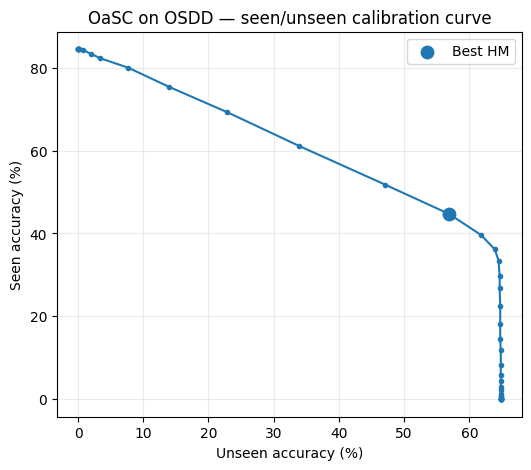

In [9]:
# Cell 11 — Plot the seen–unseen trade-off
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 5))
plt.plot(results['unseen_acc'] * 100, results['seen_acc'] * 100, marker='o', markersize=3)
plt.scatter([best['unseen_acc'] * 100], [best['seen_acc'] * 100], s=80, label='Best HM')
plt.xlabel('Unseen accuracy (%)')
plt.ylabel('Seen accuracy (%)')
plt.title('OaSC on OSDD — seen/unseen calibration curve')
plt.grid(alpha=0.25)
plt.legend()
plt.show()

## 7. Qualitative predictions

This section shows actual OSDD test images with the ground-truth and OaSC prediction at the best calibration value. These examples are useful for tomorrow's presentation because they show **what the model is recognizing**, not just one aggregate number.

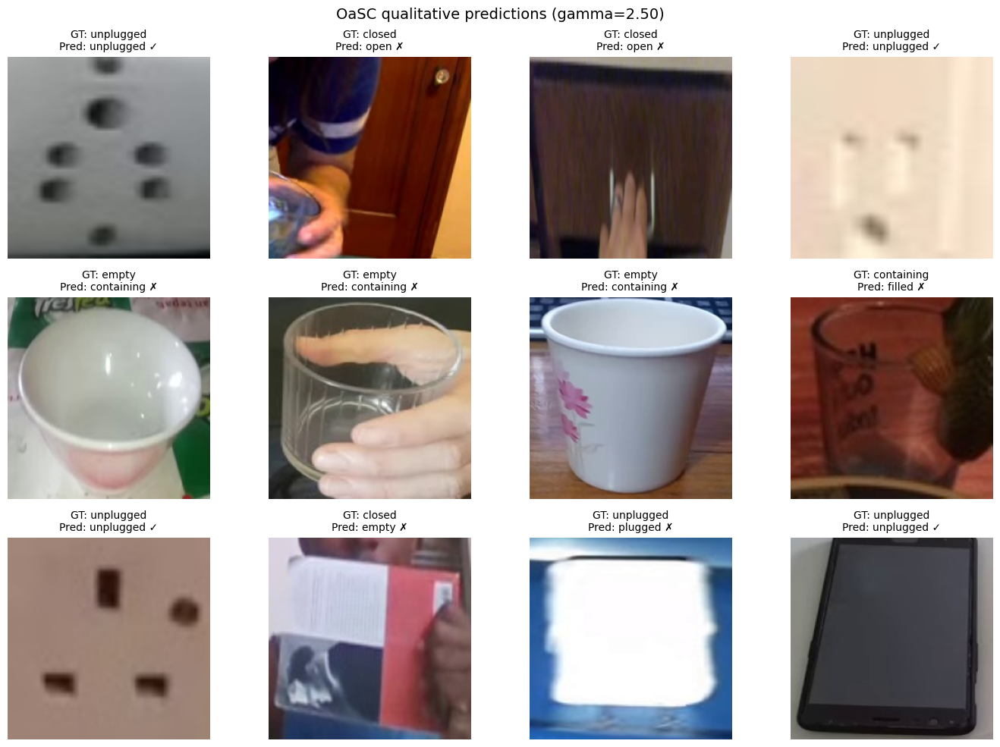

In [10]:
# Cell 12 — Visualize predictions at the best gamma
import random
import matplotlib.pyplot as plt

best_gamma = float(best['gamma'])
calibrated_scores = scores.clone()
calibrated_scores[:, UNSEEN_IDS] += best_gamma
preds = calibrated_scores.argmax(dim=1)

rng = random.Random(42)
N_SHOW = min(12, len(test_ds))
indices = rng.sample(range(len(test_ds)), N_SHOW)

# Denormalization for display
mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
axes = axes.ravel()
for ax, idx in zip(axes, indices):
    image, folder_label = test_ds[idx]
    image_show = (image * std + mean).clamp(0, 1).permute(1,2,0).numpy()
    gt = int(targets[idx])
    pr = int(preds[idx])
    ok = gt == pr

    ax.imshow(image_show)
    ax.set_title(
        f"GT: {OSDD_CLASSES[gt]}\nPred: {OSDD_CLASSES[pr]} {'✓' if ok else '✗'}",
        fontsize=10
    )
    ax.axis('off')

plt.suptitle(f'OaSC qualitative predictions (gamma={best_gamma:.2f})', fontsize=14)
plt.tight_layout()
plt.show()

## 8. Per-state accuracy and confusion matrix

This is not required by the authors' shell script, but it is very useful for understanding *which* states are difficult and for deciding what improvement to try next.

,state,split,samples,accuracy_%
0,closed,seen,559,9.66
1,containing,seen,297,21.21
2,empty,unseen,647,58.58
3,filled,unseen,196,16.84
4,folded,unseen,141,81.56
5,open,unseen,207,72.95
6,plugged,seen,260,60.38
7,unfolded,seen,121,3.31
8,unplugged,seen,681,85.02


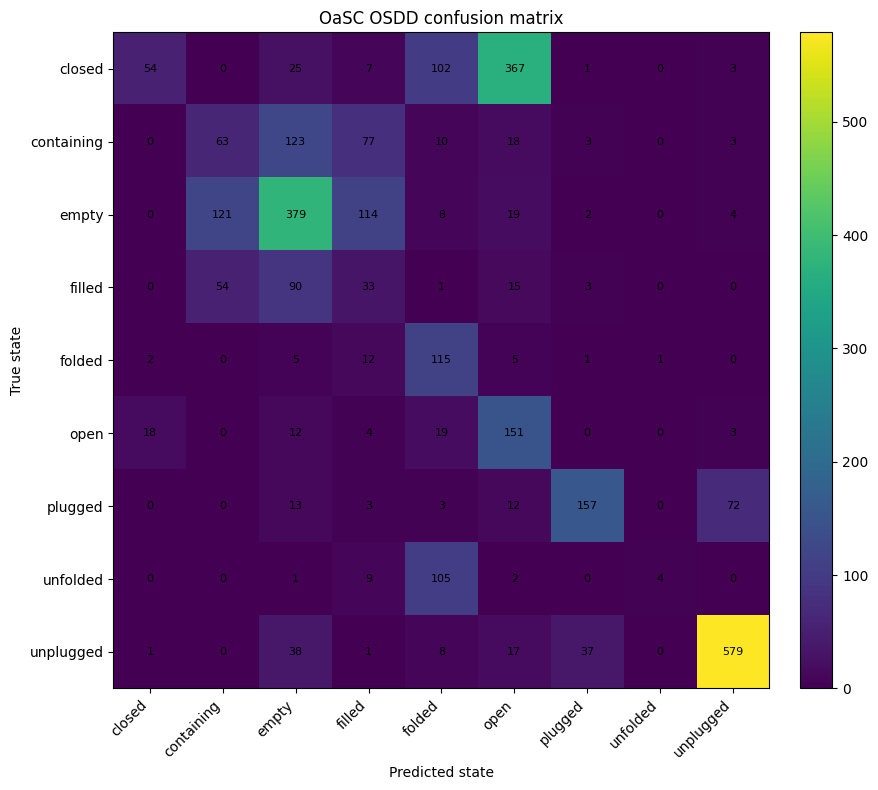

In [11]:
# Cell 13 — Per-state accuracy + confusion matrix
from sklearn.metrics import confusion_matrix
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

cm = confusion_matrix(targets.numpy(), preds.numpy(), labels=list(range(len(OSDD_CLASSES))))
per_state = []
for i, name in enumerate(OSDD_CLASSES):
    total_i = cm[i].sum()
    acc_i = (cm[i, i] / total_i) if total_i else np.nan
    per_state.append({
        'state': name,
        'split': 'unseen' if i in UNSEEN_IDS else 'seen',
        'samples': int(total_i),
        'accuracy_%': 100 * acc_i,
    })

per_state_df = pd.DataFrame(per_state)
display(per_state_df.round(2))

fig, ax = plt.subplots(figsize=(9, 8))
im = ax.imshow(cm)
ax.set_xticks(range(len(OSDD_CLASSES)), OSDD_CLASSES, rotation=45, ha='right')
ax.set_yticks(range(len(OSDD_CLASSES)), OSDD_CLASSES)
ax.set_xlabel('Predicted state')
ax.set_ylabel('True state')
ax.set_title('OaSC OSDD confusion matrix')

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, str(cm[i, j]), ha='center', va='center', fontsize=8)

plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.tight_layout()
plt.show()

# ✅ At this point, OaSC is working

You now have a complete **released-model reproduction path**:

`OSDD image → fine-tuned ResNet-101 feature → KG/Tr-GCN-generated state weights → state score → seen/unseen calibration`

For tomorrow's presentation, save the output of:

1. the summary metric table,
2. the seen/unseen trade-off curve,
3. the qualitative prediction grid,
4. the per-state results/confusion matrix.

---

# Optional: fine-tune the visual backbone yourself

The released embeddings already represent the KG/Tr-GCN output. The code below lets you train the **visual ResNet stage** on the OSDD training folders while freezing the KG-generated classifier head, matching the intent of the original OaSC fine-tuning procedure.

For a presentation tomorrow, keep `RUN_FINETUNE = False` until the pretrained reproduction above works. Then turn it on only if you have time.

In [13]:
# Cell 14 — OPTIONAL: fine-tune ResNet-101 using the released Tr-GCN state weights
RUN_FINETUNE = True
FINETUNE_EPOCHS = 10       # paper script uses 150; start small for debugging
FINETUNE_BATCH_SIZE = 32
LR = 1e-4

if RUN_FINETUNE:
    from torchvision.models import resnet101, ResNet101_Weights
    from torch.utils.data import DataLoader, Dataset
    import torch.nn as nn
    import torch.optim as optim
    from tqdm.auto import tqdm

    TRAIN_DIR = METHOD_DIR / 'datasets/osdd/train'
    base_train_ds = datasets.ImageFolder(TRAIN_DIR, transform=transform)
    print('Folders present in training directory:', base_train_ds.classes)

    # Enforce the zero-shot protocol even if the downloaded train directory
    # happens to contain folders for all nine states: only SEEN states are used.
    seen_names_in_train = [name for name in base_train_ds.classes if name in [OSDD_CLASSES[i] for i in SEEN_IDS]]
    local_seen_name_to_label = {name: i for i, name in enumerate(seen_names_in_train)}

    kept = []
    for sample_idx, (_, folder_label) in enumerate(base_train_ds.samples):
        name = base_train_ds.classes[folder_label]
        if name in local_seen_name_to_label:
            kept.append((sample_idx, local_seen_name_to_label[name]))

    class SeenOnlyDataset(Dataset):
        def __init__(self, base, kept_pairs):
            self.base = base
            self.kept_pairs = kept_pairs
            self.classes = seen_names_in_train
        def __len__(self):
            return len(self.kept_pairs)
        def __getitem__(self, idx):
            base_idx, new_label = self.kept_pairs[idx]
            image, _ = self.base[base_idx]
            return image, new_label

    train_ds = SeenOnlyDataset(base_train_ds, kept)
    print('Seen states used for fine-tuning:', train_ds.classes)
    print('Training images after seen-only filtering:', len(train_ds))

    # Select the OaSC classifier vector corresponding to each local training class.
    train_global_ids = [CLASS_TO_GLOBAL[name] for name in train_ds.classes]
    fc_vectors = state_vectors.detach()[train_global_ids].clone()

    try:
        model = resnet101(weights=ResNet101_Weights.IMAGENET1K_V1)
    except Exception:
        model = resnet101(pretrained=True)

    in_features = model.fc.in_features
    model.fc = nn.Linear(in_features, len(train_ds.classes))
    with torch.no_grad():
        model.fc.weight.copy_(fc_vectors[:, :-1].cpu())
        model.fc.bias.copy_(fc_vectors[:, -1].cpu())

    # OaSC: keep KG-predicted final classifier parameters fixed while adapting
    # the visual feature extractor using images of seen states only.
    model.fc.weight.requires_grad = False
    model.fc.bias.requires_grad = False
    model = model.to(DEVICE)

    loader = DataLoader(
        train_ds,
        batch_size=FINETUNE_BATCH_SIZE,
        shuffle=True,
        num_workers=2,
        pin_memory=torch.cuda.is_available(),
    )

    optimizer = optim.SGD(
        [p for p in model.parameters() if p.requires_grad],
        lr=LR,
        momentum=0.9,
    )
    criterion = nn.CrossEntropyLoss()

    for epoch in range(FINETUNE_EPOCHS):
        model.train()
        running_loss, correct, n = 0.0, 0, 0
        bar = tqdm(loader, desc=f'Epoch {epoch+1}/{FINETUNE_EPOCHS}')
        for images, labels in bar:
            images = images.to(DEVICE, non_blocking=True)
            labels = labels.to(DEVICE, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)
            logits = model(images)
            loss = criterion(logits, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            correct += (logits.argmax(1) == labels).sum().item()
            n += images.size(0)
            bar.set_postfix(loss=running_loss/n, acc=correct/n)

    out_path = WORK / 'oasc_osdd_refinetuned_resnet101.pth'
    torch.save(model.state_dict(), out_path)
    print('Saved:', out_path)
else:
    print('Skipping fine-tuning. Set RUN_FINETUNE=True when you are ready.')

Folders present in training directory: ['closed', 'containing', 'plugged', 'unfolded', 'unplugged']
Seen states used for fine-tuning: ['closed', 'containing', 'plugged', 'unfolded', 'unplugged']
Training images after seen-only filtering: 4550
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


100%|██████████| 171M/171M [00:01<00:00, 161MB/s]  


Epoch 1/10:   0%|          | 0/143 [00:00<?, ?it/s]

Epoch 2/10:   0%|          | 0/143 [00:00<?, ?it/s]

Epoch 3/10:   0%|          | 0/143 [00:00<?, ?it/s]

Epoch 4/10:   0%|          | 0/143 [00:00<?, ?it/s]

Epoch 5/10:   0%|          | 0/143 [00:00<?, ?it/s]

Epoch 6/10:   0%|          | 0/143 [00:00<?, ?it/s]

Epoch 7/10:   0%|          | 0/143 [00:00<?, ?it/s]

Epoch 8/10:   0%|          | 0/143 [00:00<?, ?it/s]

Epoch 9/10:   0%|          | 0/143 [01:10<?, ?it/s]

Epoch 10/10:   0%|          | 0/143 [00:00<?, ?it/s]

Saved: /kaggle/working/oasc_osdd_refinetuned_resnet101.pth


In [14]:
# Cell 15 — Evaluate OUR 10-epoch fine-tuned ResNet-101 with OaSC

import torch
import numpy as np
import pandas as pd
import torch.nn as nn
from tqdm.auto import tqdm

# ---------------------------------------------------------
# 1. Remove temporary 5-seen-state training classifier
# ---------------------------------------------------------
# The model has already been saved in Cell 14, so it is safe
# to replace the FC layer now.
model.fc = nn.Identity()
model = model.to(DEVICE).eval()

print("Evaluating our fine-tuned backbone...")
print("Using ALL OSDD states:")
print(OSDD_CLASSES)

# ---------------------------------------------------------
# 2. Extract test features and classify with ALL 9
#    Tr-GCN/KG-generated classifier vectors
# ---------------------------------------------------------
ft_scores_list = []
ft_targets_list = []

with torch.inference_mode():

    for images, folder_labels in tqdm(
        test_loader,
        desc="Fine-tuned OaSC inference"
    ):

        images = images.to(
            DEVICE,
            non_blocking=True
        )

        # ResNet-101 feature
        features = model(images)            # [B, 2048]

        # Append constant 1 so that the last element
        # of every KG vector acts as classifier bias.
        features_aug = torch.cat(
            [
                features,
                torch.ones(
                    features.shape[0],
                    1,
                    device=features.device
                )
            ],
            dim=1
        )                                   # [B, 2049]

        # ALL 9 state classifiers
        batch_scores = (
            features_aug @ state_vectors.T
        )                                   # [B, 9]

        batch_targets = torch.tensor(
            [
                folder_idx_to_global[int(x)]
                for x in folder_labels
            ],
            dtype=torch.long
        )

        ft_scores_list.append(
            batch_scores.cpu()
        )

        ft_targets_list.append(
            batch_targets
        )


ft_scores = torch.cat(
    ft_scores_list,
    dim=0
)

ft_targets = torch.cat(
    ft_targets_list,
    dim=0
)

print()
print("Scores shape :", ft_scores.shape)
print("Targets shape:", ft_targets.shape)

assert ft_scores.shape == (
    len(test_ds),
    len(OSDD_CLASSES)
)

print("✓ Feature extraction finished")

Evaluating our fine-tuned backbone...
Using ALL OSDD states:
['closed', 'containing', 'empty', 'filled', 'folded', 'open', 'plugged', 'unfolded', 'unplugged']


Fine-tuned OaSC inference:   0%|          | 0/25 [00:00<?, ?it/s]


Scores shape : torch.Size([3109, 9])
Targets shape: torch.Size([3109])
✓ Feature extraction finished


In [15]:
# Cell 16 — Seen / Unseen / HM / AUC for our fine-tuned model

def evaluate_ft_gamma(scores, targets, gamma):

    calibrated = scores.clone()

    # Same calibration procedure used for baseline OaSC
    calibrated[:, UNSEEN_IDS] += float(gamma)

    pred = calibrated.argmax(dim=1)

    seen_mask = torch.tensor(
        [int(y) in SEEN_IDS for y in targets],
        dtype=torch.bool
    )

    unseen_mask = ~seen_mask

    seen_acc = (
        (pred[seen_mask] == targets[seen_mask])
        .float()
        .mean()
        .item()
    )

    unseen_acc = (
        (pred[unseen_mask] == targets[unseen_mask])
        .float()
        .mean()
        .item()
    )

    total_acc = (
        (pred == targets)
        .float()
        .mean()
        .item()
    )

    if seen_acc + unseen_acc == 0:
        hm = 0
    else:
        hm = (
            2 * seen_acc * unseen_acc
            / (seen_acc + unseen_acc)
        )

    return (
        total_acc,
        seen_acc,
        unseen_acc,
        hm
    )


# Same gamma sweep as baseline
gammas = np.arange(
    -5.0,
    15.125,
    0.5
)

ft_rows = []

for gamma in gammas:

    total, seen, unseen, hm = (
        evaluate_ft_gamma(
            ft_scores,
            ft_targets,
            gamma
        )
    )

    ft_rows.append({
        "gamma": gamma,
        "total_acc": total,
        "seen_acc": seen,
        "unseen_acc": unseen,
        "harmonic_mean": hm
    })


ft_results = pd.DataFrame(ft_rows)

# Best HM operating point
ft_best_idx = (
    ft_results["harmonic_mean"]
    .idxmax()
)

ft_best = ft_results.loc[
    ft_best_idx
]

# Same AUC definition as our baseline notebook
try:
    ft_auc = np.trapezoid(
        ft_results["seen_acc"].to_numpy(),
        ft_results["unseen_acc"].to_numpy()
    )
except AttributeError:
    ft_auc = np.trapz(
        ft_results["seen_acc"].to_numpy(),
        ft_results["unseen_acc"].to_numpy()
    )


print("\n======================================")
print(" OUR 10-EPOCH FINE-TUNED OaSC")
print("======================================")

print(
    f"Best gamma       : "
    f"{ft_best['gamma']:.2f}"
)

print(
    f"Seen @ best HM   : "
    f"{100*ft_best['seen_acc']:.2f}%"
)

print(
    f"Unseen @ best HM : "
    f"{100*ft_best['unseen_acc']:.2f}%"
)

print(
    f"Best HM          : "
    f"{100*ft_best['harmonic_mean']:.2f}%"
)

print(
    f"Max seen acc     : "
    f"{100*ft_results['seen_acc'].max():.2f}%"
)

print(
    f"Max unseen acc   : "
    f"{100*ft_results['unseen_acc'].max():.2f}%"
)

print(
    f"AUC              : "
    f"{100*ft_auc:.2f}"
)


 OUR 10-EPOCH FINE-TUNED OaSC
Best gamma       : 2.50
Seen @ best HM   : 42.34%
Unseen @ best HM : 51.30%
Best HM          : 46.39%
Max seen acc     : 85.61%
Max unseen acc   : 59.61%
AUC              : 35.61


In [16]:
# Cell 17 — Compare released OaSC vs our 10-epoch training

comparison = pd.DataFrame([
    {
        "Method":
            "OaSC — released checkpoint",

        "Training":
            "Authors' released model",

        "Max Seen (%)":
            100 * results["seen_acc"].max(),

        "Max Unseen (%)":
            100 * results["unseen_acc"].max(),

        "Seen @ best HM (%)":
            100 * best["seen_acc"],

        "Unseen @ best HM (%)":
            100 * best["unseen_acc"],

        "Best HM (%)":
            100 * best["harmonic_mean"],

        "AUC":
            100 * auc
    },

    {
        "Method":
            "OaSC — our fine-tuning",

        "Training":
            f"{FINETUNE_EPOCHS} epochs",

        "Max Seen (%)":
            100 * ft_results["seen_acc"].max(),

        "Max Unseen (%)":
            100 * ft_results["unseen_acc"].max(),

        "Seen @ best HM (%)":
            100 * ft_best["seen_acc"],

        "Unseen @ best HM (%)":
            100 * ft_best["unseen_acc"],

        "Best HM (%)":
            100 * ft_best["harmonic_mean"],

        "AUC":
            100 * ft_auc
    }
])

display(
    comparison.round(2)
)

,Method,Training,Max Seen (%),Max Unseen (%),Seen @ best HM (%),Unseen @ best HM (%),Best HM (%),AUC
0,OaSC — released checkpoint,Authors' released model,84.46,64.82,44.68,56.93,50.07,40.16
1,OaSC — our fine-tuning,10 epochs,85.61,59.61,42.34,51.30,46.39,35.61


In [17]:
# Cell 18 — Per-state accuracy at our best HM gamma

best_ft_gamma = float(
    ft_best["gamma"]
)

calibrated_ft = ft_scores.clone()

calibrated_ft[:, UNSEEN_IDS] += (
    best_ft_gamma
)

ft_preds = calibrated_ft.argmax(
    dim=1
)

per_state_rows = []

for class_id, state_name in enumerate(
    OSDD_CLASSES
):

    mask = (
        ft_targets == class_id
    )

    n_samples = int(
        mask.sum()
    )

    if n_samples > 0:

        accuracy = (
            (
                ft_preds[mask]
                == ft_targets[mask]
            )
            .float()
            .mean()
            .item()
        )

    else:
        accuracy = float("nan")

    state_type = (
        "UNSEEN"
        if class_id in UNSEEN_IDS
        else "SEEN"
    )

    per_state_rows.append({
        "State": state_name,
        "Type": state_type,
        "Samples": n_samples,
        "Accuracy (%)":
            100 * accuracy
    })


per_state_df = pd.DataFrame(
    per_state_rows
)

display(
    per_state_df.round(2)
)

,State,Type,Samples,Accuracy (%)
0,closed,SEEN,559,3.40
1,containing,SEEN,297,27.27
2,empty,UNSEEN,647,48.69
3,filled,UNSEEN,196,23.98
4,folded,UNSEEN,141,65.25
5,open,UNSEEN,207,75.85
6,plugged,SEEN,260,60.77
7,unfolded,SEEN,121,7.44
8,unplugged,SEEN,681,80.03


In [18]:
# Baseline
# ConceptNet + WordNet KG
#           ↓
#         Tr-GCN
#           ↓
# 2049-D classifiers
#           ↓
#       ResNet-101
#           ↓
#        OaSC

In [21]:
# Cell 19 — Inspect the ACTUAL OaSC knowledge-graph pipeline
# ----------------------------------------------------------
# Goal:
#   1. Find the graph/data files supplied by the authors.
#   2. Inspect how train_gnn.py loads the graph.
#   3. Inspect the KG implementation files.
#
# Do NOT modify anything yet.

from pathlib import Path
import os
import re

print("=" * 80)
print("1. OaSC SRC DIRECTORY")
print("=" * 80)
print("SRC_DIR =", SRC_DIR)
print("Exists  =", SRC_DIR.exists())


# ----------------------------------------------------------
# A. Show relevant directories
# ----------------------------------------------------------

roots = [
    SRC_DIR / "data",
    SRC_DIR / "KG",
    METHOD_DIR / "embeddings",
]

for root in roots:
    print("\n")
    print("=" * 80)
    print("DIRECTORY:", root)
    print("=" * 80)

    if not root.exists():
        print("MISSING")
        continue

    files = sorted([
        p for p in root.rglob("*")
        if p.is_file()
    ])

    print("Number of files:", len(files))

    for p in files[:200]:
        try:
            rel = p.relative_to(METHOD_DIR)
        except Exception:
            rel = p

        size_mb = p.stat().st_size / (1024 ** 2)

        print(
            f"{str(rel):75s} "
            f"{size_mb:9.3f} MB"
        )


# ----------------------------------------------------------
# B. Search specifically for files that look graph-related
# ----------------------------------------------------------

print("\n")
print("=" * 80)
print("2. POSSIBLE GRAPH FILES")
print("=" * 80)

keywords = [
    "osdd",
    "conceptnet",
    "wordnet",
    "graph",
    "adj",
    "edge",
]

candidate_files = []

for root in roots:

    if not root.exists():
        continue

    for p in root.rglob("*"):

        if not p.is_file():
            continue

        name = str(p).lower()

        if any(k in name for k in keywords):
            candidate_files.append(p)


candidate_files = sorted(
    set(candidate_files)
)

for i, p in enumerate(candidate_files):

    try:
        rel = p.relative_to(METHOD_DIR)
    except Exception:
        rel = p

    print(
        f"[{i:03d}] "
        f"{rel} "
        f"({p.stat().st_size / 1024**2:.3f} MB)"
    )


# ----------------------------------------------------------
# C. Print train_gnn.py
# ----------------------------------------------------------

train_gnn_path = SRC_DIR / "train_gnn.py"

print("\n")
print("=" * 80)
print("3. train_gnn.py")
print("=" * 80)

if train_gnn_path.exists():

    train_gnn_text = train_gnn_path.read_text(
        errors="ignore"
    )

    lines = train_gnn_text.splitlines()

    print(
        "Number of lines:",
        len(lines)
    )

    # Print graph/data/model-related lines with numbers.
    interesting_terms = [
        "graph",
        "adj",
        "load",
        "data",
        "embedding",
        "dataset",
        "pickle",
        "torch.load",
        "np.load",
        "networkx",
        "gcn",
    ]

    for i, line in enumerate(lines, start=1):

        line_lower = line.lower()

        if any(
            term in line_lower
            for term in interesting_terms
        ):
            print(
                f"{i:04d}: {line}"
            )

else:
    print("train_gnn.py NOT FOUND")


# ----------------------------------------------------------
# D. List Python files inside KG/
# ----------------------------------------------------------

kg_dir = SRC_DIR / "KG"

print("\n")
print("=" * 80)
print("4. KG PYTHON MODULES")
print("=" * 80)

if kg_dir.exists():

    for p in sorted(
        kg_dir.rglob("*.py")
    ):
        print(
            p.relative_to(SRC_DIR)
        )


print("\n✓ Inspection finished.")

1. OaSC SRC DIRECTORY
SRC_DIR = /kaggle/working/OaSC_official/OaSC/src
Exists  = True


DIRECTORY: /kaggle/working/OaSC_official/OaSC/src/data
Number of files: 66
src/data/gnn_weights/gcn_0_imagenet.pt                                         18.369 MB
src/data/gnn_weights/weights_trgcn.pt                                          67.482 MB
src/data/kgs_concepts/__init__.py                                               0.000 MB
src/data/kgs_concepts/apy_concepts.txt                                          0.000 MB
src/data/kgs_concepts/awa_concepts.txt                                          0.001 MB
src/data/kgs_concepts/cn-wk-from-cskg-states-hops0_concepts.txt                 0.000 MB
src/data/kgs_concepts/cn-wk-from-cskg-states-hops1_concepts.txt                 0.000 MB
src/data/kgs_concepts/cn-wn-wk-from-cskg-states-hops0_concepts.txt              0.000 MB
src/data/kgs_concepts/cn-wn-wk-from-cskg-states-hops1_concepts.txt              0.000 MB
src/data/kgs_concepts/cn_from_cskg_s

In [20]:
# Cell 20 — Find where the selected OSDD graph is loaded/constructed

SEARCH_TERMS = [
    "conceptnet_wordnet",
    "conceptnet",
    "wordnet",
    "osdd",
    "graph_type",
    "hop1",
    "thresh",
]

python_files = list(
    SRC_DIR.rglob("*.py")
)

for term in SEARCH_TERMS:

    print("\n")
    print("=" * 80)
    print("SEARCH:", term)
    print("=" * 80)

    found = False

    for path in python_files:

        text = path.read_text(
            errors="ignore"
        )

        lines = text.splitlines()

        for lineno, line in enumerate(
            lines,
            start=1
        ):

            if term.lower() in line.lower():

                found = True

                print(
                    f"{path.relative_to(SRC_DIR)}:"
                    f"{lineno}: {line.strip()}"
                )

    if not found:
        print("No occurrence found.")



SEARCH: conceptnet_wordnet
train_gnn.py:464: conceptnet_wordnet_hop2_thresh_10 = os.path.join(DIR_PATH, "data/subgraphs/conceptnet-wordnet-hop2-thresh-10")
train_gnn.py:467: conceptnet_wordnet_hop1_thresh_10 = os.path.join(DIR_PATH, "data/subgraphs/conceptnet-wordnet-hop1-thresh-10")
train_gnn.py:468: conceptnet_wordnet_hop1_thresh_0 = os.path.join(DIR_PATH, "data/subgraphs/conceptnet-wordnet-hop1-thresh-0")
train_gnn.py:576: "conceptnet_wordnet_hop2_thresh_10":   conceptnet_wordnet_hop2_thresh_10 ,
train_gnn.py:577: "conceptnet_wordnet_hop1_thresh_10":   conceptnet_wordnet_hop1_thresh_10 ,
train_gnn.py:578: "conceptnet_wordnet_hop1_thresh_0":   conceptnet_wordnet_hop1_thresh_0 ,
train_gnn.py:690: graph_paths = [conceptnet_wordnet_hop1_thresh_10
train_gnn.py:696: for i, dataset in enumerate(["conceptnet_wordnet_hop1_thresh_10"        ]):


SEARCH: conceptnet
train_gnn.py:13: from KG.knowledge_graph.conceptnet import ConceptNetKG
train_gnn.py:25: kg = ConceptNetKG.load_from_disk(graph

In [26]:
# ============================================================
# CLEAN KG INSPECTION — NO MASSIVE OUTPUT
# ============================================================

import torch
from collections import Counter

GRAPH_DATA = (
    SRC_DIR
    / "data"
    / "subgraphs"
    / "conceptnet-wordnet-hop1-thresh-10"
    / "graph_data.pt"
)

g = torch.load(
    GRAPH_DATA,
    map_location="cpu",
    weights_only=False
)

nodes = g["nodes"]
features = g["features"]
edges = g["edges"]
adj_lists = g["adj_lists"]
rw_adj_lists = g["rw_adj_lists"]

print("===== OaSC KNOWLEDGE GRAPH =====")
print("Nodes    :", len(nodes))
print("Edges    :", len(edges))
print("Features :", tuple(features.shape))

# ------------------------------------------------------------
# OSDD state nodes
# ------------------------------------------------------------

print("\n===== OSDD STATE NODES =====")

state_node_ids = {}

for state in OSDD_CLASSES:
    matches = [
        i for i, n in enumerate(nodes)
        if str(n).lower() == state.lower()
    ]

    if matches:
        state_node_ids[state] = matches[0]
        print(f"{state:12s} -> node {matches[0]}")
    else:
        print(f"{state:12s} -> NOT FOUND")


# ------------------------------------------------------------
# Show ONLY direct/random-walk neighbours for each OSDD state
# ------------------------------------------------------------

print("\n===== STATE NEIGHBOURS =====")

for state, sid in state_node_ids.items():

    neighs = rw_adj_lists.get(sid, [])

    # OaSC sorts by the LAST value = random-walk hitting probability
    neighs = sorted(
        neighs,
        key=lambda x: x[-1],
        reverse=True
    )

    print(f"\n{state.upper()} — {len(neighs)} neighbours")

    for item in neighs[:15]:

        neighbour_id = int(item[0])
        probability = float(item[-1])

        print(
            f"  {nodes[neighbour_id]:25s} "
            f"RW={probability:.4f}"
        )

===== OaSC KNOWLEDGE GRAPH =====
Nodes    : 411
Edges    : 3420
Features : (411, 300)

===== OSDD STATE NODES =====
closed       -> node 88
containing   -> node 107
empty        -> node 1
filled       -> node 105
folded       -> node 92
open         -> node 3
plugged      -> node 99
unfolded     -> node 141
unplugged    -> node 365

===== STATE NEIGHBOURS =====

CLOSED — 75 neighbours
  open                      RW=0.1676
  open                      RW=0.1676
  semialgebra               RW=0.0391
  superdisk                 RW=0.0279
  pluriclosed               RW=0.0223
  monoid                    RW=0.0223
  subgroupoid               RW=0.0223
  ellipse                   RW=0.0223
  cycle                     RW=0.0223
  superellipse              RW=0.0168
  compact                   RW=0.0168
  biodome                   RW=0.0168
  symplectic                RW=0.0168
  knot                      RW=0.0168
  cosymplectic              RW=0.0168

CONTAINING — 29 neighbours
  container   

In [24]:
# ============================================================
# Cell 22 — Locate the 9 OSDD state nodes
# ============================================================

print("OSDD classes:")
print(OSDD_CLASSES)

node_to_id = {
    node: i
    for i, node in enumerate(nodes)
}


def normalize_concept_name(x):
    """
    Convert ConceptNet-style names such as:
        /c/en/open
        /c/en/open/a
    into something easier to compare.
    """
    x = str(x).lower()

    if "/c/en/" in x:
        x = x.split("/c/en/")[1]

    x = x.split("/")[0]

    return x.replace("_", " ").strip()


normalized_to_ids = defaultdict(list)

for idx, node in enumerate(nodes):
    normalized_to_ids[
        normalize_concept_name(node)
    ].append(idx)


state_node_ids = {}

print("\n" + "=" * 80)
print("MATCHED STATE NODES")
print("=" * 80)

for state in OSDD_CLASSES:

    matches = normalized_to_ids.get(
        state.lower(),
        []
    )

    print(f"\nSTATE: {state}")
    print("matches:", matches)

    for idx in matches:
        print(
            f"  {idx:4d}: {nodes[idx]}"
        )

    if len(matches) > 0:
        state_node_ids[state] = matches[0]


print("\nState → selected node ID")
print(state_node_ids)

OSDD classes:
['closed', 'containing', 'empty', 'filled', 'folded', 'open', 'plugged', 'unfolded', 'unplugged']

MATCHED STATE NODES

STATE: closed
matches: [88]
    88: closed

STATE: containing
matches: [107]
   107: containing

STATE: empty
matches: [1]
     1: empty

STATE: filled
matches: [105]
   105: filled

STATE: folded
matches: [92]
    92: folded

STATE: open
matches: [3]
     3: open

STATE: plugged
matches: [99]
    99: plugged

STATE: unfolded
matches: [141]
   141: unfolded

STATE: unplugged
matches: [365]
   365: unplugged

State → selected node ID
{'closed': 88, 'containing': 107, 'empty': 1, 'filled': 105, 'folded': 92, 'open': 3, 'plugged': 99, 'unfolded': 141, 'unplugged': 365}


In [25]:
# ============================================================
# Cell 23 — Show each state's actual KG neighborhood
# ============================================================

def relation_name(rel_id):
    if relations is None:
        return str(rel_id)

    try:
        return relations[int(rel_id)]
    except Exception:
        return str(rel_id)


def show_state_neighbors(
    state,
    top_n=30
):

    if state not in state_node_ids:
        print(
            f"No KG node found for {state}"
        )
        return []

    state_id = state_node_ids[state]

    print("\n" + "=" * 100)
    print(
        f"{state.upper()} "
        f"(node ID {state_id}, "
        f"KG name = {nodes[state_id]})"
    )
    print("=" * 100)

    neighs = rw_adj_lists.get(
        state_id,
        []
    )

    # Expected:
    # (neighbor_id, relation_id, random-walk probability)
    neighs_sorted = sorted(
        neighs,
        key=lambda x: float(x[-1]),
        reverse=True
    )

    rows = []

    for item in neighs_sorted[:top_n]:

        if len(item) == 3:
            neigh_id, rel_id, prob = item

        elif len(item) == 2:
            neigh_id, prob = item
            rel_id = None

        else:
            continue

        row = {
            "neighbor_id": int(neigh_id),
            "neighbor": nodes[int(neigh_id)],
            "clean_neighbor":
                normalize_concept_name(
                    nodes[int(neigh_id)]
                ),
            "relation":
                relation_name(rel_id)
                if rel_id is not None
                else "",
            "rw_probability":
                float(prob),
        }

        rows.append(row)

    return rows


all_state_neighbors = {}

for state in OSDD_CLASSES:

    rows = show_state_neighbors(
        state,
        top_n=40
    )

    all_state_neighbors[state] = rows

    if rows:

        df = pd.DataFrame(rows)

        display(
            df[
                [
                    "neighbor_id",
                    "clean_neighbor",
                    "relation",
                    "rw_probability"
                ]
            ]
        )


CLOSED (node ID 88, KG name = closed)


,neighbor_id,clean_neighbor,relation,rw_probability
0,3,open,\r\RelatedTo\,0.167598
1,3,open,\r\RelatedTo\,0.167598
2,87,semialgebra,\r\RelatedTo\,0.039106
3,326,superdisk,\r\RelatedTo\,0.027933
4,327,pluriclosed,\r\RelatedTo\,0.022346
5,363,monoid,\r\RelatedTo\,0.022346
6,343,subgroupoid,\r\RelatedTo\,0.022346
7,354,ellipse,\r\RelatedTo\,0.022346
8,89,cycle,\r\RelatedTo\,0.022346
9,341,superellipse,\r\RelatedTo\,0.016760



CONTAINING (node ID 107, KG name = containing)


,neighbor_id,clean_neighbor,relation,rw_probability
0,381,container,\r\RelatedTo\,0.108108
1,381,container,\r\RelatedTo\,0.108108
2,379,cysteine,\r\RelatedTo\,0.054054
3,386,saturated,\r\RelatedTo\,0.054054
4,399,contents,\r\RelatedTo\,0.045045
5,134,chocolate,\r\RelatedTo\,0.045045
6,308,paste,\r\RelatedTo\,0.045045
7,391,ferous,\r\RelatedTo\,0.045045
8,39,void,\r\RelatedTo\,0.036036
9,403,stele,\r\RelatedTo\,0.036036



EMPTY (node ID 1, KG name = empty)


,neighbor_id,clean_neighbor,relation,rw_probability
0,72,space,\r\DerivedFrom\,0.044693
1,72,space,\r\RelatedTo\,0.044693
2,72,space,\r\RelatedTo\,0.044693
3,16,full,\r\RelatedTo\,0.039106
4,16,full,\r\RelatedTo\,0.039106
5,16,full,\r\DerivedFrom\,0.039106
6,75,evacuate,\r\RelatedTo\,0.033520
7,75,evacuate,\r\RelatedTo\,0.033520
8,28,nullness,\r\RelatedTo\,0.027933
9,64,area,\r\RelatedTo\,0.022346



FILLED (node ID 105, KG name = filled)


,neighbor_id,clean_neighbor,relation,rw_probability
0,398,chockablock,\r\RelatedTo\,0.092784
1,323,billabong,\r\RelatedTo\,0.072165
2,395,jeon,\r\RelatedTo\,0.072165
3,376,black,\r\RelatedTo\,0.061856
4,111,starfilled,\r\RelatedTo\,0.051546
5,402,inflated,\r\RelatedTo\,0.051546
6,116,rife,\r\RelatedTo\,0.051546
7,368,funfilled,\r\RelatedTo\,0.051546
8,394,qingtuan,\r\RelatedTo\,0.051546
9,135,painfilled,\r\RelatedTo\,0.051546



FOLDED (node ID 92, KG name = folded)


,neighbor_id,clean_neighbor,relation,rw_probability
0,91,foldome,\r\RelatedTo\,0.08
1,104,blintz,\r\RelatedTo\,0.08
2,378,conduplicate,\r\RelatedTo\,0.07
3,388,linenfold,\r\RelatedTo\,0.06
4,410,convolution,\r\RelatedTo\,0.06
5,131,backfolded,\r\RelatedTo\,0.05
6,369,plicate,\r\RelatedTo\,0.05
7,400,polypeptide,\r\RelatedTo\,0.05
8,124,misfolded,\r\RelatedTo\,0.05
9,384,newspaper,\r\RelatedTo\,0.05



OPEN (node ID 3, KG name = open)


,neighbor_id,clean_neighbor,relation,rw_probability
0,88,closed,\r\RelatedTo\,0.099668
1,88,closed,\r\RelatedTo\,0.099668
2,168,close,\r\RelatedTo\,0.013289
3,256,privy,\r\RelatedTo\,0.013289
4,96,unconcealed,\r\RelatedTo\,0.013289
5,168,close,\r\RelatedTo\,0.013289
6,301,antonym of shut,\r\RelatedTo\,0.009967
7,292,combination,\r\RelatedTo\,0.009967
8,297,diurnal,\r\RelatedTo\,0.009967
9,273,draw,\r\RelatedTo\,0.009967



PLUGGED (node ID 99, KG name = plugged)


,neighbor_id,clean_neighbor,relation,rw_probability
0,100,stuffy,\r\RelatedTo\,0.54902
1,101,pluggable,\r\RelatedTo\,0.45098



UNFOLDED (node ID 141, KG name = unfolded)


,neighbor_id,clean_neighbor,relation,rw_probability
0,140,unfoldedness,\r\RelatedTo\,1.0



UNPLUGGED (node ID 365, KG name = unplugged)


,neighbor_id,clean_neighbor,relation,rw_probability
0,367,unplug,\r\RelatedTo\,0.539216
1,366,television,\r\RelatedTo\,0.460784


In [29]:
# ============================================================
# CLIP-guided visual semantic embeddings for all KG concepts
# ============================================================

!pip -q install transformers

import torch
import torch.nn.functional as F
from transformers import CLIPTokenizer, CLIPTextModelWithProjection

CLIP_NAME = "openai/clip-vit-base-patch32"

clip_tokenizer = CLIPTokenizer.from_pretrained(CLIP_NAME)

clip_text_model = CLIPTextModelWithProjection.from_pretrained(
    CLIP_NAME
).to(DEVICE)

clip_text_model.eval()


def encode_clip_text(texts, batch_size=64):

    all_embs = []

    for start in range(0, len(texts), batch_size):

        batch = texts[start:start + batch_size]

        tokens = clip_tokenizer(
            batch,
            padding=True,
            truncation=True,
            return_tensors="pt"
        ).to(DEVICE)

        with torch.inference_mode():

            output = clip_text_model(
                **tokens
            )

            emb = output.text_embeds

            emb = F.normalize(
                emb,
                p=2,
                dim=1
            )

        all_embs.append(
            emb.cpu()
        )

    return torch.cat(
        all_embs,
        dim=0
    )


# ------------------------------------------------------------
# Candidate node prompts
#
# We deliberately use VISUAL language.
# ------------------------------------------------------------

node_prompts = [
    f"a visual concept related to {str(node).replace('_', ' ')}"
    for node in nodes
]

clip_node_features = encode_clip_text(
    node_prompts
)

print(
    "CLIP KG node embeddings:",
    clip_node_features.shape
)


# ------------------------------------------------------------
# Target state prompts
# ------------------------------------------------------------

state_prompts = {
    state:
        f"a photo of an object that is {state}"
    for state in OSDD_CLASSES
}

state_clip_features = {}

for state, prompt in state_prompts.items():

    state_clip_features[state] = (
        encode_clip_text([prompt])[0]
    )

print("\nState prompts:")

for state, prompt in state_prompts.items():
    print(
        f"{state:12s} -> {prompt}"
    )

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

CLIPTextModelWithProjection LOAD REPORT from: openai/clip-vit-base-patch32
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
vision_model.encoder.layers.{0...11}.self_attn.v_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.mlp.fc2.bias              | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.out_proj.bias   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.q_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.k_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.mlp.fc2.weight            | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.mlp.fc1.bias              | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.out_proj.weight | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.k_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.la

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

CLIP KG node embeddings: torch.Size([411, 512])

State prompts:
closed       -> a photo of an object that is closed
containing   -> a photo of an object that is containing
empty        -> a photo of an object that is empty
filled       -> a photo of an object that is filled
folded       -> a photo of an object that is folded
open         -> a photo of an object that is open
plugged      -> a photo of an object that is plugged
unfolded     -> a photo of an object that is unfolded
unplugged    -> a photo of an object that is unplugged


In [30]:
# ============================================================
# CLIP-guided KG re-ranking
# ============================================================

import copy

RW_WEIGHT = 0.35
CLIP_WEIGHT = 0.65

MAX_NEIGHBORS = 20


def clip_rerank_state_neighbors(
    state,
    state_id,
    neighbor_list
):

    # --------------------------------------------------------
    # 1. Remove duplicate neighbor IDs
    # --------------------------------------------------------

    best_by_neighbor = {}

    for item in neighbor_list:

        nid = int(item[0])
        rw = float(item[-1])

        if (
            nid not in best_by_neighbor
            or rw > float(
                best_by_neighbor[nid][-1]
            )
        ):
            best_by_neighbor[nid] = item


    unique_items = list(
        best_by_neighbor.values()
    )

    if not unique_items:
        return []


    # --------------------------------------------------------
    # 2. Original random-walk scores
    # --------------------------------------------------------

    rw = torch.tensor([
        float(x[-1])
        for x in unique_items
    ])

    if rw.max() > rw.min():

        rw_norm = (
            rw - rw.min()
        ) / (
            rw.max() - rw.min()
        )

    else:
        rw_norm = torch.ones_like(
            rw
        )


    # --------------------------------------------------------
    # 3. CLIP visual semantic relevance
    # --------------------------------------------------------

    target = state_clip_features[state]

    clip_scores = []

    for item in unique_items:

        nid = int(item[0])

        similarity = torch.dot(
            target,
            clip_node_features[nid]
        ).item()

        # [-1,1] -> [0,1]
        similarity = (
            similarity + 1.0
        ) / 2.0

        clip_scores.append(
            similarity
        )


    clip_scores = torch.tensor(
        clip_scores
    )


    # --------------------------------------------------------
    # 4. Fuse graph structure + visual semantics
    # --------------------------------------------------------

    combined = (
        RW_WEIGHT * rw_norm
        +
        CLIP_WEIGHT * clip_scores
    )


    ranked = []

    for item, score in zip(
        unique_items,
        combined
    ):

        new_item = list(item)

        # NeighSampler uses the final element
        # as ranking score.
        new_item[-1] = float(score)

        ranked.append(
            tuple(new_item)
        )


    ranked.sort(
        key=lambda x: x[-1],
        reverse=True
    )

    return ranked[:MAX_NEIGHBORS]

In [31]:
# ============================================================
# Apply CLIP re-ranking to OSDD state nodes only
# ============================================================

clip_rw_adj_lists = copy.deepcopy(
    rw_adj_lists
)

for state, sid in state_node_ids.items():

    clip_rw_adj_lists[sid] = (
        clip_rerank_state_neighbors(
            state,
            sid,
            rw_adj_lists[sid]
        )
    )


clip_graph = copy.deepcopy(g)

clip_graph[
    "rw_adj_lists"
] = clip_rw_adj_lists

print("✓ CLIP-guided graph created")

✓ CLIP-guided graph created


In [32]:
# ============================================================
# Save CLIP-guided OaSC graph
# ============================================================

import shutil
import json
from pathlib import Path

CLIP_GRAPH_DIR = (
    SRC_DIR
    / "data"
    / "subgraphs"
    / "conceptnet-wordnet-hop1-thresh-10-clip"
)

CLIP_GRAPH_DIR.mkdir(
    parents=True,
    exist_ok=True
)

# Save modified graph
torch.save(
    clip_graph,
    CLIP_GRAPH_DIR / "graph_data.pt"
)

# OaSC loader expects the original params.pkl too
ORIGINAL_GRAPH_DIR = (
    SRC_DIR
    / "data"
    / "subgraphs"
    / "conceptnet-wordnet-hop1-thresh-10"
)

shutil.copy2(
    ORIGINAL_GRAPH_DIR / "params.pkl",
    CLIP_GRAPH_DIR / "params.pkl"
)

# Save our experiment settings too
with open(
    CLIP_GRAPH_DIR / "clip_reranking_config.json",
    "w"
) as f:
    json.dump(
        {
            "rw_weight": RW_WEIGHT,
            "clip_weight": CLIP_WEIGHT,
            "max_neighbors": MAX_NEIGHBORS,
            "modified_nodes": list(
                state_node_ids.keys()
            ),
            "description":
                "CLIP-guided semantic reranking of OSDD state-node neighborhoods"
        },
        f,
        indent=2
    )

print("✓ Saved modified graph to:")
print(CLIP_GRAPH_DIR)

print("\nFiles:")
for x in CLIP_GRAPH_DIR.iterdir():
    print(" ", x.name)

✓ Saved modified graph to:
/kaggle/working/OaSC_official/OaSC/src/data/subgraphs/conceptnet-wordnet-hop1-thresh-10-clip

Files:
  params.pkl
  graph_data.pt
  clip_reranking_config.json


In [33]:
# ============================================================
# Inspect released pretrained Tr-GCN checkpoint
# ============================================================

TRGCN_WEIGHTS = (
    SRC_DIR
    / "data"
    / "gnn_weights"
    / "weights_trgcn.pt"
)

print("Checkpoint:", TRGCN_WEIGHTS)
print("Exists    :", TRGCN_WEIGHTS.exists())

ckpt = torch.load(
    TRGCN_WEIGHTS,
    map_location="cpu",
    weights_only=False
)

print("\nObject type:")
print(type(ckpt))

if isinstance(ckpt, dict):
    print("\nNumber of entries:", len(ckpt))

    print("\n===== FIRST CHECKPOINT KEYS =====")

    for i, (key, value) in enumerate(
        ckpt.items()
    ):
        if i >= 80:
            break

        if torch.is_tensor(value):
            print(
                f"{key:100s}",
                tuple(value.shape)
            )
        else:
            print(
                f"{key:100s}",
                type(value)
            )

Checkpoint: /kaggle/working/OaSC_official/OaSC/src/data/gnn_weights/weights_trgcn.pt
Exists    : True

Object type:
<class 'collections.OrderedDict'>

Number of entries: 28

===== FIRST CHECKPOINT KEYS =====
conv.enc.w                                                                                           (2048, 2049)
conv.enc.b                                                                                           (2049,)
conv.enc.aggregator.features.features.enc.w                                                          (300, 2048)
conv.enc.aggregator.features.features.enc.b                                                          (2048,)
conv.enc.aggregator.features.features.enc.aggregator.attention.feedforward_0._linear_layers.0.weight (150, 300)
conv.enc.aggregator.features.features.enc.aggregator.attention.feedforward_0._linear_layers.0.bias   (150,)
conv.enc.aggregator.features.features.enc.aggregator.attention.feedforward_0._linear_layers.1.weight (300, 150)
conv.enc.aggreg

In [34]:
# ============================================================
# Pure-PyTorch compatibility implementation of OaSC Tr-GCN
#
# FIRST:
#   Reconstruct embeddings from ORIGINAL KG
#   and compare them with authors' released embeddings.
#
# THEN:
#   Generate embeddings from our CLIP-guided KG.
#
# No AllenNLP installation required.
# ============================================================

import math
import torch
import torch.nn.functional as F
import pandas as pd

# ------------------------------------------------------------
# Load released Tr-GCN weights
# ------------------------------------------------------------

TRGCN_WEIGHTS = (
    SRC_DIR
    / "data"
    / "gnn_weights"
    / "weights_trgcn.pt"
)

trgcn_ckpt = torch_load_compat(
    TRGCN_WEIGHTS,
    map_location="cpu"
)

trgcn_ckpt = {
    k: v.to(DEVICE)
    for k, v in trgcn_ckpt.items()
}

print("Loaded Tr-GCN parameters:", len(trgcn_ckpt))


# ============================================================
# AllenNLP 0.9 compatibility functions
# ============================================================

def legacy_layer_norm(x, gamma, beta, eps=1e-6):
    """
    AllenNLP-style LayerNorm used by the released checkpoint.
    """

    mean = x.mean(
        dim=-1,
        keepdim=True
    )

    # Old AllenNLP implementation used std directly.
    std = x.std(
        dim=-1,
        keepdim=True,
        unbiased=True
    )

    return (
        gamma
        * (x - mean)
        / (std + eps)
        + beta
    )


def legacy_feedforward(x, prefix):
    """
    2-layer AllenNLP FeedForward:
        Linear -> ReLU -> Linear
    Dropout is irrelevant in eval mode.
    """

    w0 = trgcn_ckpt[
        prefix
        + "feedforward_0._linear_layers.0.weight"
    ]

    b0 = trgcn_ckpt[
        prefix
        + "feedforward_0._linear_layers.0.bias"
    ]

    w1 = trgcn_ckpt[
        prefix
        + "feedforward_0._linear_layers.1.weight"
    ]

    b1 = trgcn_ckpt[
        prefix
        + "feedforward_0._linear_layers.1.bias"
    ]

    x = F.linear(
        x,
        w0,
        b0
    )

    x = F.relu(x)

    x = F.linear(
        x,
        w1,
        b1
    )

    return x


def legacy_self_attention(x, mask, prefix):
    """
    AllenNLP MultiHeadSelfAttention.

    OaSC uses ONE attention head, so we can reproduce
    the exact computation without needing AllenNLP.
    """

    combined_w = trgcn_ckpt[
        prefix
        + "self_attention_0._combined_projection.weight"
    ]

    combined_b = trgcn_ckpt[
        prefix
        + "self_attention_0._combined_projection.bias"
    ]

    output_w = trgcn_ckpt[
        prefix
        + "self_attention_0._output_projection.weight"
    ]

    output_b = trgcn_ckpt[
        prefix
        + "self_attention_0._output_projection.bias"
    ]

    projected = F.linear(
        x,
        combined_w,
        combined_b
    )

    projection_dim = (
        projected.shape[-1] // 3
    )

    queries, keys, values = torch.split(
        projected,
        projection_dim,
        dim=-1
    )

    # Q K^T / sqrt(d_k)
    attention_logits = (
        torch.matmul(
            queries,
            keys.transpose(-2, -1)
        )
        / math.sqrt(projection_dim)
    )

    # mask shape:
    # [batch, sequence]
    key_mask = (
        mask
        .bool()
        .unsqueeze(1)
    )

    attention_logits = (
        attention_logits.masked_fill(
            ~key_mask,
            -1e32
        )
    )

    attention_probs = F.softmax(
        attention_logits,
        dim=-1
    )

    attended = torch.matmul(
        attention_probs,
        values
    )

    output = F.linear(
        attended,
        output_w,
        output_b
    )

    return output


def legacy_transformer_block(
    x,
    mask,
    prefix
):
    """
    StackedSelfAttentionEncoder with one layer:

        FFN
         ↓
        residual + LayerNorm
         ↓
        self-attention
         ↓
        residual + LayerNorm
    """

    cached = x

    ff = legacy_feedforward(
        x,
        prefix
    )

    ff_gamma = trgcn_ckpt[
        prefix
        + "feedforward_layer_norm_0.gamma"
    ]

    ff_beta = trgcn_ckpt[
        prefix
        + "feedforward_layer_norm_0.beta"
    ]

    ff = legacy_layer_norm(
        ff + cached,
        ff_gamma,
        ff_beta
    )

    attention = legacy_self_attention(
        ff,
        mask,
        prefix
    )

    ln_gamma = trgcn_ckpt[
        prefix
        + "layer_norm_0.gamma"
    ]

    ln_beta = trgcn_ckpt[
        prefix
        + "layer_norm_0.beta"
    ]

    output = legacy_layer_norm(
        attention + ff,
        ln_gamma,
        ln_beta
    )

    return output


# ============================================================
# Graph utilities
# ============================================================

def sample_topk_neighbors(
    graph,
    node_ids,
    k
):
    """
    Same idea as OaSC NeighSampler(topk):
    rank using final tuple element and keep top-k.
    """

    sampled = []

    for node_id in node_ids:

        node_id = int(node_id)

        neighbours = (
            graph["rw_adj_lists"]
            .get(
                node_id,
                []
            )
        )

        neighbours = sorted(
            neighbours,
            key=lambda item: item[-1],
            reverse=True
        )

        if len(neighbours) >= k:
            neighbours = neighbours[:k]

        ids = set(
            int(item[0])
            for item in neighbours
        )

        # OaSC TransformerAggregator self_loop=True
        ids.add(node_id)

        sampled.append(ids)

    return sampled


def make_padded_neighborhood(
    sampled_sets,
    device
):
    """
    Same purpose as OaSC pad_tensor() +
    switch_subgraph_ids().
    """

    unique_nodes = sorted(
        set().union(
            *sampled_sets
        )
    )

    node_to_local = {
        node_id: i
        for i, node_id
        in enumerate(unique_nodes)
    }

    remapped = []

    for neighbors in sampled_sets:
        remapped.append([
            node_to_local[x]
            for x in neighbors
        ])

    max_len = max(
        len(x)
        for x in remapped
    )

    padded = []
    mask = []

    for neighborhood in remapped:

        length = len(neighborhood)

        padded.append(
            neighborhood
            + [0] * (
                max_len - length
            )
        )

        mask.append(
            [1] * length
            + [0] * (
                max_len - length
            )
        )

    padded = torch.tensor(
        padded,
        dtype=torch.long,
        device=device
    )

    mask = torch.tensor(
        mask,
        dtype=torch.bool,
        device=device
    )

    unique_nodes_tensor = torch.tensor(
        unique_nodes,
        dtype=torch.long,
        device=device
    )

    return (
        unique_nodes_tensor,
        padded,
        mask
    )


def masked_mean(x, mask):

    m = (
        mask
        .unsqueeze(-1)
        .to(x.dtype)
    )

    numerator = (
        x * m
    ).sum(dim=1)

    denominator = (
        m.sum(dim=1)
        .clamp_min(1e-13)
    )

    return (
        numerator
        / denominator
    )


# ============================================================
# Layer 1:
# 300 -> 2048
# sampler = top-100
# ============================================================

INNER_ATTN_PREFIX = (
    "conv.enc.aggregator."
    "features.features.enc."
    "aggregator.attention."
)

INNER_W_KEY = (
    "conv.enc.aggregator."
    "features.features.enc.w"
)

INNER_B_KEY = (
    "conv.enc.aggregator."
    "features.features.enc.b"
)


def trgcn_layer1(
    node_ids,
    graph
):

    node_ids = [
        int(x)
        for x in node_ids
    ]

    sampled = sample_topk_neighbors(
        graph,
        node_ids,
        k=100
    )

    (
        unique_nodes,
        padded,
        mask
    ) = make_padded_neighborhood(
        sampled,
        DEVICE
    )

    # Original 300-D KG node features
    graph_features = (
        graph["features"]
        .to(DEVICE)
        .float()
    )

    unique_features = (
        graph_features[
            unique_nodes
        ]
    )

    neigh_features = (
        unique_features[
            padded
        ]
    )

    # Transformer aggregation
    transformed = (
        legacy_transformer_block(
            neigh_features,
            mask,
            INNER_ATTN_PREFIX
        )
    )

    aggregated = masked_mean(
        transformed,
        mask
    )

    # Combine
    output = (
        aggregated
        @ trgcn_ckpt[
            INNER_W_KEY
        ]
        + trgcn_ckpt[
            INNER_B_KEY
        ]
    )

    # OaSC layer-1 settings
    output = F.leaky_relu(
        output,
        negative_slope=0.2
    )

    output = F.normalize(
        output,
        p=2,
        dim=1
    )

    return output


# ============================================================
# Layer 2:
# 2048 -> 2049
# sampler = top-50
# ============================================================

OUTER_ATTN_PREFIX = (
    "conv.enc.aggregator.attention."
)

OUTER_W_KEY = (
    "conv.enc.w"
)

OUTER_B_KEY = (
    "conv.enc.b"
)


def trgcn_predict_nodes(
    node_ids,
    graph
):

    node_ids = [
        int(x)
        for x in node_ids
    ]

    sampled = sample_topk_neighbors(
        graph,
        node_ids,
        k=50
    )

    (
        unique_nodes,
        padded,
        mask
    ) = make_padded_neighborhood(
        sampled,
        DEVICE
    )

    # Layer-2 input features are outputs
    # produced by layer 1.
    unique_features = trgcn_layer1(
        unique_nodes.tolist(),
        graph
    )

    neigh_features = (
        unique_features[
            padded
        ]
    )

    transformed = (
        legacy_transformer_block(
            neigh_features,
            mask,
            OUTER_ATTN_PREFIX
        )
    )

    aggregated = masked_mean(
        transformed,
        mask
    )

    output = (
        aggregated
        @ trgcn_ckpt[
            OUTER_W_KEY
        ]
        + trgcn_ckpt[
            OUTER_B_KEY
        ]
    )

    # Final OaSC graph embedding is normalized
    output = F.normalize(
        output,
        p=2,
        dim=1
    )

    return output


# ============================================================
# Find graph IDs for the 9 OSDD states
# ============================================================

node_to_id = {
    str(name): i
    for i, name
    in enumerate(g["nodes"])
}

oasc_state_node_ids = [
    node_to_id[state]
    for state in OSDD_CLASSES
]

print("\nOSDD state node IDs:")
for state, idx in zip(
    OSDD_CLASSES,
    oasc_state_node_ids
):
    print(
        f"{state:12s} -> {idx}"
    )


# ============================================================
# CRITICAL SANITY CHECK
#
# ORIGINAL GRAPH → our PyTorch Tr-GCN
# should reproduce released vectors.
# ============================================================

with torch.inference_mode():

    reconstructed_vectors = (
        trgcn_predict_nodes(
            oasc_state_node_ids,
            g
        )
    )


released_vectors = (
    state_vectors
    .detach()
    .to(DEVICE)
)


row_cosine = F.cosine_similarity(
    reconstructed_vectors,
    released_vectors,
    dim=1
)

mae = (
    reconstructed_vectors
    - released_vectors
).abs().mean().item()

max_error = (
    reconstructed_vectors
    - released_vectors
).abs().max().item()


validation_df = pd.DataFrame({
    "State": OSDD_CLASSES,
    "Cosine similarity":
        row_cosine.cpu().numpy()
})

display(
    validation_df.round(6)
)

print("\n===== COMPATIBILITY VALIDATION =====")
print(
    "Mean cosine similarity:",
    f"{row_cosine.mean().item():.6f}"
)
print(
    "Minimum cosine similarity:",
    f"{row_cosine.min().item():.6f}"
)
print(
    "Mean absolute error:",
    f"{mae:.8f}"
)
print(
    "Maximum absolute error:",
    f"{max_error:.8f}"
)


# ============================================================
# Only generate OUR vectors if compatibility is good
# ============================================================

if row_cosine.mean().item() >= 0.995:

    print(
        "\n✓ Compatibility looks good."
    )

    print(
        "Generating CLIP-guided "
        "Tr-GCN classifier vectors..."
    )

    with torch.inference_mode():

        clip_state_vectors = (
            trgcn_predict_nodes(
                oasc_state_node_ids,
                clip_graph
            )
        )

    print(
        "✓ New vectors:",
        tuple(
            clip_state_vectors.shape
        )
    )


    # How much each classifier changed
    old_new_cos = (
        F.cosine_similarity(
            released_vectors,
            clip_state_vectors,
            dim=1
        )
        .cpu()
        .numpy()
    )

    changed_df = pd.DataFrame({
        "State":
            OSDD_CLASSES,

        "Original vs CLIP KG cosine":
            old_new_cos,

        "Type": [
            "UNSEEN"
            if i in UNSEEN_IDS
            else "SEEN"
            for i in range(
                len(OSDD_CLASSES)
            )
        ]
    })

    print(
        "\nHow much did our graph "
        "change each classifier?"
    )

    display(
        changed_df.round(5)
    )

else:

    print(
        "\n⚠ STOP HERE."
    )

    print(
        "The compatibility implementation "
        "does not reproduce the released "
        "vectors closely enough yet."
    )

    print(
        "Send me the validation numbers "
        "before evaluating the CLIP graph."
    )

Loaded Tr-GCN parameters: 28

OSDD state node IDs:
closed       -> 88
containing   -> 107
empty        -> 1
filled       -> 105
folded       -> 92
open         -> 3
plugged      -> 99
unfolded     -> 141
unplugged    -> 365


,State,Cosine similarity
0,closed,0.999977
1,containing,0.999985
2,empty,0.999990
3,filled,0.999979
4,folded,0.999961
5,open,0.999987
6,plugged,1.000000
7,unfolded,0.999476
8,unplugged,0.999999



===== COMPATIBILITY VALIDATION =====
Mean cosine similarity: 0.999928
Minimum cosine similarity: 0.999476
Mean absolute error: 0.00013837
Maximum absolute error: 0.00334771

✓ Compatibility looks good.
Generating CLIP-guided Tr-GCN classifier vectors...
✓ New vectors: (9, 2049)

How much did our graph change each classifier?


,State,Original vs CLIP KG cosine,Type
0,closed,0.97420,SEEN
1,containing,0.99184,SEEN
2,empty,0.99072,UNSEEN
3,filled,0.99885,UNSEEN
4,folded,0.99882,UNSEEN
5,open,0.97841,UNSEEN
6,plugged,1.00000,SEEN
7,unfolded,0.99948,SEEN
8,unplugged,1.00000,SEEN


In [35]:
# ============================================================
# Evaluate OaSC + CLIP-guided KG
# SAME released ResNet
# SAME test data
# SAME calibration
# ONLY classifier vectors changed
# ============================================================

clip_scores_list = []
clip_targets_list = []

cnn.eval()

with torch.inference_mode():

    for images, folder_labels in tqdm(
        test_loader,
        desc="CLIP-KG OaSC inference"
    ):

        images = images.to(
            DEVICE,
            non_blocking=True
        )

        # Authors' released ResNet-101
        visual_features = cnn(
            images
        )

        visual_features_aug = torch.cat(
            [
                visual_features,

                torch.ones(
                    visual_features.shape[0],
                    1,
                    device=DEVICE
                )
            ],
            dim=1
        )

        batch_scores = (
            visual_features_aug
            @ clip_state_vectors.T
        )

        batch_targets = torch.tensor(
            [
                folder_idx_to_global[
                    int(x)
                ]
                for x
                in folder_labels
            ],
            dtype=torch.long
        )

        clip_scores_list.append(
            batch_scores.cpu()
        )

        clip_targets_list.append(
            batch_targets
        )


clip_scores = torch.cat(
    clip_scores_list,
    dim=0
)

clip_targets = torch.cat(
    clip_targets_list,
    dim=0
)


# ------------------------------------------------------------
# Exact same gamma sweep as baseline
# ------------------------------------------------------------

clip_rows = []

for gamma in gammas:

    total, seen, unseen, hm = (
        evaluate_gamma(
            clip_scores,
            clip_targets,
            gamma
        )
    )

    clip_rows.append({
        "gamma":
            gamma,

        "total_acc":
            total,

        "seen_acc":
            seen,

        "unseen_acc":
            unseen,

        "harmonic_mean":
            hm
    })


clip_results = pd.DataFrame(
    clip_rows
)

clip_best_idx = (
    clip_results[
        "harmonic_mean"
    ].idxmax()
)

clip_best = (
    clip_results.loc[
        clip_best_idx
    ]
)


try:

    clip_auc = np.trapezoid(
        clip_results[
            "seen_acc"
        ].to_numpy(),

        clip_results[
            "unseen_acc"
        ].to_numpy()
    )

except AttributeError:

    clip_auc = np.trapz(
        clip_results[
            "seen_acc"
        ].to_numpy(),

        clip_results[
            "unseen_acc"
        ].to_numpy()
    )


print(
    "\n=========================================="
)

print(
    " OaSC + CLIP-GUIDED KNOWLEDGE GRAPH"
)

print(
    "=========================================="
)

print(
    f"Best gamma       : "
    f"{clip_best['gamma']:.2f}"
)

print(
    f"Seen @ best HM   : "
    f"{100*clip_best['seen_acc']:.2f}%"
)

print(
    f"Unseen @ best HM : "
    f"{100*clip_best['unseen_acc']:.2f}%"
)

print(
    f"Best HM          : "
    f"{100*clip_best['harmonic_mean']:.2f}%"
)

print(
    f"Max seen acc     : "
    f"{100*clip_results['seen_acc'].max():.2f}%"
)

print(
    f"Max unseen acc   : "
    f"{100*clip_results['unseen_acc'].max():.2f}%"
)

print(
    f"AUC              : "
    f"{100*clip_auc:.2f}"
)


# ------------------------------------------------------------
# Baseline vs ours
# ------------------------------------------------------------

final_comparison = pd.DataFrame([
    {
        "Method":
            "Original OaSC",

        "KG":
            "ConceptNet + WordNet",

        "Max Seen (%)":
            100
            * results[
                "seen_acc"
            ].max(),

        "Max Unseen (%)":
            100
            * results[
                "unseen_acc"
            ].max(),

        "Best HM (%)":
            100
            * best[
                "harmonic_mean"
            ],

        "AUC":
            100 * auc
    },

    {
        "Method":
            "OaSC + CLIP-guided KG",

        "KG":
            "CLIP semantic reranking",

        "Max Seen (%)":
            100
            * clip_results[
                "seen_acc"
            ].max(),

        "Max Unseen (%)":
            100
            * clip_results[
                "unseen_acc"
            ].max(),

        "Best HM (%)":
            100
            * clip_best[
                "harmonic_mean"
            ],

        "AUC":
            100 * clip_auc
    }
])

display(
    final_comparison.round(2)
)

CLIP-KG OaSC inference:   0%|          | 0/25 [00:00<?, ?it/s]


 OaSC + CLIP-GUIDED KNOWLEDGE GRAPH
Best gamma       : 2.50
Seen @ best HM   : 43.48%
Unseen @ best HM : 56.76%
Best HM          : 49.24%
Max seen acc     : 84.72%
Max unseen acc   : 66.67%
AUC              : 39.53


,Method,KG,Max Seen (%),Max Unseen (%),Best HM (%),AUC
0,Original OaSC,ConceptNet + WordNet,84.46,64.82,50.07,40.16
1,OaSC + CLIP-guided KG,CLIP semantic reranking,84.72,66.67,49.24,39.53


In [36]:
# ============================================================
# Ablation: CLIP weight while preserving OaSC top-50 capacity
# ============================================================

import copy
import torch
import pandas as pd

MAX_NEIGHBORS_ABLATION = 50

CLIP_WEIGHTS = [
    0.20,
    0.35,
    0.50,
    0.65,
    0.80
]


def make_clip_reranked_graph(
    clip_weight,
    max_neighbors=50
):

    rw_weight = 1.0 - clip_weight

    modified_rw = copy.deepcopy(
        rw_adj_lists
    )

    for state, state_id in state_node_ids.items():

        original = rw_adj_lists[
            state_id
        ]

        # ------------------------------------
        # Deduplicate
        # ------------------------------------

        best_by_neighbor = {}

        for item in original:

            nid = int(item[0])
            rw_score = float(item[-1])

            if (
                nid not in best_by_neighbor
                or rw_score
                > float(
                    best_by_neighbor[nid][-1]
                )
            ):
                best_by_neighbor[nid] = item

        unique_items = list(
            best_by_neighbor.values()
        )

        if not unique_items:
            continue

        # ------------------------------------
        # Original RW scores
        # ------------------------------------

        rw_scores = torch.tensor([
            float(x[-1])
            for x in unique_items
        ])

        if rw_scores.max() > rw_scores.min():

            rw_norm = (
                rw_scores - rw_scores.min()
            ) / (
                rw_scores.max()
                - rw_scores.min()
            )

        else:
            rw_norm = torch.ones_like(
                rw_scores
            )

        # ------------------------------------
        # CLIP relevance to TARGET STATE
        # ------------------------------------

        target = state_clip_features[
            state
        ]

        clip_scores = []

        for item in unique_items:

            nid = int(item[0])

            similarity = torch.dot(
                target,
                clip_node_features[nid]
            ).item()

            similarity = (
                similarity + 1.0
            ) / 2.0

            clip_scores.append(
                similarity
            )

        clip_scores = torch.tensor(
            clip_scores
        )

        # ------------------------------------
        # Fusion
        # ------------------------------------

        combined = (
            rw_weight * rw_norm
            + clip_weight * clip_scores
        )

        ranked = []

        for item, score in zip(
            unique_items,
            combined
        ):

            new_item = list(item)
            new_item[-1] = float(score)

            ranked.append(
                tuple(new_item)
            )

        ranked.sort(
            key=lambda x: x[-1],
            reverse=True
        )

        modified_rw[state_id] = (
            ranked[:max_neighbors]
        )

    new_graph = copy.deepcopy(g)

    new_graph[
        "rw_adj_lists"
    ] = modified_rw

    return new_graph

In [37]:
# ============================================================
# Generate classifiers + evaluate every fusion setting
# ============================================================

ablation_rows = []
ablation_vectors = {}

for clip_weight in CLIP_WEIGHTS:

    rw_weight = 1.0 - clip_weight

    print(
        "\n======================================"
    )

    print(
        f"RW={rw_weight:.2f}, "
        f"CLIP={clip_weight:.2f}, "
        f"K={MAX_NEIGHBORS_ABLATION}"
    )

    print(
        "======================================"
    )

    candidate_graph = (
        make_clip_reranked_graph(
            clip_weight=clip_weight,
            max_neighbors=MAX_NEIGHBORS_ABLATION
        )
    )

    # -----------------------------------------
    # Generate new 2049-D classifier vectors
    # -----------------------------------------

    with torch.inference_mode():

        candidate_vectors = (
            trgcn_predict_nodes(
                oasc_state_node_ids,
                candidate_graph
            )
        )

    ablation_vectors[
        clip_weight
    ] = candidate_vectors.detach().clone()


    # -----------------------------------------
    # We ALREADY have visual_features if your
    # notebook cached them.
    #
    # If not, use the same inference code as
    # previous cell.
    # -----------------------------------------

    score_batches = []
    target_batches = []

    cnn.eval()

    with torch.inference_mode():

        for images, folder_labels in test_loader:

            images = images.to(
                DEVICE,
                non_blocking=True
            )

            visual = cnn(images)

            visual_aug = torch.cat(
                [
                    visual,
                    torch.ones(
                        visual.shape[0],
                        1,
                        device=DEVICE
                    )
                ],
                dim=1
            )

            scores = (
                visual_aug
                @ candidate_vectors.T
            )

            targets = torch.tensor(
                [
                    folder_idx_to_global[
                        int(x)
                    ]
                    for x in folder_labels
                ],
                dtype=torch.long
            )

            score_batches.append(
                scores.cpu()
            )

            target_batches.append(
                targets
            )

    candidate_scores = torch.cat(
        score_batches
    )

    candidate_targets = torch.cat(
        target_batches
    )


    # -----------------------------------------
    # Gamma sweep
    # -----------------------------------------

    rows = []

    for gamma in gammas:

        total, seen, unseen, hm = (
            evaluate_gamma(
                candidate_scores,
                candidate_targets,
                gamma
            )
        )

        rows.append({
            "gamma": gamma,
            "seen": seen,
            "unseen": unseen,
            "hm": hm
        })

    df = pd.DataFrame(rows)

    best_row = df.loc[
        df["hm"].idxmax()
    ]

    try:
        this_auc = np.trapezoid(
            df["seen"].to_numpy(),
            df["unseen"].to_numpy()
        )
    except AttributeError:
        this_auc = np.trapz(
            df["seen"].to_numpy(),
            df["unseen"].to_numpy()
        )

    result = {
        "RW weight": rw_weight,
        "CLIP weight": clip_weight,
        "K": MAX_NEIGHBORS_ABLATION,

        "Max Seen (%)":
            100 * df["seen"].max(),

        "Max Unseen (%)":
            100 * df["unseen"].max(),

        "Best HM (%)":
            100 * best_row["hm"],

        "AUC":
            100 * this_auc,

        "Best gamma":
            best_row["gamma"]
    }

    ablation_rows.append(
        result
    )

    print(result)


ablation_df = pd.DataFrame(
    ablation_rows
)

display(
    ablation_df.round(2)
)


RW=0.80, CLIP=0.20, K=50
{'RW weight': 0.8, 'CLIP weight': 0.2, 'K': 50, 'Max Seen (%)': 84.41084623336792, 'Max Unseen (%)': 65.57514667510986, 'Best HM (%)': np.float64(49.82017410420634), 'AUC': np.float64(40.00005640722674), 'Best gamma': np.float64(2.5)}

RW=0.65, CLIP=0.35, K=50
{'RW weight': 0.65, 'CLIP weight': 0.35, 'K': 50, 'Max Seen (%)': 84.41084623336792, 'Max Unseen (%)': 65.57514667510986, 'Best HM (%)': np.float64(49.82017410420634), 'AUC': np.float64(40.00005640722674), 'Best gamma': np.float64(2.5)}

RW=0.50, CLIP=0.50, K=50
{'RW weight': 0.5, 'CLIP weight': 0.5, 'K': 50, 'Max Seen (%)': 84.35870409011841, 'Max Unseen (%)': 65.57514667510986, 'Best HM (%)': np.float64(49.82259746419407), 'AUC': np.float64(40.157169849525225), 'Best gamma': np.float64(2.5)}

RW=0.35, CLIP=0.65, K=50
{'RW weight': 0.35, 'CLIP weight': 0.65, 'K': 50, 'Max Seen (%)': 84.56725478172302, 'Max Unseen (%)': 65.74307084083557, 'Best HM (%)': np.float64(50.12707414041848), 'AUC': np.float64(40

,RW weight,CLIP weight,K,Max Seen (%),Max Unseen (%),Best HM (%),AUC,Best gamma
0,0.80,0.20,50,84.41,65.58,49.82,40.00,2.5
1,0.65,0.35,50,84.41,65.58,49.82,40.00,2.5
2,0.50,0.50,50,84.36,65.58,49.82,40.16,2.5
3,0.35,0.65,50,84.57,65.74,50.13,40.39,2.5
4,0.20,0.80,50,84.67,66.16,50.24,40.74,2.5


In [38]:
baseline_row = pd.DataFrame([{
    "RW weight": 1.00,
    "CLIP weight": 0.00,
    "K": 50,

    "Max Seen (%)":
        100 * results["seen_acc"].max(),

    "Max Unseen (%)":
        100 * results["unseen_acc"].max(),

    "Best HM (%)":
        100 * best["harmonic_mean"],

    "AUC":
        100 * auc,

    "Best gamma":
        best["gamma"]
}])

full_ablation = pd.concat(
    [
        baseline_row,
        ablation_df
    ],
    ignore_index=True
)

display(
    full_ablation.round(2)
)

,RW weight,CLIP weight,K,Max Seen (%),Max Unseen (%),Best HM (%),AUC,Best gamma
0,1.00,0.00,50,84.46,64.82,50.07,40.16,2.5
1,0.80,0.20,50,84.41,65.58,49.82,40.00,2.5
2,0.65,0.35,50,84.41,65.58,49.82,40.00,2.5
3,0.50,0.50,50,84.36,65.58,49.82,40.16,2.5
4,0.35,0.65,50,84.57,65.74,50.13,40.39,2.5
5,0.20,0.80,50,84.67,66.16,50.24,40.74,2.5


In [39]:
CLIP_WEIGHT = 0.80
RW_WEIGHT = 0.20

In [40]:
# ============================================================
# FINAL CLEAN CLIP-GUIDED GRAPH
#
# Keep ALL reranked neighbors.
# Let original Tr-GCN choose top-100 / top-50 itself.
# ============================================================

import copy
import torch

CLIP_WEIGHT_FINAL = 0.80
RW_WEIGHT_FINAL = 0.20


def build_clean_clip_graph():

    modified_rw = copy.deepcopy(
        rw_adj_lists
    )

    for state, state_id in state_node_ids.items():

        original = rw_adj_lists[
            state_id
        ]

        # ----------------------------------------
        # Deduplicate by neighbor node ID
        # ----------------------------------------

        best_by_neighbor = {}

        for item in original:

            nid = int(item[0])
            rw_score = float(item[-1])

            if (
                nid not in best_by_neighbor
                or rw_score >
                float(
                    best_by_neighbor[nid][-1]
                )
            ):
                best_by_neighbor[nid] = item

        unique_items = list(
            best_by_neighbor.values()
        )

        if not unique_items:
            continue

        # ----------------------------------------
        # Original random-walk relevance
        # ----------------------------------------

        rw_scores = torch.tensor([
            float(item[-1])
            for item in unique_items
        ])

        if rw_scores.max() > rw_scores.min():

            rw_norm = (
                rw_scores
                - rw_scores.min()
            ) / (
                rw_scores.max()
                - rw_scores.min()
            )

        else:
            rw_norm = torch.ones_like(
                rw_scores
            )

        # ----------------------------------------
        # CLIP visual-semantic relevance
        # ----------------------------------------

        target = state_clip_features[
            state
        ]

        clip_scores = []

        for item in unique_items:

            nid = int(item[0])

            similarity = torch.dot(
                target,
                clip_node_features[nid]
            ).item()

            # cosine [-1,1] -> [0,1]
            similarity = (
                similarity + 1
            ) / 2

            clip_scores.append(
                similarity
            )

        clip_scores = torch.tensor(
            clip_scores
        )

        # ----------------------------------------
        # Fuse
        # ----------------------------------------

        combined = (
            RW_WEIGHT_FINAL * rw_norm
            +
            CLIP_WEIGHT_FINAL * clip_scores
        )

        reranked = []

        for item, score in zip(
            unique_items,
            combined
        ):

            item = list(item)

            # Tr-GCN's sampler ranks by last value
            item[-1] = float(score)

            reranked.append(
                tuple(item)
            )

        reranked.sort(
            key=lambda x: x[-1],
            reverse=True
        )

        # IMPORTANT:
        # NO [:50] HERE
        modified_rw[
            state_id
        ] = reranked


    final_graph = copy.deepcopy(g)

    final_graph[
        "rw_adj_lists"
    ] = modified_rw

    return final_graph


final_clip_graph = (
    build_clean_clip_graph()
)

print("✓ Clean CLIP-guided graph built")

for state in OSDD_CLASSES:

    sid = state_node_ids[state]

    print(
        f"{state:12s}: "
        f"{len(rw_adj_lists[sid]):3d}"
        f" -> "
        f"{len(final_clip_graph['rw_adj_lists'][sid]):3d}"
        f" unique reranked neighbors"
    )

✓ Clean CLIP-guided graph built
closed      :  75 ->  72 unique reranked neighbors
containing  :  29 ->  28 unique reranked neighbors
empty       :  92 ->  82 unique reranked neighbors
filled      :  21 ->  21 unique reranked neighbors
folded      :  23 ->  23 unique reranked neighbors
open        : 195 -> 192 unique reranked neighbors
plugged     :   2 ->   2 unique reranked neighbors
unfolded    :   1 ->   1 unique reranked neighbors
unplugged   :   2 ->   2 unique reranked neighbors


In [41]:
with torch.inference_mode():

    final_clip_vectors = (
        trgcn_predict_nodes(
            oasc_state_node_ids,
            final_clip_graph
        )
    )

print(
    final_clip_vectors.shape
)

torch.Size([9, 2049])


In [42]:
# ============================================================
# FINAL EVALUATION — CLEAN CLIP-GUIDED OaSC
#
# Uses:
#   final_clip_vectors
#   SAME released ResNet
#   SAME OSDD test set
#   SAME gamma sweep
#
# This is the result you should compare against Original OaSC.
# ============================================================

import torch
import numpy as np
import pandas as pd
from tqdm.auto import tqdm


# ------------------------------------------------------------
# 1. Evaluate using released ResNet + final CLIP KG vectors
# ------------------------------------------------------------

final_scores_list = []
final_targets_list = []

cnn.eval()

with torch.inference_mode():

    for images, folder_labels in tqdm(
        test_loader,
        desc="Final CLIP-KG OaSC inference"
    ):

        images = images.to(
            DEVICE,
            non_blocking=True
        )

        # ----------------------------------------
        # Released OaSC ResNet-101 features
        # ----------------------------------------

        visual_features = cnn(images)

        # Append 1 for classifier bias
        visual_features_aug = torch.cat(
            [
                visual_features,

                torch.ones(
                    visual_features.shape[0],
                    1,
                    device=DEVICE
                )
            ],
            dim=1
        )

        # ----------------------------------------
        # NEW graph-generated state classifiers
        # ----------------------------------------

        batch_scores = (
            visual_features_aug
            @ final_clip_vectors.T
        )

        # ----------------------------------------
        # Convert folder labels -> global OSDD IDs
        # ----------------------------------------

        batch_targets = torch.tensor(
            [
                folder_idx_to_global[int(x)]
                for x in folder_labels
            ],
            dtype=torch.long
        )

        final_scores_list.append(
            batch_scores.cpu()
        )

        final_targets_list.append(
            batch_targets
        )


final_scores = torch.cat(
    final_scores_list,
    dim=0
)

final_targets = torch.cat(
    final_targets_list,
    dim=0
)

print("\nScores shape :", final_scores.shape)
print("Targets shape:", final_targets.shape)


# ------------------------------------------------------------
# 2. SAME generalized zero-shot calibration sweep
# ------------------------------------------------------------

final_rows = []

for gamma in gammas:

    total, seen, unseen, hm = evaluate_gamma(
        final_scores,
        final_targets,
        gamma
    )

    final_rows.append({
        "gamma": gamma,
        "total_acc": total,
        "seen_acc": seen,
        "unseen_acc": unseen,
        "harmonic_mean": hm
    })


final_results = pd.DataFrame(
    final_rows
)


# ------------------------------------------------------------
# 3. Best HM operating point
# ------------------------------------------------------------

final_best_idx = (
    final_results[
        "harmonic_mean"
    ].idxmax()
)

final_best = (
    final_results.loc[
        final_best_idx
    ]
)


# ------------------------------------------------------------
# 4. AUC
# ------------------------------------------------------------

try:

    final_auc = np.trapezoid(
        final_results[
            "seen_acc"
        ].to_numpy(),

        final_results[
            "unseen_acc"
        ].to_numpy()
    )

except AttributeError:

    final_auc = np.trapz(
        final_results[
            "seen_acc"
        ].to_numpy(),

        final_results[
            "unseen_acc"
        ].to_numpy()
    )


# ------------------------------------------------------------
# 5. Print final result
# ------------------------------------------------------------

print(
    "\n=========================================="
)

print(
    " FINAL OaSC + CLIP-GUIDED KG"
)

print(
    "=========================================="
)

print(
    f"Best gamma       : "
    f"{final_best['gamma']:.2f}"
)

print(
    f"Seen @ best HM   : "
    f"{100 * final_best['seen_acc']:.2f}%"
)

print(
    f"Unseen @ best HM : "
    f"{100 * final_best['unseen_acc']:.2f}%"
)

print(
    f"Best HM          : "
    f"{100 * final_best['harmonic_mean']:.2f}%"
)

print(
    f"Max seen acc     : "
    f"{100 * final_results['seen_acc'].max():.2f}%"
)

print(
    f"Max unseen acc   : "
    f"{100 * final_results['unseen_acc'].max():.2f}%"
)

print(
    f"AUC              : "
    f"{100 * final_auc:.2f}"
)


# ------------------------------------------------------------
# 6. Direct comparison with ORIGINAL OaSC
# ------------------------------------------------------------

final_comparison = pd.DataFrame([
    {
        "Method":
            "Original OaSC",

        "KG":
            "ConceptNet + WordNet",

        "Max Seen (%)":
            100
            * results[
                "seen_acc"
            ].max(),

        "Max Unseen (%)":
            100
            * results[
                "unseen_acc"
            ].max(),

        "Seen @ best HM (%)":
            100
            * best[
                "seen_acc"
            ],

        "Unseen @ best HM (%)":
            100
            * best[
                "unseen_acc"
            ],

        "Best HM (%)":
            100
            * best[
                "harmonic_mean"
            ],

        "AUC":
            100 * auc
    },

    {
        "Method":
            "OaSC + CLIP-guided KG",

        "KG":
            "RW 0.20 + CLIP 0.80",

        "Max Seen (%)":
            100
            * final_results[
                "seen_acc"
            ].max(),

        "Max Unseen (%)":
            100
            * final_results[
                "unseen_acc"
            ].max(),

        "Seen @ best HM (%)":
            100
            * final_best[
                "seen_acc"
            ],

        "Unseen @ best HM (%)":
            100
            * final_best[
                "unseen_acc"
            ],

        "Best HM (%)":
            100
            * final_best[
                "harmonic_mean"
            ],

        "AUC":
            100 * final_auc
    }
])


print(
    "\n===== FINAL COMPARISON ====="
)

display(
    final_comparison.round(2)
)

Final CLIP-KG OaSC inference:   0%|          | 0/25 [00:00<?, ?it/s]


Scores shape : torch.Size([3109, 9])
Targets shape: torch.Size([3109])

 FINAL OaSC + CLIP-GUIDED KG
Best gamma       : 2.50
Seen @ best HM   : 44.16%
Unseen @ best HM : 58.27%
Best HM          : 50.24%
Max seen acc     : 84.67%
Max unseen acc   : 66.16%
AUC              : 40.76

===== FINAL COMPARISON =====


,Method,KG,Max Seen (%),Max Unseen (%),Seen @ best HM (%),Unseen @ best HM (%),Best HM (%),AUC
0,Original OaSC,ConceptNet + WordNet,84.46,64.82,44.68,56.93,50.07,40.16
1,OaSC + CLIP-guided KG,RW 0.20 + CLIP 0.80,84.67,66.16,44.16,58.27,50.24,40.76


In [45]:
# ============================================================
# FINAL CORRECT PER-STATE COMPARISON
#
# Recompute ORIGINAL OaSC scores from scratch so that variables
# overwritten during the ablation loop cannot affect us.
#
# Original:
#   released ResNet + released state_vectors
#
# Ours:
#   same released ResNet + final_clip_vectors
# ============================================================

import torch
import pandas as pd
from tqdm.auto import tqdm


# ============================================================
# 1. RECOMPUTE ORIGINAL OaSC BASELINE
# ============================================================

baseline_scores_list = []
baseline_targets_list = []

cnn.eval()

with torch.inference_mode():

    for images, folder_labels in tqdm(
        test_loader,
        desc="Recomputing original OaSC baseline"
    ):

        images = images.to(
            DEVICE,
            non_blocking=True
        )

        # Same released ResNet
        visual_features = cnn(images)

        # Append 1 for classifier bias
        visual_features_aug = torch.cat(
            [
                visual_features,

                torch.ones(
                    visual_features.shape[0],
                    1,
                    device=DEVICE
                )
            ],
            dim=1
        )

        # ORIGINAL released KG/Tr-GCN state classifiers
        batch_scores = (
            visual_features_aug
            @ state_vectors.to(DEVICE).T
        )

        batch_targets = torch.tensor(
            [
                folder_idx_to_global[int(x)]
                for x in folder_labels
            ],
            dtype=torch.long
        )

        baseline_scores_list.append(
            batch_scores.cpu()
        )

        baseline_targets_list.append(
            batch_targets
        )


baseline_scores_full = torch.cat(
    baseline_scores_list,
    dim=0
)

baseline_targets_full = torch.cat(
    baseline_targets_list,
    dim=0
)


print("\nBaseline scores :", baseline_scores_full.shape)
print("Baseline targets:", baseline_targets_full.shape)

print("Ours scores     :", final_scores.shape)
print("Ours targets    :", final_targets.shape)


# ============================================================
# 2. Sanity checks
# ============================================================

assert baseline_scores_full.shape == final_scores.shape

assert baseline_targets_full.shape == final_targets.shape

assert torch.equal(
    baseline_targets_full,
    final_targets.cpu()
), "Target ordering differs between baseline and final model."


print("\n✓ Same test samples and same ordering confirmed.")


# ============================================================
# 3. Predictions at each model's BEST-HM gamma
# ============================================================

def get_calibrated_predictions(
    scores,
    gamma
):

    calibrated = (
        scores
        .detach()
        .cpu()
        .clone()
    )

    calibrated[
        :,
        UNSEEN_IDS
    ] += float(gamma)

    return calibrated.argmax(
        dim=1
    )


baseline_preds = get_calibrated_predictions(
    baseline_scores_full,
    float(best["gamma"])
)

final_preds = get_calibrated_predictions(
    final_scores,
    float(final_best["gamma"])
)


baseline_targets_cpu = (
    baseline_targets_full.cpu()
)

final_targets_cpu = (
    final_targets.cpu()
)


# ============================================================
# 4. Per-state comparison
# ============================================================

per_state_rows = []


for class_id, state in enumerate(
    OSDD_CLASSES
):

    baseline_mask = (
        baseline_targets_cpu
        == class_id
    )

    final_mask = (
        final_targets_cpu
        == class_id
    )

    n_samples = int(
        final_mask.sum().item()
    )


    # Original OaSC
    baseline_acc = (
        (
            baseline_preds[baseline_mask]
            ==
            baseline_targets_cpu[
                baseline_mask
            ]
        )
        .float()
        .mean()
        .item()
    )


    # CLIP-guided OaSC
    final_acc = (
        (
            final_preds[final_mask]
            ==
            final_targets_cpu[
                final_mask
            ]
        )
        .float()
        .mean()
        .item()
    )


    per_state_rows.append({

        "State":
            state,

        "Type":
            "UNSEEN"
            if class_id in UNSEEN_IDS
            else "SEEN",

        "Samples":
            n_samples,

        "Original OaSC (%)":
            100 * baseline_acc,

        "CLIP-guided OaSC (%)":
            100 * final_acc,

        "Change (pp)":
            100 * (
                final_acc
                - baseline_acc
            )
    })


per_state_comparison = pd.DataFrame(
    per_state_rows
)


print(
    "\n=============================================="
)

print(
    " PER-STATE ACCURACY AT BEST-HM OPERATING POINT"
)

print(
    "=============================================="
)

display(
    per_state_comparison.round(2)
)


# ============================================================
# 5. Separate unseen states for easy presentation
# ============================================================

print(
    "\n===== UNSEEN STATES ONLY ====="
)

unseen_comparison = (
    per_state_comparison[
        per_state_comparison[
            "Type"
        ] == "UNSEEN"
    ]
    .reset_index(drop=True)
)

display(
    unseen_comparison.round(2)
)

Recomputing original OaSC baseline:   0%|          | 0/25 [00:00<?, ?it/s]


Baseline scores : torch.Size([3109, 9])
Baseline targets: torch.Size([3109])
Ours scores     : torch.Size([3109, 9])
Ours targets    : torch.Size([3109])

✓ Same test samples and same ordering confirmed.

 PER-STATE ACCURACY AT BEST-HM OPERATING POINT


,State,Type,Samples,Original OaSC (%),CLIP-guided OaSC (%),Change (pp)
0,closed,SEEN,559,9.66,8.23,-1.43
1,containing,SEEN,297,21.21,21.21,0.00
2,empty,UNSEEN,647,58.58,58.73,0.15
3,filled,UNSEEN,196,16.84,18.88,2.04
4,folded,UNSEEN,141,81.56,81.56,0.00
5,open,UNSEEN,207,72.95,78.26,5.31
6,plugged,SEEN,260,60.38,60.38,0.00
7,unfolded,SEEN,121,3.31,3.31,0.00
8,unplugged,SEEN,681,85.02,84.73,-0.29



===== UNSEEN STATES ONLY =====


,State,Type,Samples,Original OaSC (%),CLIP-guided OaSC (%),Change (pp)
0,empty,UNSEEN,647,58.58,58.73,0.15
1,filled,UNSEEN,196,16.84,18.88,2.04
2,folded,UNSEEN,141,81.56,81.56,0.00
3,open,UNSEEN,207,72.95,78.26,5.31


In [46]:
# ============================================================
# AMBIGUITY-ADAPTIVE CLIP WEIGHT
# ============================================================

import math
import torch
import pandas as pd

LAMBDA_MIN = 0.40
LAMBDA_MAX = 0.90


def get_unique_neighbors(neighbor_list):

    best = {}

    for item in neighbor_list:

        nid = int(item[0])
        rw = float(item[-1])

        if (
            nid not in best
            or rw > float(best[nid][-1])
        ):
            best[nid] = item

    return list(best.values())


# ------------------------------------------------------------
# Maximum unique state-neighborhood size
# ------------------------------------------------------------

state_unique_counts = {}

for state, sid in state_node_ids.items():

    unique = get_unique_neighbors(
        rw_adj_lists[sid]
    )

    state_unique_counts[state] = len(unique)


N_MAX = max(
    state_unique_counts.values()
)


# ------------------------------------------------------------
# Compute ambiguity
# ------------------------------------------------------------

ambiguity_rows = []
state_clip_weights = {}


for state, sid in state_node_ids.items():

    unique_items = get_unique_neighbors(
        rw_adj_lists[sid]
    )

    n = len(unique_items)


    # ------------------------------
    # Special case: 0/1 neighbour
    # ------------------------------

    if n <= 1:

        entropy_norm = 0.0

    else:

        rw = torch.tensor(
            [
                max(
                    float(x[-1]),
                    1e-12
                )
                for x in unique_items
            ],
            dtype=torch.float64
        )

        p = rw / rw.sum()

        entropy = -(
            p * torch.log(p)
        ).sum().item()

        entropy_norm = (
            entropy
            / math.log(n)
        )


    # ------------------------------
    # Neighborhood-size factor
    # ------------------------------

    size_factor = (
        math.log1p(n)
        / math.log1p(N_MAX)
    )


    # ------------------------------
    # Final ambiguity
    # ------------------------------

    ambiguity = (
        entropy_norm
        * size_factor
    )


    clip_weight = (
        LAMBDA_MIN
        +
        ambiguity
        * (
            LAMBDA_MAX
            - LAMBDA_MIN
        )
    )

    state_clip_weights[state] = (
        clip_weight
    )


    ambiguity_rows.append({
        "State": state,
        "Unique neighbors": n,
        "RW entropy": entropy_norm,
        "Size factor": size_factor,
        "Ambiguity": ambiguity,
        "Adaptive CLIP weight": clip_weight,
        "Adaptive RW weight": 1 - clip_weight
    })


ambiguity_df = pd.DataFrame(
    ambiguity_rows
)

display(
    ambiguity_df.round(3)
)

,State,Unique neighbors,RW entropy,Size factor,Ambiguity,Adaptive CLIP weight,Adaptive RW weight
0,closed,72,0.912,0.815,0.744,0.772,0.228
1,containing,28,0.972,0.640,0.622,0.711,0.289
2,empty,82,0.961,0.840,0.807,0.803,0.197
3,filled,21,0.977,0.587,0.574,0.687,0.313
4,folded,23,0.974,0.604,0.588,0.694,0.306
5,open,192,0.945,1.000,0.945,0.872,0.128
6,plugged,2,0.993,0.209,0.207,0.504,0.496
7,unfolded,1,0.000,0.132,0.000,0.400,0.600
8,unplugged,2,0.996,0.209,0.208,0.504,0.496


In [47]:
# ============================================================
# BUILD AMBIGUITY-ADAPTIVE CLIP GRAPH
#
# No neighbor pre-truncation.
# Original Tr-GCN still chooses top-100 / top-50.
# ============================================================

import copy


def build_adaptive_clip_graph():

    modified_rw = copy.deepcopy(
        rw_adj_lists
    )


    for state, state_id in state_node_ids.items():

        unique_items = get_unique_neighbors(
            rw_adj_lists[state_id]
        )

        if not unique_items:
            continue


        clip_weight = (
            state_clip_weights[state]
        )

        rw_weight = (
            1.0 - clip_weight
        )


        # ----------------------------------------
        # Original RW relevance
        # ----------------------------------------

        rw_scores = torch.tensor([
            float(x[-1])
            for x in unique_items
        ])


        if rw_scores.max() > rw_scores.min():

            rw_norm = (
                rw_scores
                - rw_scores.min()
            ) / (
                rw_scores.max()
                - rw_scores.min()
            )

        else:

            rw_norm = torch.ones_like(
                rw_scores
            )


        # ----------------------------------------
        # CLIP relevance
        # ----------------------------------------

        target = state_clip_features[
            state
        ]

        clip_scores = []


        for item in unique_items:

            nid = int(item[0])

            similarity = torch.dot(
                target,
                clip_node_features[nid]
            ).item()

            # cosine [-1, 1] -> [0, 1]
            similarity = (
                similarity + 1.0
            ) / 2.0

            clip_scores.append(
                similarity
            )


        clip_scores = torch.tensor(
            clip_scores
        )


        # ----------------------------------------
        # Adaptive fusion
        # ----------------------------------------

        combined = (
            rw_weight * rw_norm
            +
            clip_weight * clip_scores
        )


        reranked = []


        for item, score in zip(
            unique_items,
            combined
        ):

            new_item = list(item)

            new_item[-1] = float(
                score
            )

            reranked.append(
                tuple(new_item)
            )


        reranked.sort(
            key=lambda x: x[-1],
            reverse=True
        )


        # IMPORTANT:
        # Keep everything.
        # Tr-GCN itself handles top-100/top-50.
        modified_rw[
            state_id
        ] = reranked


    adaptive_graph = copy.deepcopy(g)

    adaptive_graph[
        "rw_adj_lists"
    ] = modified_rw

    return adaptive_graph


adaptive_clip_graph = (
    build_adaptive_clip_graph()
)

print(
    "✓ Adaptive CLIP-guided graph created"
)

✓ Adaptive CLIP-guided graph created


In [48]:
# ============================================================
# Generate adaptive state classifier vectors
# ============================================================

with torch.inference_mode():

    adaptive_clip_vectors = (
        trgcn_predict_nodes(
            oasc_state_node_ids,
            adaptive_clip_graph
        )
    )


print(
    "Adaptive classifier vectors:",
    adaptive_clip_vectors.shape
)

Adaptive classifier vectors: torch.Size([9, 2049])


In [49]:
# ============================================================
# EVALUATE ADAPTIVE CLIP-GUIDED OaSC
# ============================================================

adaptive_scores_list = []
adaptive_targets_list = []

cnn.eval()


with torch.inference_mode():

    for images, folder_labels in tqdm(
        test_loader,
        desc="Adaptive CLIP-KG inference"
    ):

        images = images.to(
            DEVICE,
            non_blocking=True
        )


        visual = cnn(
            images
        )


        visual_aug = torch.cat(
            [
                visual,

                torch.ones(
                    visual.shape[0],
                    1,
                    device=DEVICE
                )
            ],
            dim=1
        )


        batch_scores = (
            visual_aug
            @ adaptive_clip_vectors.T
        )


        batch_targets = torch.tensor(
            [
                folder_idx_to_global[
                    int(x)
                ]
                for x
                in folder_labels
            ],
            dtype=torch.long
        )


        adaptive_scores_list.append(
            batch_scores.cpu()
        )

        adaptive_targets_list.append(
            batch_targets
        )


adaptive_scores = torch.cat(
    adaptive_scores_list
)

adaptive_targets = torch.cat(
    adaptive_targets_list
)


# ------------------------------------------------------------
# Gamma sweep
# ------------------------------------------------------------

adaptive_rows = []


for gamma in gammas:

    total, seen, unseen, hm = (
        evaluate_gamma(
            adaptive_scores,
            adaptive_targets,
            gamma
        )
    )


    adaptive_rows.append({

        "gamma": gamma,

        "total_acc": total,

        "seen_acc": seen,

        "unseen_acc": unseen,

        "harmonic_mean": hm
    })


adaptive_results = pd.DataFrame(
    adaptive_rows
)


adaptive_best = adaptive_results.loc[
    adaptive_results[
        "harmonic_mean"
    ].idxmax()
]


try:

    adaptive_auc = np.trapezoid(

        adaptive_results[
            "seen_acc"
        ].to_numpy(),

        adaptive_results[
            "unseen_acc"
        ].to_numpy()
    )

except AttributeError:

    adaptive_auc = np.trapz(

        adaptive_results[
            "seen_acc"
        ].to_numpy(),

        adaptive_results[
            "unseen_acc"
        ].to_numpy()
    )


print(
    "\n============================================"
)

print(
    " AMBIGUITY-ADAPTIVE CLIP-GUIDED OaSC"
)

print(
    "============================================"
)

print(
    f"Best gamma       : "
    f"{adaptive_best['gamma']:.2f}"
)

print(
    f"Seen @ best HM   : "
    f"{100*adaptive_best['seen_acc']:.2f}%"
)

print(
    f"Unseen @ best HM : "
    f"{100*adaptive_best['unseen_acc']:.2f}%"
)

print(
    f"Best HM          : "
    f"{100*adaptive_best['harmonic_mean']:.2f}%"
)

print(
    f"Max seen acc     : "
    f"{100*adaptive_results['seen_acc'].max():.2f}%"
)

print(
    f"Max unseen acc   : "
    f"{100*adaptive_results['unseen_acc'].max():.2f}%"
)

print(
    f"AUC              : "
    f"{100*adaptive_auc:.2f}"
)

Adaptive CLIP-KG inference:   0%|          | 0/25 [00:00<?, ?it/s]


 AMBIGUITY-ADAPTIVE CLIP-GUIDED OaSC
Best gamma       : 2.50
Seen @ best HM   : 45.10%
Unseen @ best HM : 57.51%
Best HM          : 50.56%
Max seen acc     : 84.57%
Max unseen acc   : 65.74%
AUC              : 40.63


In [50]:
comparison_3way = pd.DataFrame([
    {
        "Method":
            "Original OaSC",

        "Max Seen (%)":
            84.46,

        "Max Unseen (%)":
            64.82,

        "Best HM (%)":
            50.07,

        "AUC":
            40.16
    },

    {
        "Method":
            "Fixed CLIP fusion",

        "Max Seen (%)":
            84.67,

        "Max Unseen (%)":
            66.16,

        "Best HM (%)":
            50.24,

        "AUC":
            40.76
    },

    {
        "Method":
            "Adaptive CLIP fusion",

        "Max Seen (%)":
            100
            * adaptive_results[
                "seen_acc"
            ].max(),

        "Max Unseen (%)":
            100
            * adaptive_results[
                "unseen_acc"
            ].max(),

        "Best HM (%)":
            100
            * adaptive_best[
                "harmonic_mean"
            ],

        "AUC":
            100
            * adaptive_auc
    }
])


display(
    comparison_3way.round(2)
)

,Method,Max Seen (%),Max Unseen (%),Best HM (%),AUC
0,Original OaSC,84.46,64.82,50.07,40.16
1,Fixed CLIP fusion,84.67,66.16,50.24,40.76
2,Adaptive CLIP fusion,84.57,65.74,50.56,40.63


In [51]:
# ============================================================
# FINAL STATE-LEVEL ANALYSIS
#
# Original OaSC vs Fixed CLIP vs Adaptive CLIP
# + graph ambiguity
# + adaptive CLIP weight
#
# Each model is evaluated at ITS OWN best-HM gamma.
# ============================================================

import torch
import pandas as pd


# ------------------------------------------------------------
# Helper: calibrated prediction
# ------------------------------------------------------------

def predictions_at_best_gamma(
    scores,
    gamma
):

    calibrated = (
        scores
        .detach()
        .cpu()
        .clone()
    )

    calibrated[
        :,
        UNSEEN_IDS
    ] += float(gamma)

    return calibrated.argmax(
        dim=1
    )


# ============================================================
# 1. Predictions for all three methods
# ============================================================

# Original OaSC
original_preds = predictions_at_best_gamma(
    baseline_scores_full,
    float(best["gamma"])
)

original_targets = (
    baseline_targets_full
    .detach()
    .cpu()
)


# Fixed CLIP fusion
fixed_preds = predictions_at_best_gamma(
    final_scores,
    float(final_best["gamma"])
)

fixed_targets = (
    final_targets
    .detach()
    .cpu()
)


# Adaptive CLIP fusion
adaptive_preds = predictions_at_best_gamma(
    adaptive_scores,
    float(adaptive_best["gamma"])
)

adaptive_targets_cpu = (
    adaptive_targets
    .detach()
    .cpu()
)


# ============================================================
# 2. Sanity check
# ============================================================

assert torch.equal(
    original_targets,
    fixed_targets
)

assert torch.equal(
    original_targets,
    adaptive_targets_cpu
)

print(
    "✓ All three methods evaluated on "
    "the same 3109 test samples."
)


# ============================================================
# 3. Create lookup for ambiguity values
# ============================================================

ambiguity_lookup = {}

for _, row in ambiguity_df.iterrows():

    ambiguity_lookup[
        row["State"]
    ] = {
        "neighbors":
            int(
                row[
                    "Unique neighbors"
                ]
            ),

        "entropy":
            float(
                row[
                    "RW entropy"
                ]
            ),

        "ambiguity":
            float(
                row[
                    "Ambiguity"
                ]
            ),

        "lambda":
            float(
                row[
                    "Adaptive CLIP weight"
                ]
            )
    }


# ============================================================
# 4. Per-state accuracy
# ============================================================

analysis_rows = []


for class_id, state in enumerate(
    OSDD_CLASSES
):

    mask = (
        original_targets
        == class_id
    )

    n = int(
        mask.sum().item()
    )


    # -------------------------
    # Original
    # -------------------------

    original_acc = (
        (
            original_preds[mask]
            ==
            original_targets[mask]
        )
        .float()
        .mean()
        .item()
    )


    # -------------------------
    # Fixed CLIP
    # -------------------------

    fixed_acc = (
        (
            fixed_preds[mask]
            ==
            fixed_targets[mask]
        )
        .float()
        .mean()
        .item()
    )


    # -------------------------
    # Adaptive CLIP
    # -------------------------

    adaptive_acc = (
        (
            adaptive_preds[mask]
            ==
            adaptive_targets_cpu[mask]
        )
        .float()
        .mean()
        .item()
    )


    graph_info = (
        ambiguity_lookup[state]
    )


    analysis_rows.append({

        "State":
            state,

        "Type":
            "UNSEEN"
            if class_id in UNSEEN_IDS
            else "SEEN",

        "Samples":
            n,

        "Neighbors":
            graph_info["neighbors"],

        "Ambiguity":
            graph_info["ambiguity"],

        "Adaptive λ(CLIP)":
            graph_info["lambda"],

        "Original (%)":
            100 * original_acc,

        "Fixed CLIP (%)":
            100 * fixed_acc,

        "Adaptive CLIP (%)":
            100 * adaptive_acc,

        "Fixed Δ (pp)":
            100 * (
                fixed_acc
                - original_acc
            ),

        "Adaptive Δ (pp)":
            100 * (
                adaptive_acc
                - original_acc
            )
    })


state_analysis = pd.DataFrame(
    analysis_rows
)


# ============================================================
# 5. Full table
# ============================================================

print(
    "\n============================================"
)

print(
    " STATE-LEVEL ANALYSIS"
)

print(
    "============================================"
)

display(
    state_analysis.round(2)
)


# ============================================================
# 6. Unseen states only
# ============================================================

unseen_analysis = (
    state_analysis[
        state_analysis[
            "Type"
        ] == "UNSEEN"
    ]
    .reset_index(drop=True)
)


print(
    "\n============================================"
)

print(
    " UNSEEN STATES"
)

print(
    "============================================"
)

display(
    unseen_analysis.round(2)
)


# ============================================================
# 7. Seen states only
# ============================================================

seen_analysis = (
    state_analysis[
        state_analysis[
            "Type"
        ] == "SEEN"
    ]
    .reset_index(drop=True)
)


print(
    "\n============================================"
)

print(
    " SEEN STATES"
)

print(
    "============================================"
)

display(
    seen_analysis.round(2)
)


# ============================================================
# 8. Compact presentation table
# ============================================================

presentation_table = state_analysis[[
    "State",
    "Type",
    "Ambiguity",
    "Adaptive λ(CLIP)",
    "Original (%)",
    "Fixed CLIP (%)",
    "Adaptive CLIP (%)"
]].copy()


print(
    "\n============================================"
)

print(
    " COMPACT PRESENTATION TABLE"
)

print(
    "============================================"
)

display(
    presentation_table.round(2)
)

✓ All three methods evaluated on the same 3109 test samples.

 STATE-LEVEL ANALYSIS


,State,Type,Samples,Neighbors,Ambiguity,Adaptive λ(CLIP),Original (%),Fixed CLIP (%),Adaptive CLIP (%),Fixed Δ (pp),Adaptive Δ (pp)
0,closed,SEEN,559,72,0.74,0.77,9.66,8.23,11.27,-1.43,1.61
1,containing,SEEN,297,28,0.62,0.71,21.21,21.21,21.21,0.00,0.00
2,empty,UNSEEN,647,82,0.81,0.80,58.58,58.73,58.73,0.15,0.15
3,filled,UNSEEN,196,21,0.57,0.69,16.84,18.88,18.37,2.04,1.53
4,folded,UNSEEN,141,23,0.59,0.69,81.56,81.56,81.56,0.00,0.00
5,open,UNSEEN,207,192,0.94,0.87,72.95,78.26,74.40,5.31,1.45
6,plugged,SEEN,260,2,0.21,0.50,60.38,60.38,60.77,0.00,0.38
7,unfolded,SEEN,121,1,0.00,0.40,3.31,3.31,3.31,0.00,0.00
8,unplugged,SEEN,681,2,0.21,0.50,85.02,84.73,84.73,-0.29,-0.29



 UNSEEN STATES


,State,Type,Samples,Neighbors,Ambiguity,Adaptive λ(CLIP),Original (%),Fixed CLIP (%),Adaptive CLIP (%),Fixed Δ (pp),Adaptive Δ (pp)
0,empty,UNSEEN,647,82,0.81,0.80,58.58,58.73,58.73,0.15,0.15
1,filled,UNSEEN,196,21,0.57,0.69,16.84,18.88,18.37,2.04,1.53
2,folded,UNSEEN,141,23,0.59,0.69,81.56,81.56,81.56,0.00,0.00
3,open,UNSEEN,207,192,0.94,0.87,72.95,78.26,74.40,5.31,1.45



 SEEN STATES


,State,Type,Samples,Neighbors,Ambiguity,Adaptive λ(CLIP),Original (%),Fixed CLIP (%),Adaptive CLIP (%),Fixed Δ (pp),Adaptive Δ (pp)
0,closed,SEEN,559,72,0.74,0.77,9.66,8.23,11.27,-1.43,1.61
1,containing,SEEN,297,28,0.62,0.71,21.21,21.21,21.21,0.00,0.00
2,plugged,SEEN,260,2,0.21,0.50,60.38,60.38,60.77,0.00,0.38
3,unfolded,SEEN,121,1,0.00,0.40,3.31,3.31,3.31,0.00,0.00
4,unplugged,SEEN,681,2,0.21,0.50,85.02,84.73,84.73,-0.29,-0.29



 COMPACT PRESENTATION TABLE


,State,Type,Ambiguity,Adaptive λ(CLIP),Original (%),Fixed CLIP (%),Adaptive CLIP (%)
0,closed,SEEN,0.74,0.77,9.66,8.23,11.27
1,containing,SEEN,0.62,0.71,21.21,21.21,21.21
2,empty,UNSEEN,0.81,0.80,58.58,58.73,58.73
3,filled,UNSEEN,0.57,0.69,16.84,18.88,18.37
4,folded,UNSEEN,0.59,0.69,81.56,81.56,81.56
5,open,UNSEEN,0.94,0.87,72.95,78.26,74.40
6,plugged,SEEN,0.21,0.50,60.38,60.38,60.77
7,unfolded,SEEN,0.00,0.40,3.31,3.31,3.31
8,unplugged,SEEN,0.21,0.50,85.02,84.73,84.73


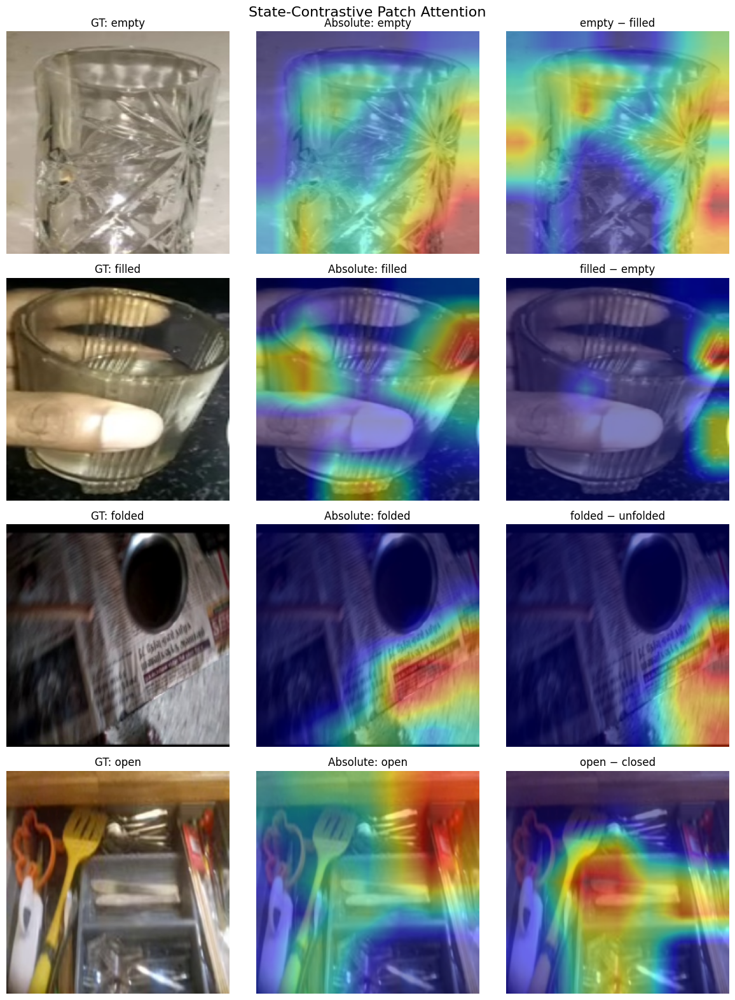

In [56]:
# ============================================================
# CELL 1 — Hook ResNet layer4 to get patch-level features
# ============================================================

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

# We will use the BEST graph model so far:
# adaptive_clip_vectors  -> shape [9, 2049]
#
# First 2048 dims = classifier weights
# Last dim         = bias

state_classifier_weights = adaptive_clip_vectors[:, :2048].to(DEVICE)   # [9, 2048]
state_classifier_biases  = adaptive_clip_vectors[:, 2048].to(DEVICE)    # [9]

PATCH_BETA = 0.30   # local/global fusion weight
PATCH_TAU  = 0.50   # softmax temperature for patch attention

print("state_classifier_weights:", state_classifier_weights.shape)
print("state_classifier_biases :", state_classifier_biases.shape)
print("PATCH_BETA =", PATCH_BETA)
print("PATCH_TAU  =", PATCH_TAU)


# ------------------------------------------------------------
# Forward hook
# ------------------------------------------------------------

spatial_cache = {}

def layer4_hook(module, inp, out):
    spatial_cache["feat"] = out

backbone_for_hook = cnn.module if hasattr(cnn, "module") else cnn
hook_handle = backbone_for_hook.layer4.register_forward_hook(layer4_hook)

print("✓ Hook registered on layer4")


# ------------------------------------------------------------
# Sanity check on one batch
# ------------------------------------------------------------

cnn.eval()

images, labels = next(iter(test_loader))
images = images.to(DEVICE)

with torch.inference_mode():
    pooled_features = cnn(images)

spatial_features = spatial_cache["feat"]

print("\n===== SANITY CHECK =====")
print("pooled_features shape :", pooled_features.shape)   # expected [B, 2048]
print("spatial_features shape:", spatial_features.shape)  # expected [B, 2048, 7, 7] or similar

In [53]:
# ============================================================
# CELL 2 — Evaluate Adaptive KG + Graph-Conditioned Patch Attention
# ============================================================

from tqdm.auto import tqdm
import pandas as pd
import numpy as np

gcpa_scores_list = []
gcpa_targets_list = []

cnn.eval()

with torch.inference_mode():

    for images, folder_labels in tqdm(
        test_loader,
        desc="Adaptive KG + Patch Attention inference"
    ):

        images = images.to(DEVICE, non_blocking=True)

        # ----------------------------------------------------
        # 1. Global pooled feature (existing OaSC pathway)
        # ----------------------------------------------------
        pooled_features = cnn(images)                     # [B, 2048]

        spatial_features = spatial_cache["feat"]         # [B, 2048, H, W]

        # Global score
        pooled_features_aug = torch.cat(
            [
                pooled_features,
                torch.ones(
                    pooled_features.shape[0],
                    1,
                    device=DEVICE
                )
            ],
            dim=1
        )                                                # [B, 2049]

        global_scores = (
            pooled_features_aug
            @ adaptive_clip_vectors.to(DEVICE).T
        )                                                # [B, 9]


        # ----------------------------------------------------
        # 2. Patch-level state evidence map
        #    M_s(h,w) = w_s^T F_{h,w}
        # ----------------------------------------------------
        # spatial_features: [B, 2048, H, W]
        # weights:          [9, 2048]
        #
        # patch_logits:     [B, 9, H, W]

        patch_logits = torch.einsum(
            "bchw,sc->bshw",
            spatial_features,
            state_classifier_weights
        )

        # add state bias to local evidence map
        patch_logits = (
            patch_logits
            + state_classifier_biases.view(1, -1, 1, 1)
        )


        # ----------------------------------------------------
        # 3. State-conditioned patch attention
        #    A_s = softmax(M_s / tau)
        # ----------------------------------------------------
        B, S, H, W = patch_logits.shape

        patch_logits_flat = patch_logits.view(B, S, -1)  # [B, 9, H*W]

        attention = F.softmax(
            patch_logits_flat / PATCH_TAU,
            dim=-1
        )                                                # [B, 9, H*W]


        # ----------------------------------------------------
        # 4. Local state score
        #    L_s = sum A_s * M_s
        # ----------------------------------------------------
        local_scores = (
            attention * patch_logits_flat
        ).sum(dim=-1)                                    # [B, 9]


        # ----------------------------------------------------
        # 5. Fuse global + local evidence
        #    S_s = (1-beta) G_s + beta L_s
        # ----------------------------------------------------
        fused_scores = (
            (1.0 - PATCH_BETA) * global_scores
            + PATCH_BETA * local_scores
        )                                                # [B, 9]


        # ----------------------------------------------------
        # 6. Targets
        # ----------------------------------------------------
        batch_targets = torch.tensor(
            [
                folder_idx_to_global[int(x)]
                for x in folder_labels
            ],
            dtype=torch.long
        )

        gcpa_scores_list.append(
            fused_scores.cpu()
        )

        gcpa_targets_list.append(
            batch_targets
        )


gcpa_scores = torch.cat(
    gcpa_scores_list,
    dim=0
)

gcpa_targets = torch.cat(
    gcpa_targets_list,
    dim=0
)

print("\nScores shape :", gcpa_scores.shape)
print("Targets shape:", gcpa_targets.shape)


# ------------------------------------------------------------
# Gamma sweep
# ------------------------------------------------------------

gcpa_rows = []

for gamma in gammas:

    total, seen, unseen, hm = evaluate_gamma(
        gcpa_scores,
        gcpa_targets,
        gamma
    )

    gcpa_rows.append({
        "gamma": gamma,
        "total_acc": total,
        "seen_acc": seen,
        "unseen_acc": unseen,
        "harmonic_mean": hm
    })

gcpa_results = pd.DataFrame(gcpa_rows)

gcpa_best = gcpa_results.loc[
    gcpa_results["harmonic_mean"].idxmax()
]

try:
    gcpa_auc = np.trapezoid(
        gcpa_results["seen_acc"].to_numpy(),
        gcpa_results["unseen_acc"].to_numpy()
    )
except AttributeError:
    gcpa_auc = np.trapz(
        gcpa_results["seen_acc"].to_numpy(),
        gcpa_results["unseen_acc"].to_numpy()
    )

print("\n==============================================")
print(" ADAPTIVE KG + GRAPH-CONDITIONED PATCH ATTENTION")
print("==============================================")
print(f"Best gamma       : {gcpa_best['gamma']:.2f}")
print(f"Seen @ best HM   : {100 * gcpa_best['seen_acc']:.2f}%")
print(f"Unseen @ best HM : {100 * gcpa_best['unseen_acc']:.2f}%")
print(f"Best HM          : {100 * gcpa_best['harmonic_mean']:.2f}%")
print(f"Max seen acc     : {100 * gcpa_results['seen_acc'].max():.2f}%")
print(f"Max unseen acc   : {100 * gcpa_results['unseen_acc'].max():.2f}%")
print(f"AUC              : {100 * gcpa_auc:.2f}")

Adaptive KG + Patch Attention inference:   0%|          | 0/25 [00:00<?, ?it/s]


Scores shape : torch.Size([3109, 9])
Targets shape: torch.Size([3109])

 ADAPTIVE KG + GRAPH-CONDITIONED PATCH ATTENTION
Best gamma       : 3.00
Seen @ best HM   : 44.26%
Unseen @ best HM : 56.93%
Best HM          : 49.80%
Max seen acc     : 84.31%
Max unseen acc   : 64.90%
AUC              : 40.03


In [54]:
# ============================================================
# CELL 3 — 4-way comparison
# ============================================================

comparison_4way = pd.DataFrame([
    {
        "Method": "Original OaSC",
        "Max Seen (%)": 84.46,
        "Max Unseen (%)": 64.82,
        "Best HM (%)": 50.07,
        "AUC": 40.16
    },
    {
        "Method": "Fixed CLIP fusion",
        "Max Seen (%)": 84.67,
        "Max Unseen (%)": 66.16,
        "Best HM (%)": 50.24,
        "AUC": 40.76
    },
    {
        "Method": "Adaptive CLIP fusion",
        "Max Seen (%)": 84.57,
        "Max Unseen (%)": 65.74,
        "Best HM (%)": 50.56,
        "AUC": 40.63
    },
    {
        "Method": "Adaptive CLIP + Patch Attention",
        "Max Seen (%)": 100 * gcpa_results["seen_acc"].max(),
        "Max Unseen (%)": 100 * gcpa_results["unseen_acc"].max(),
        "Best HM (%)": 100 * gcpa_best["harmonic_mean"],
        "AUC": 100 * gcpa_auc
    }
])

display(comparison_4way.round(2))

,Method,Max Seen (%),Max Unseen (%),Best HM (%),AUC
0,Original OaSC,84.46,64.82,50.07,40.16
1,Fixed CLIP fusion,84.67,66.16,50.24,40.76
2,Adaptive CLIP fusion,84.57,65.74,50.56,40.63
3,Adaptive CLIP + Patch Attention,84.31,64.90,49.80,40.03


Chosen example indices:
empty -> 856
filled -> 1503
folded -> 1699
open -> 1840


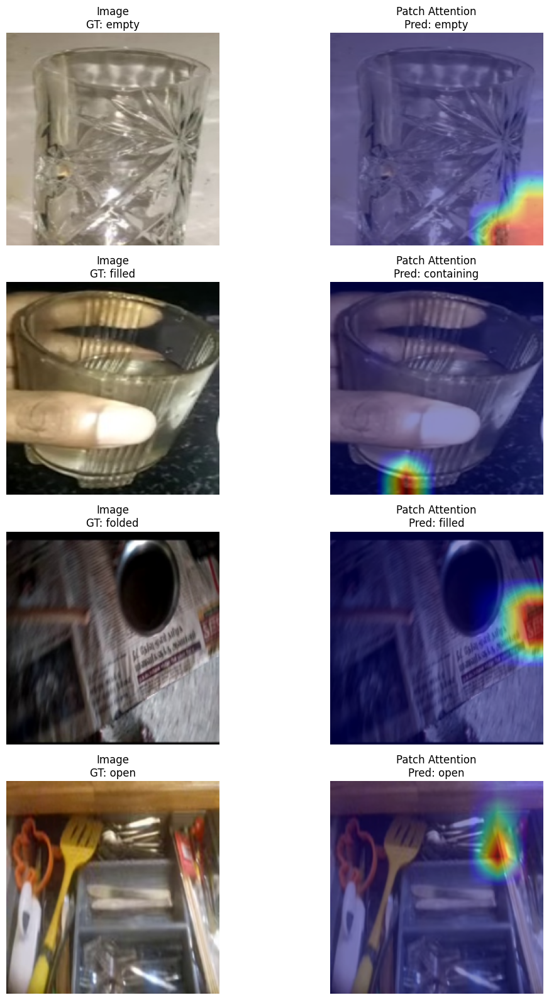

In [55]:
# ============================================================
# CELL 4 — Visualize state-conditioned patch attention maps
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F

# ------------------------------------------------------------
# Unnormalize for display (ImageNet normalization)
# ------------------------------------------------------------

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
IMAGENET_STD  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

def unnormalize_image(x):
    x = x.detach().cpu()
    x = x * IMAGENET_STD + IMAGENET_MEAN
    x = torch.clamp(x, 0, 1)
    return x


# ------------------------------------------------------------
# Pick one example for each interesting unseen state
# ------------------------------------------------------------

wanted_states = ["empty", "filled", "folded", "open"]
wanted_global_ids = [CLASS_TO_GLOBAL[s] for s in wanted_states]

example_indices = {}

for idx in range(len(test_ds)):
    _, folder_label = test_ds.samples[idx]
    global_id = folder_idx_to_global[folder_label]

    if global_id in wanted_global_ids and global_id not in example_indices:
        example_indices[global_id] = idx

    if len(example_indices) == len(wanted_global_ids):
        break

print("Chosen example indices:")
for gid, idx in example_indices.items():
    print(OSDD_CLASSES[gid], "->", idx)


# ------------------------------------------------------------
# Run model and show attention map
# ------------------------------------------------------------

def get_gcpa_outputs(image_tensor):
    """
    Returns:
      pooled_features
      spatial_features
      global_scores
      local_scores
      fused_scores
      attention_maps  [9, H, W]
    """

    image_tensor = image_tensor.unsqueeze(0).to(DEVICE)

    with torch.inference_mode():
        pooled_features = cnn(image_tensor)
        spatial_features = spatial_cache["feat"]   # [1,2048,H,W]

        pooled_features_aug = torch.cat(
            [
                pooled_features,
                torch.ones(1, 1, device=DEVICE)
            ],
            dim=1
        )

        global_scores = (
            pooled_features_aug
            @ adaptive_clip_vectors.to(DEVICE).T
        )                                           # [1, 9]

        patch_logits = torch.einsum(
            "bchw,sc->bshw",
            spatial_features,
            state_classifier_weights
        ) + state_classifier_biases.view(1, -1, 1, 1)

        B, S, H, W = patch_logits.shape

        patch_logits_flat = patch_logits.view(B, S, -1)

        attention = F.softmax(
            patch_logits_flat / PATCH_TAU,
            dim=-1
        ).view(B, S, H, W)

        local_scores = (
            attention.view(B, S, -1)
            * patch_logits_flat
        ).sum(dim=-1)

        fused_scores = (
            (1.0 - PATCH_BETA) * global_scores
            + PATCH_BETA * local_scores
        )

    return (
        pooled_features.cpu(),
        spatial_features.cpu(),
        global_scores.cpu(),
        local_scores.cpu(),
        fused_scores.cpu(),
        attention.cpu()[0]   # [9,H,W]
    )


def calibrate_and_predict(scores_1x9, gamma):
    scores = scores_1x9.clone()
    scores[:, UNSEEN_IDS] += float(gamma)
    pred = scores.argmax(dim=1).item()
    return pred, scores


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

num_examples = len(example_indices)
plt.figure(figsize=(12, 4 * num_examples))

row = 1

for global_id in wanted_global_ids:

    idx = example_indices[global_id]
    image_tensor, folder_label = test_ds[idx]

    gt_global = folder_idx_to_global[folder_label]
    gt_name = OSDD_CLASSES[gt_global]

    _, _, global_scores, local_scores, fused_scores, attention_maps = get_gcpa_outputs(image_tensor)

    pred_global, calibrated_scores = calibrate_and_predict(
        fused_scores,
        float(gcpa_best["gamma"])
    )

    pred_name = OSDD_CLASSES[pred_global]

    # show heatmap for the predicted state
    heatmap = attention_maps[pred_global]  # [H,W]
    heatmap = heatmap.unsqueeze(0).unsqueeze(0)  # [1,1,H,W]

    img_for_display = unnormalize_image(image_tensor)
    H_img, W_img = img_for_display.shape[1], img_for_display.shape[2]

    heatmap_up = F.interpolate(
        heatmap,
        size=(H_img, W_img),
        mode="bilinear",
        align_corners=False
    )[0, 0].numpy()

    img_np = img_for_display.permute(1, 2, 0).numpy()

    # --------------------------------------------------------
    # Original image
    # --------------------------------------------------------
    plt.subplot(num_examples, 2, row)
    plt.imshow(img_np)
    plt.axis("off")
    plt.title(f"Image\nGT: {gt_name}")

    # --------------------------------------------------------
    # Overlay
    # --------------------------------------------------------
    plt.subplot(num_examples, 2, row + 1)
    plt.imshow(img_np)
    plt.imshow(heatmap_up, cmap="jet", alpha=0.45)
    plt.axis("off")
    plt.title(
        f"Patch Attention\nPred: {pred_name}"
    )

    row += 2

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# STATE-CONTRASTIVE PATCH ATTENTION (SCPA)
#
# Compare:
#   Absolute state CAM
#          vs
#   Target state - opposite state CAM
#
# Uses Adaptive-CLIP KG classifiers.
# ============================================================

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np


# ------------------------------------------------------------
# Opposite-state pairs
# ------------------------------------------------------------

OPPOSITE_STATE = {
    "open": "closed",
    "closed": "open",

    "empty": "filled",
    "filled": "empty",

    "folded": "unfolded",
    "unfolded": "folded",

    "plugged": "unplugged",
    "unplugged": "plugged",
}


state_to_id = {
    state: i
    for i, state in enumerate(OSDD_CLASSES)
}


# ------------------------------------------------------------
# ImageNet unnormalization
# ------------------------------------------------------------

IMAGENET_MEAN = torch.tensor(
    [0.485, 0.456, 0.406]
).view(3, 1, 1)

IMAGENET_STD = torch.tensor(
    [0.229, 0.224, 0.225]
).view(3, 1, 1)


def unnormalize_image(x):

    x = x.detach().cpu()

    x = (
        x * IMAGENET_STD
        + IMAGENET_MEAN
    )

    return torch.clamp(
        x,
        0,
        1
    )


# ------------------------------------------------------------
# Generate patch logits
# ------------------------------------------------------------

def get_patch_logits(image_tensor):

    x = (
        image_tensor
        .unsqueeze(0)
        .to(DEVICE)
    )

    with torch.inference_mode():

        # Forward pass populates spatial_cache
        _ = cnn(x)

        spatial = spatial_cache["feat"]

        # [1, 9, H, W]
        patch_logits = torch.einsum(
            "bchw,sc->bshw",
            spatial,
            state_classifier_weights
        )

        patch_logits = (
            patch_logits
            + state_classifier_biases
              .view(1, -1, 1, 1)
        )

    return patch_logits[0].cpu()


# ------------------------------------------------------------
# Normalize map ONLY for visualization
# ------------------------------------------------------------

def normalize_heatmap(x):

    x = x.clone()

    # We only visualize positive evidence
    x = torch.relu(x)

    if x.max() > x.min():

        x = (
            x - x.min()
        ) / (
            x.max() - x.min()
            + 1e-8
        )

    return x


# ------------------------------------------------------------
# Find one test example for each state
# ------------------------------------------------------------

TARGET_STATES = [
    "empty",
    "filled",
    "folded",
    "open"
]


example_indices = {}


for idx in range(len(test_ds)):

    _, folder_label = test_ds[idx]

    global_id = folder_idx_to_global[
        folder_label
    ]

    state = OSDD_CLASSES[
        global_id
    ]

    if (
        state in TARGET_STATES
        and state not in example_indices
    ):

        example_indices[state] = idx

    if len(example_indices) == len(TARGET_STATES):
        break


# ------------------------------------------------------------
# Plot:
#
# Original | Absolute CAM | Contrastive CAM
# ------------------------------------------------------------

fig, axes = plt.subplots(
    len(TARGET_STATES),
    3,
    figsize=(12, 4 * len(TARGET_STATES))
)


for row, state in enumerate(TARGET_STATES):

    idx = example_indices[state]

    image_tensor, folder_label = test_ds[idx]

    opposite = OPPOSITE_STATE[state]

    state_id = state_to_id[state]
    opposite_id = state_to_id[opposite]


    # ----------------------------------------
    # Patch evidence
    # ----------------------------------------

    patch_logits = get_patch_logits(
        image_tensor
    )

    absolute_map = patch_logits[
        state_id
    ]


    # ========================================================
    # THE NEW IDEA
    # ========================================================

    contrastive_map = (
        patch_logits[state_id]
        -
        patch_logits[opposite_id]
    )


    absolute_map = normalize_heatmap(
        absolute_map
    )

    contrastive_map = normalize_heatmap(
        contrastive_map
    )


    # ----------------------------------------
    # Resize heatmaps
    # ----------------------------------------

    img = unnormalize_image(
        image_tensor
    )

    H_img = img.shape[1]
    W_img = img.shape[2]


    absolute_up = F.interpolate(
        absolute_map[
            None,
            None
        ],
        size=(H_img, W_img),
        mode="bilinear",
        align_corners=False
    )[0, 0].numpy()


    contrastive_up = F.interpolate(
        contrastive_map[
            None,
            None
        ],
        size=(H_img, W_img),
        mode="bilinear",
        align_corners=False
    )[0, 0].numpy()


    img_np = (
        img
        .permute(1, 2, 0)
        .numpy()
    )


    # ----------------------------------------
    # Original
    # ----------------------------------------

    axes[row, 0].imshow(
        img_np
    )

    axes[row, 0].set_title(
        f"GT: {state}"
    )

    axes[row, 0].axis("off")


    # ----------------------------------------
    # Absolute attention
    # ----------------------------------------

    axes[row, 1].imshow(
        img_np
    )

    axes[row, 1].imshow(
        absolute_up,
        cmap="jet",
        alpha=0.45
    )

    axes[row, 1].set_title(
        f"Absolute: {state}"
    )

    axes[row, 1].axis("off")


    # ----------------------------------------
    # Contrastive attention
    # ----------------------------------------

    axes[row, 2].imshow(
        img_np
    )

    axes[row, 2].imshow(
        contrastive_up,
        cmap="jet",
        alpha=0.50
    )

    axes[row, 2].set_title(
        f"{state} − {opposite}"
    )

    axes[row, 2].axis("off")


plt.suptitle(
    "State-Contrastive Patch Attention",
    fontsize=16
)

plt.tight_layout()

plt.show()

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


✓ Loaded openai/clip-vit-base-patch32
closed       (512,)
containing   (512,)
empty        (512,)
filled       (512,)
folded       (512,)
open         (512,)
plugged      (512,)
unfolded     (512,)
unplugged    (512,)

✓ CLIP state text embeddings ready


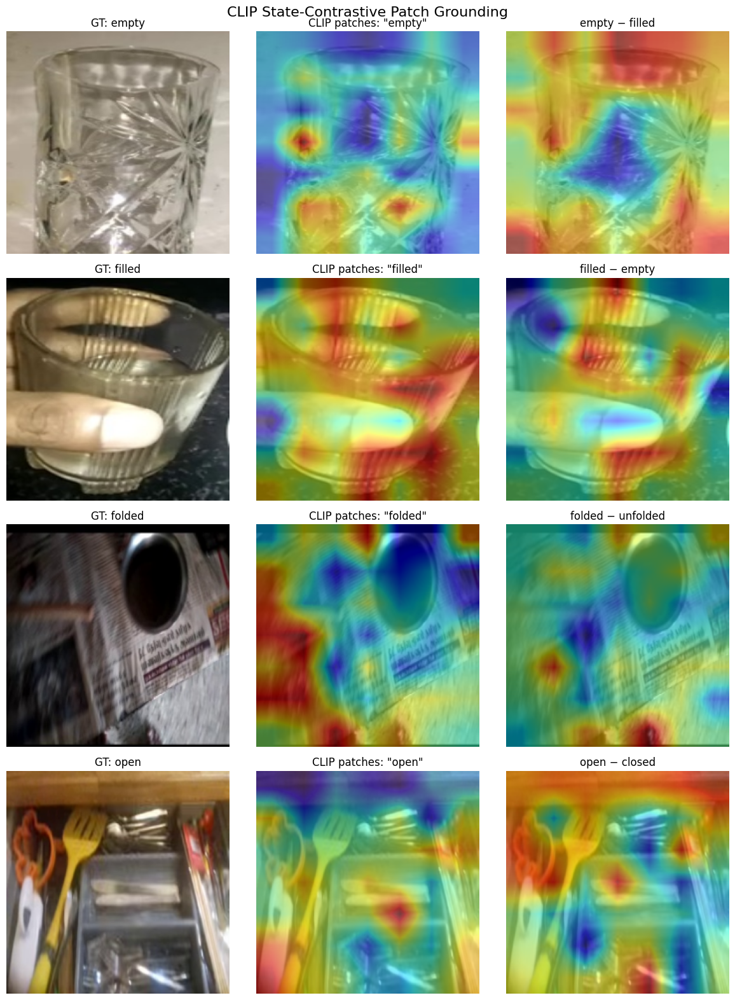

In [62]:
# ============================================================
# CLIP STATE-CONTRASTIVE PATCH GROUNDING
#
# Image | Target-state CLIP patches | Target - Opposite patches
# ============================================================

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

from transformers import CLIPModel, CLIPProcessor


# ------------------------------------------------------------
# Load CLIP
# ------------------------------------------------------------

CLIP_NAME = "openai/clip-vit-base-patch32"

clip_patch_model = CLIPModel.from_pretrained(
    CLIP_NAME
).to(DEVICE)

clip_patch_processor = CLIPProcessor.from_pretrained(
    CLIP_NAME
)

clip_patch_model.eval()

print("✓ Loaded", CLIP_NAME)


# ------------------------------------------------------------
# State opposites
# ------------------------------------------------------------

OPPOSITE_STATE = {
    "open": "closed",
    "closed": "open",

    "empty": "filled",
    "filled": "empty",

    "folded": "unfolded",
    "unfolded": "folded",

    "plugged": "unplugged",
    "unplugged": "plugged",
}


# ------------------------------------------------------------
# Use several prompts, then average their CLIP embeddings.
# This makes the text representation less dependent
# on one exact sentence.
# ------------------------------------------------------------

def get_state_text_feature(state):

    prompts = [
        f"a photo of an object that is {state}",
        f"an object in the {state} state",
        f"a {state} object"
    ]

    inputs = clip_patch_processor(
        text=prompts,
        return_tensors="pt",
        padding=True
    )

    input_ids = inputs["input_ids"].to(DEVICE)
    attention_mask = inputs["attention_mask"].to(DEVICE)

    with torch.inference_mode():

        # Explicitly run CLIP text encoder
        text_output = clip_patch_model.text_model(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        # [num_prompts, hidden_dim]
        pooled_text = text_output.pooler_output

        # Project into CLIP's shared vision-language space
        # [num_prompts, projection_dim]
        text_features = clip_patch_model.text_projection(
            pooled_text
        )

        # Normalize each prompt embedding
        text_features = F.normalize(
            text_features,
            dim=-1
        )

        # Prompt ensemble
        text_feature = text_features.mean(
            dim=0
        )

        # Normalize averaged representation
        text_feature = F.normalize(
            text_feature,
            dim=0
        )

    return text_feature


# ------------------------------------------------------------
# Recompute all state embeddings
# ------------------------------------------------------------

clip_state_text = {}

for state in OSDD_CLASSES:

    clip_state_text[state] = (
        get_state_text_feature(state)
    )

    print(
        f"{state:12s}",
        tuple(clip_state_text[state].shape)
    )

print("\n✓ CLIP state text embeddings ready")


# ------------------------------------------------------------
# Get CLIP patch-token similarities
# ------------------------------------------------------------

def get_clip_patch_maps(
    image_tensor,
    target_state
):

    opposite_state = OPPOSITE_STATE[
        target_state
    ]

    pil_img = tensor_to_pil(
        image_tensor
    )

    image_inputs = clip_patch_processor(
        images=pil_img,
        return_tensors="pt"
    )

    pixel_values = (
        image_inputs["pixel_values"]
        .to(DEVICE)
    )

    with torch.inference_mode():

        # CLIP ViT output:
        # [B, 1 + num_patches, hidden_dim]
        vision_output = (
            clip_patch_model
            .vision_model(
                pixel_values=pixel_values
            )
        )

        tokens = (
            vision_output
            .last_hidden_state
        )

        # remove CLS token
        patch_tokens = tokens[:, 1:, :]
        
        # Apply CLIP vision post-layer normalization
        # before projecting patches into shared CLIP space
        patch_tokens = (
            clip_patch_model
            .vision_model
            .post_layernorm(
                patch_tokens
            )
        )
        
        patch_features = (
            clip_patch_model
            .visual_projection(
                patch_tokens
            )
        )
        
        patch_features = F.normalize(
            patch_features,
            dim=-1
        )


        target_text = (
            clip_state_text[
                target_state
            ]
        )

        opposite_text = (
            clip_state_text[
                opposite_state
            ]
        )


        # ------------------------------------
        # Patch ↔ text similarities
        # ------------------------------------

        target_similarity = torch.einsum(
            "bpd,d->bp",
            patch_features,
            target_text
        )

        opposite_similarity = torch.einsum(
            "bpd,d->bp",
            patch_features,
            opposite_text
        )


        # Contrastive state evidence
        contrast_similarity = (
            target_similarity
            - opposite_similarity
        )


    # ViT-B/32 on 224x224 -> 7x7 patches
    num_patches = (
        target_similarity.shape[-1]
    )

    side = int(
        num_patches ** 0.5
    )

    assert (
        side * side
        == num_patches
    )


    target_map = (
        target_similarity[0]
        .reshape(side, side)
        .cpu()
    )

    contrast_map = (
        contrast_similarity[0]
        .reshape(side, side)
        .cpu()
    )


    return (
        target_map,
        contrast_map,
        opposite_state
    )


# ------------------------------------------------------------
# Visualization normalization
# ------------------------------------------------------------

def vis_normalize(x):

    x = x.clone()

    x = (
        x - x.min()
    ) / (
        x.max()
        - x.min()
        + 1e-8
    )

    return x


# ------------------------------------------------------------
# Use the SAME examples from previous figure
# ------------------------------------------------------------

TARGET_STATES = [
    "empty",
    "filled",
    "folded",
    "open"
]


fig, axes = plt.subplots(
    len(TARGET_STATES),
    3,
    figsize=(12, 4 * len(TARGET_STATES))
)


for row, state in enumerate(
    TARGET_STATES
):

    idx = example_indices[state]

    image_tensor, _ = (
        test_ds[idx]
    )

    img = unnormalize_image(
        image_tensor
    )

    img_np = (
        img
        .permute(1, 2, 0)
        .numpy()
    )

    H_img = img.shape[1]
    W_img = img.shape[2]


    target_map, contrast_map, opposite = (
        get_clip_patch_maps(
            image_tensor,
            state
        )
    )


    # ----------------------------------------
    # Normalize for visualization
    # ----------------------------------------

    target_vis = vis_normalize(
        target_map
    )

    contrast_vis = vis_normalize(
        contrast_map
    )


    # ----------------------------------------
    # Upsample 7x7 -> image resolution
    # ----------------------------------------

    target_up = F.interpolate(
        target_vis[
            None,
            None
        ],
        size=(
            H_img,
            W_img
        ),
        mode="bilinear",
        align_corners=False
    )[0, 0]


    contrast_up = F.interpolate(
        contrast_vis[
            None,
            None
        ],
        size=(
            H_img,
            W_img
        ),
        mode="bilinear",
        align_corners=False
    )[0, 0]


    # ----------------------------------------
    # Original
    # ----------------------------------------

    axes[row, 0].imshow(
        img_np
    )

    axes[row, 0].set_title(
        f"GT: {state}"
    )

    axes[row, 0].axis(
        "off"
    )


    # ----------------------------------------
    # Absolute CLIP state similarity
    # ----------------------------------------

    axes[row, 1].imshow(
        img_np
    )

    axes[row, 1].imshow(
        target_up.numpy(),
        cmap="jet",
        alpha=0.50
    )

    axes[row, 1].set_title(
        f'CLIP patches: "{state}"'
    )

    axes[row, 1].axis(
        "off"
    )


    # ----------------------------------------
    # Contrastive state map
    # ----------------------------------------

    axes[row, 2].imshow(
        img_np
    )

    axes[row, 2].imshow(
        contrast_up.numpy(),
        cmap="jet",
        alpha=0.50
    )

    axes[row, 2].set_title(
        f"{state} − {opposite}"
    )

    axes[row, 2].axis(
        "off"
    )


plt.suptitle(
    "CLIP State-Contrastive Patch Grounding",
    fontsize=16
)

plt.tight_layout()

plt.show()

In [64]:
# ============================================================
# HIGHER-RESOLUTION CLIP PATCH MODEL
# ViT-B/16 -> 14 x 14 patch grid
# ============================================================

from transformers import CLIPModel, CLIPProcessor
import torch
import torch.nn.functional as F

CLIP_PATCH_NAME = "openai/clip-vit-base-patch16"

clip_patch_model = CLIPModel.from_pretrained(
    CLIP_PATCH_NAME
).to(DEVICE)

clip_patch_processor = CLIPProcessor.from_pretrained(
    CLIP_PATCH_NAME
)

clip_patch_model.eval()

print("✓ Loaded:", CLIP_PATCH_NAME)

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

✓ Loaded: openai/clip-vit-base-patch16


In [65]:
# ============================================================
# TEXT FEATURES FOR B/16
# ============================================================

def get_state_text_feature(state):

    prompts = [
        f"a photo of an object that is {state}",
        f"an object in the {state} state",
        f"a {state} object"
    ]

    inputs = clip_patch_processor(
        text=prompts,
        return_tensors="pt",
        padding=True
    )

    input_ids = inputs["input_ids"].to(DEVICE)
    attention_mask = inputs["attention_mask"].to(DEVICE)

    with torch.inference_mode():

        output = clip_patch_model.text_model(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        text_features = (
            clip_patch_model.text_projection(
                output.pooler_output
            )
        )

        text_features = F.normalize(
            text_features,
            dim=-1
        )

        text_feature = F.normalize(
            text_features.mean(dim=0),
            dim=0
        )

    return text_feature


clip_state_text = {
    state: get_state_text_feature(state)
    for state in OSDD_CLASSES
}

print("✓ B/16 state text features ready")

✓ B/16 state text features ready


In [67]:
# ============================================================
# 14x14 CLIP STATE-CONTRASTIVE PATCH SCORES
# ============================================================

OPPOSITE_STATE = {
    "open": "closed",
    "closed": "open",

    "empty": "filled",
    "filled": "empty",

    "folded": "unfolded",
    "unfolded": "folded",

    "plugged": "unplugged",
    "unplugged": "plugged",
}


def get_highres_patch_scores(
    image_tensor,
    target_state
):

    pil_img = tensor_to_pil(
        image_tensor
    )

    inputs = clip_patch_processor(
        images=pil_img,
        return_tensors="pt"
    )

    pixel_values = (
        inputs["pixel_values"]
        .to(DEVICE)
    )


    with torch.inference_mode():

        output = (
            clip_patch_model
            .vision_model(
                pixel_values=pixel_values
            )
        )

        # remove CLS
        patch_tokens = (
            output
            .last_hidden_state[:, 1:, :]
        )

        # CLIP post-LN
        patch_tokens = (
            clip_patch_model
            .vision_model
            .post_layernorm(
                patch_tokens
            )
        )

        # project into CLIP joint space
        patch_features = (
            clip_patch_model
            .visual_projection(
                patch_tokens
            )
        )

        patch_features = F.normalize(
            patch_features,
            dim=-1
        )


        target_text = (
            clip_state_text[
                target_state
            ]
        )


        # ----------------------------------------------------
        # Known opposite state
        # ----------------------------------------------------

        if target_state in OPPOSITE_STATE:

            opposite_state = (
                OPPOSITE_STATE[
                    target_state
                ]
            )

            opposite_text = (
                clip_state_text[
                    opposite_state
                ]
            )

            target_sim = torch.einsum(
                "bpd,d->bp",
                patch_features,
                target_text
            )

            opposite_sim = torch.einsum(
                "bpd,d->bp",
                patch_features,
                opposite_text
            )

            contrast = (
                target_sim
                - opposite_sim
            )


        # ----------------------------------------------------
        # 'containing' has no clean opposite.
        # Use one-vs-rest contrast.
        # ----------------------------------------------------

        else:

            target_sim = torch.einsum(
                "bpd,d->bp",
                patch_features,
                target_text
            )

            other_states = [
                s for s in OSDD_CLASSES
                if s != target_state
            ]

            other_features = torch.stack([
                clip_state_text[s]
                for s in other_states
            ])

            other_sim = torch.einsum(
                "bpd,sd->bps",
                patch_features,
                other_features
            ).mean(dim=-1)

            contrast = (
                target_sim
                - other_sim
            )

            opposite_state = "other states"


    n_patches = contrast.shape[1]

    side = int(
        n_patches ** 0.5
    )

    assert side * side == n_patches

    return (
        contrast[0].reshape(
            side,
            side
        ).cpu(),
        opposite_state
    )

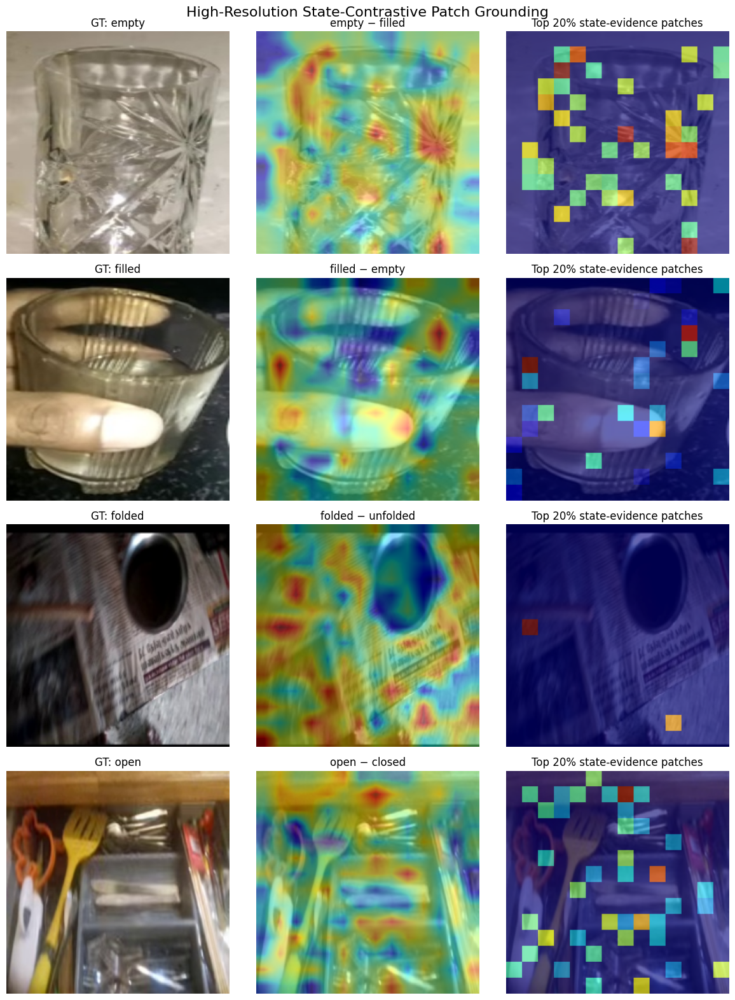

In [68]:
# ============================================================
# TOP-K STATE-CONTRASTIVE PATCH VISUALIZATION
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F


TOP_PATCH_FRACTION = 0.20


def topk_patch_mask(
    contrast_map,
    fraction=0.20
):

    flat = contrast_map.flatten()

    k = max(
        1,
        int(
            len(flat)
            * fraction
        )
    )

    values, indices = torch.topk(
        flat,
        k=k
    )

    mask = torch.zeros_like(
        flat
    )

    # Weight selected patches according to
    # their positive contrastive evidence.
    positive_values = torch.relu(
        values
    )

    if positive_values.max() > 0:

        positive_values = (
            positive_values
            / (
                positive_values.max()
                + 1e-8
            )
        )

    mask[indices] = (
        positive_values
    )

    return mask.reshape_as(
        contrast_map
    )


TARGET_STATES = [
    "empty",
    "filled",
    "folded",
    "open"
]


fig, axes = plt.subplots(
    len(TARGET_STATES),
    3,
    figsize=(12, 4 * len(TARGET_STATES))
)


for row, state in enumerate(
    TARGET_STATES
):

    idx = example_indices[state]

    image_tensor, _ = (
        test_ds[idx]
    )

    img = unnormalize_image(
        image_tensor
    )

    img_np = (
        img.permute(
            1, 2, 0
        ).numpy()
    )

    H_img = img.shape[1]
    W_img = img.shape[2]


    contrast_map, opposite = (
        get_highres_patch_scores(
            image_tensor,
            state
        )
    )


    # ----------------------------------------
    # Full contrastive map
    # ----------------------------------------

    full_map = contrast_map.clone()

    full_map = (
        full_map - full_map.min()
    ) / (
        full_map.max()
        - full_map.min()
        + 1e-8
    )


    # ----------------------------------------
    # Top-k discriminative patches
    # ----------------------------------------

    topk_map = topk_patch_mask(
        contrast_map,
        TOP_PATCH_FRACTION
    )


    # ----------------------------------------
    # Upsample
    # ----------------------------------------

    full_up = F.interpolate(
        full_map[
            None,
            None
        ],
        size=(H_img, W_img),
        mode="bilinear",
        align_corners=False
    )[0, 0]


    # nearest preserves patch boundaries
    topk_up = F.interpolate(
        topk_map[
            None,
            None
        ],
        size=(H_img, W_img),
        mode="nearest"
    )[0, 0]


    # ----------------------------------------
    # Image
    # ----------------------------------------

    axes[row, 0].imshow(
        img_np
    )

    axes[row, 0].set_title(
        f"GT: {state}"
    )

    axes[row, 0].axis(
        "off"
    )


    # ----------------------------------------
    # Full contrastive evidence
    # ----------------------------------------

    axes[row, 1].imshow(
        img_np
    )

    axes[row, 1].imshow(
        full_up.numpy(),
        cmap="jet",
        alpha=0.45
    )

    axes[row, 1].set_title(
        f"{state} − {opposite}"
    )

    axes[row, 1].axis(
        "off"
    )


    # ----------------------------------------
    # TOP-K evidence
    # ----------------------------------------

    axes[row, 2].imshow(
        img_np
    )

    axes[row, 2].imshow(
        topk_up.numpy(),
        cmap="jet",
        alpha=0.60,
        vmin=0,
        vmax=1
    )

    axes[row, 2].set_title(
        f"Top {int(TOP_PATCH_FRACTION*100)}% "
        f"state-evidence patches"
    )

    axes[row, 2].axis(
        "off"
    )


plt.suptitle(
    "High-Resolution State-Contrastive Patch Grounding",
    fontsize=16
)

plt.tight_layout()

plt.show()

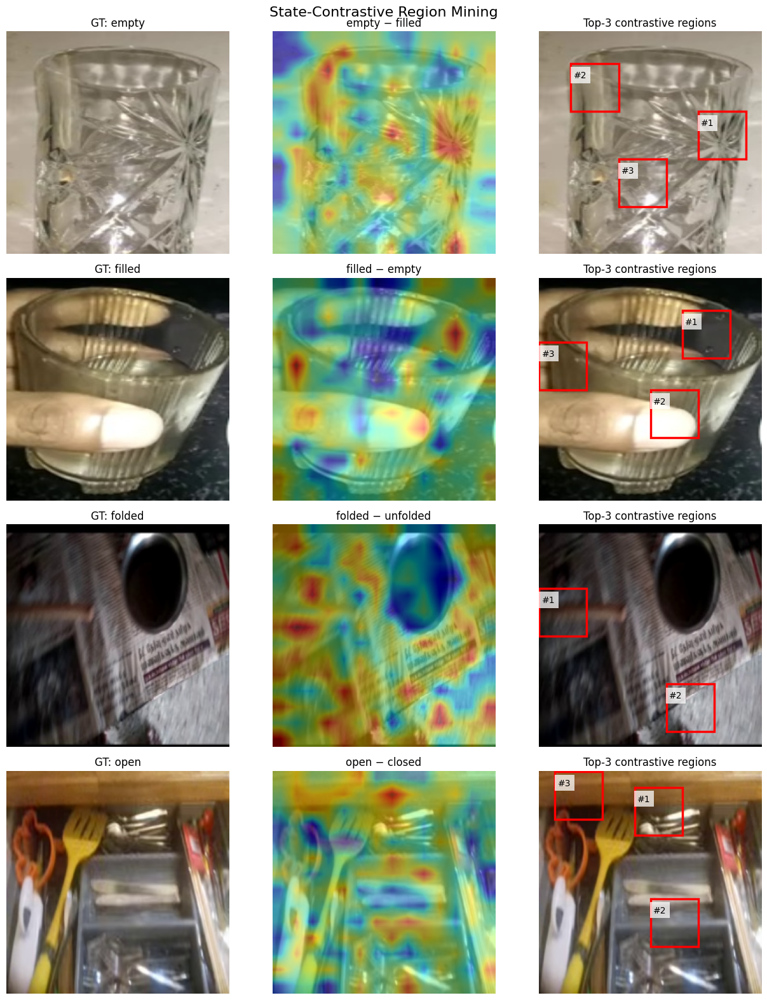

In [69]:
# ============================================================
# STATE-CONTRASTIVE REGION MINING (SCRM)
#
# 14x14 CLIP contrastive patches
#        ↓
# 3x3 regional evidence aggregation
#        ↓
# top non-overlapping state-discriminative regions
# ============================================================

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np


# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

REGION_SIZE = 3          # 3x3 CLIP patches
NUM_REGIONS = 3          # show strongest 3 regions
SUPPRESSION_RADIUS = 2   # prevents neighboring duplicate boxes


# ------------------------------------------------------------
# Mine strongest contiguous regions
# ------------------------------------------------------------

def mine_state_regions(
    contrast_map,
    region_size=3,
    num_regions=3,
    suppression_radius=2
):
    """
    contrast_map: [H, W], e.g. 14x14

    Returns:
        region_score_map
        selected_regions:
            [(row, col, score), ...]
    """

    x = contrast_map.clone().float()

    # only positive evidence for target vs opposite
    x_positive = torch.relu(x)

    # [1,1,H,W]
    x4 = x_positive[
        None,
        None
    ]

    # --------------------------------------------------------
    # Average contrastive evidence over local region
    # --------------------------------------------------------

    region_scores = F.avg_pool2d(
        x4,
        kernel_size=region_size,
        stride=1
    )[0, 0]

    working = region_scores.clone()

    selected = []


    # --------------------------------------------------------
    # Greedy non-max suppression
    # --------------------------------------------------------

    for _ in range(num_regions):

        flat_idx = torch.argmax(
            working
        )

        best_score = working.flatten()[
            flat_idx
        ].item()

        if best_score <= 0:
            break

        h, w = working.shape

        row = int(
            flat_idx // w
        )

        col = int(
            flat_idx % w
        )

        selected.append(
            (
                row,
                col,
                best_score
            )
        )


        # suppress nearby candidate regions
        r0 = max(
            0,
            row - suppression_radius
        )

        r1 = min(
            h,
            row + suppression_radius + 1
        )

        c0 = max(
            0,
            col - suppression_radius
        )

        c1 = min(
            w,
            col + suppression_radius + 1
        )

        working[
            r0:r1,
            c0:c1
        ] = -float("inf")


    return (
        region_scores,
        selected
    )


# ------------------------------------------------------------
# Visualization
# ------------------------------------------------------------

TARGET_STATES = [
    "empty",
    "filled",
    "folded",
    "open"
]


fig, axes = plt.subplots(
    len(TARGET_STATES),
    3,
    figsize=(13, 4 * len(TARGET_STATES))
)


for row, state in enumerate(
    TARGET_STATES
):

    idx = example_indices[state]

    image_tensor, _ = test_ds[idx]

    img = unnormalize_image(
        image_tensor
    )

    img_np = (
        img
        .permute(1, 2, 0)
        .numpy()
    )

    H_img = img.shape[1]
    W_img = img.shape[2]


    # --------------------------------------------------------
    # CLIP contrastive patches
    # --------------------------------------------------------

    contrast_map, opposite = (
        get_highres_patch_scores(
            image_tensor,
            state
        )
    )

    patch_h, patch_w = (
        contrast_map.shape
    )


    # --------------------------------------------------------
    # Mine regions
    # --------------------------------------------------------

    region_score_map, selected_regions = (
        mine_state_regions(
            contrast_map,
            region_size=REGION_SIZE,
            num_regions=NUM_REGIONS,
            suppression_radius=SUPPRESSION_RADIUS
        )
    )


    # --------------------------------------------------------
    # Smooth full contrastive map
    # --------------------------------------------------------

    contrast_vis = (
        contrast_map
        - contrast_map.min()
    ) / (
        contrast_map.max()
        - contrast_map.min()
        + 1e-8
    )

    contrast_up = F.interpolate(
        contrast_vis[
            None,
            None
        ],
        size=(H_img, W_img),
        mode="bilinear",
        align_corners=False
    )[0, 0]


    # ========================================================
    # COLUMN 1 — original
    # ========================================================

    axes[row, 0].imshow(
        img_np
    )

    axes[row, 0].set_title(
        f"GT: {state}"
    )

    axes[row, 0].axis(
        "off"
    )


    # ========================================================
    # COLUMN 2 — contrastive heatmap
    # ========================================================

    axes[row, 1].imshow(
        img_np
    )

    axes[row, 1].imshow(
        contrast_up.numpy(),
        cmap="jet",
        alpha=0.45
    )

    axes[row, 1].set_title(
        f"{state} − {opposite}"
    )

    axes[row, 1].axis(
        "off"
    )


    # ========================================================
    # COLUMN 3 — mined contiguous regions
    # ========================================================

    axes[row, 2].imshow(
        img_np
    )

    # Image dimensions corresponding to one CLIP patch
    pixel_per_patch_x = (
        W_img / patch_w
    )

    pixel_per_patch_y = (
        H_img / patch_h
    )


    for rank, (
        r,
        c,
        score
    ) in enumerate(
        selected_regions,
        start=1
    ):

        x0 = (
            c
            * pixel_per_patch_x
        )

        y0 = (
            r
            * pixel_per_patch_y
        )

        box_w = (
            REGION_SIZE
            * pixel_per_patch_x
        )

        box_h = (
            REGION_SIZE
            * pixel_per_patch_y
        )


        rect = patches.Rectangle(
            (x0, y0),
            box_w,
            box_h,
            linewidth=2.5,
            edgecolor="red",
            facecolor="none"
        )

        axes[row, 2].add_patch(
            rect
        )


        axes[row, 2].text(
            x0 + 3,
            y0 + 14,
            f"#{rank}",
            fontsize=10,
            bbox=dict(
                facecolor="white",
                alpha=0.75,
                edgecolor="none"
            )
        )


    axes[row, 2].set_title(
        f"Top-{NUM_REGIONS} "
        f"contrastive regions"
    )

    axes[row, 2].axis(
        "off"
    )


plt.suptitle(
    "State-Contrastive Region Mining",
    fontsize=16
)

plt.tight_layout()

plt.show()

In [75]:
# ============================================================
# FIX: Reload CLIP ViT-B/16 with EAGER attention
# so output_attentions=True actually returns attention maps
# ============================================================

import gc
import torch
from transformers import CLIPModel, CLIPProcessor

# ------------------------------------------------------------
# Delete old model
# ------------------------------------------------------------

try:
    del clip_patch_model
except:
    pass

gc.collect()
torch.cuda.empty_cache()


# ------------------------------------------------------------
# Reload using eager attention
# ------------------------------------------------------------

CLIP_PATCH_NAME = "openai/clip-vit-base-patch16"

clip_patch_model = CLIPModel.from_pretrained(
    CLIP_PATCH_NAME,
    attn_implementation="eager"
).to(DEVICE)

clip_patch_processor = CLIPProcessor.from_pretrained(
    CLIP_PATCH_NAME
)

clip_patch_model.eval()


# Force attention outputs on the vision encoder
clip_patch_model.vision_model.config.output_attentions = True

print("✓ Reloaded CLIP with eager attention")
print(
    "Vision attention implementation:",
    getattr(
        clip_patch_model.vision_model.config,
        "_attn_implementation",
        "unknown"
    )
)

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


✓ Reloaded CLIP with eager attention
Vision attention implementation: eager


In [78]:
# ============================================================
# SANITY CHECK — confirm attention matrices are returned
# ============================================================

test_state = "open"
test_idx = example_indices[test_state]

test_image, _ = test_ds[test_idx]

pil_img = tensor_to_pil(test_image)

inputs = clip_patch_processor(
    images=pil_img,
    return_tensors="pt"
)

pixel_values = inputs["pixel_values"].to(DEVICE)

with torch.inference_mode():

    out = clip_patch_model.vision_model(
        pixel_values=pixel_values,
        output_attentions=True,
        return_dict=True
    )


print("Attentions returned:", out.attentions is not None)

if out.attentions is not None:

    print("Number of layers:", len(out.attentions))

    print(
        "One attention tensor:",
        out.attentions[0].shape
    )

Attentions returned: False


In [79]:
# ============================================================
# CLIP ATTENTION ROLLOUT
# Gives a 14x14 visual-relevance prior
# ============================================================

import torch
import torch.nn.functional as F


# ============================================================
# FALLBACK: CLIP GLOBAL-TO-PATCH VISUAL RELEVANCE
#
# No output_attentions needed.
# Works directly from CLIP ViT hidden states.
# ============================================================

def get_clip_attention_rollout(image_tensor):
    """
    Returns a [14,14] visual-relevance map.

    IMPORTANT:
    This is NOT transformer attention rollout anymore.

    It measures cosine similarity between:
        CLIP global CLS representation
        and
        each CLIP spatial patch representation.
    """

    pil_img = tensor_to_pil(
        image_tensor
    )

    inputs = clip_patch_processor(
        images=pil_img,
        return_tensors="pt"
    )

    pixel_values = (
        inputs["pixel_values"]
        .to(DEVICE)
    )

    with torch.inference_mode():

        outputs = (
            clip_patch_model
            .vision_model(
                pixel_values=pixel_values,
                return_dict=True
            )
        )

        hidden = (
            outputs.last_hidden_state
        )
        # [1, 197, hidden_dim]

        # ----------------------------------------
        # CLS/global token
        # ----------------------------------------

        cls_token = hidden[:, 0, :]
        # [1, hidden_dim]

        # ----------------------------------------
        # Spatial patches
        # ----------------------------------------

        patch_tokens = hidden[:, 1:, :]
        # [1,196,hidden_dim]


        # Apply CLIP's final vision LayerNorm
        cls_token = (
            clip_patch_model
            .vision_model
            .post_layernorm(
                cls_token
            )
        )

        patch_tokens = (
            clip_patch_model
            .vision_model
            .post_layernorm(
                patch_tokens
            )
        )


        # ----------------------------------------
        # Project into CLIP joint embedding space
        # ----------------------------------------

        cls_feature = (
            clip_patch_model
            .visual_projection(
                cls_token
            )
        )

        patch_features = (
            clip_patch_model
            .visual_projection(
                patch_tokens
            )
        )


        cls_feature = F.normalize(
            cls_feature,
            dim=-1
        )

        patch_features = F.normalize(
            patch_features,
            dim=-1
        )


        # ----------------------------------------
        # Global-to-patch cosine relevance
        # ----------------------------------------

        relevance = torch.einsum(
            "bpd,bd->bp",
            patch_features,
            cls_feature
        )

        relevance = relevance[0]


    # --------------------------------------------
    # Convert 196 patches -> 14 x 14
    # --------------------------------------------

    n_patches = relevance.numel()

    side = int(
        n_patches ** 0.5
    )

    assert side * side == n_patches


    relevance_map = (
        relevance
        .reshape(
            side,
            side
        )
        .float()
        .cpu()
    )


    # --------------------------------------------
    # Normalize to [0,1]
    # --------------------------------------------

    relevance_map = (
        relevance_map
        - relevance_map.min()
    ) / (
        relevance_map.max()
        - relevance_map.min()
        + 1e-8
    )


    return relevance_map


print(
    "✓ Global-to-patch CLIP relevance ready"
)

✓ Global-to-patch CLIP relevance ready


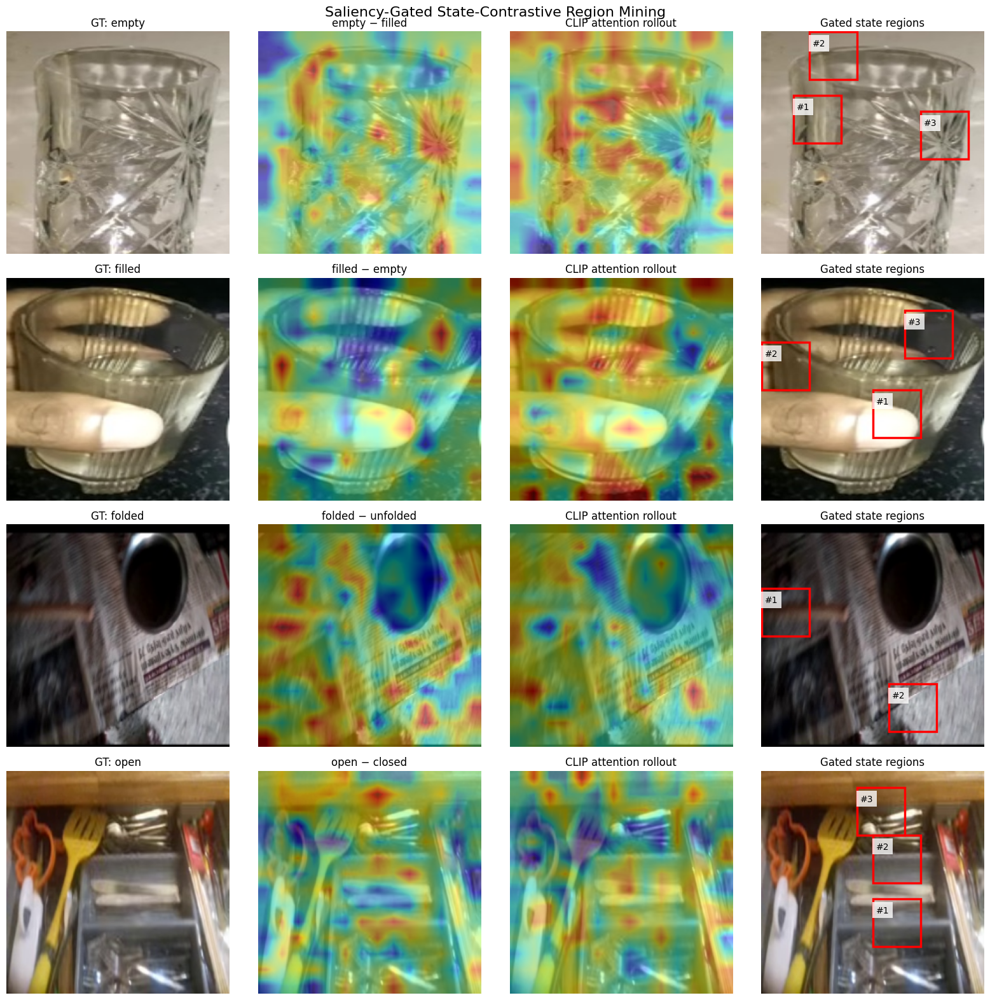

In [80]:
# ============================================================
# SALIENCY-GATED STATE-CONTRASTIVE REGION MINING
#
# Image
# | state contrast
# | CLIP attention rollout
# | gated top regions
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torch.nn.functional as F


TARGET_STATES = [
    "empty",
    "filled",
    "folded",
    "open"
]

REGION_SIZE = 3
NUM_REGIONS = 3
SUPPRESSION_RADIUS = 2


def normalize01(x):

    x = x.clone().float()

    return (
        x - x.min()
    ) / (
        x.max()
        - x.min()
        + 1e-8
    )


def get_saliency_gated_state_map(
    image_tensor,
    state
):

    # State-specific contrast
    contrast_map, opposite = (
        get_highres_patch_scores(
            image_tensor,
            state
        )
    )

    # Generic visual relevance
    visual_relevance = (
        get_clip_attention_rollout(
            image_tensor
        )
    )

    assert (
        contrast_map.shape
        == visual_relevance.shape
    )

    # ----------------------------------------
    # Only evidence supporting TARGET state
    # ----------------------------------------

    positive_contrast = torch.relu(
        contrast_map
    )

    if positive_contrast.max() > 0:

        positive_contrast = (
            positive_contrast
            / (
                positive_contrast.max()
                + 1e-8
            )
        )

    # ----------------------------------------
    # State evidence × visual relevance
    # ----------------------------------------

    gated_map = (
        positive_contrast
        * visual_relevance
    )

    if gated_map.max() > 0:

        gated_map = (
            gated_map
            / (
                gated_map.max()
                + 1e-8
            )
        )

    return (
        contrast_map,
        visual_relevance,
        gated_map,
        opposite
    )


# ============================================================
# Plot
# ============================================================

fig, axes = plt.subplots(
    len(TARGET_STATES),
    4,
    figsize=(16, 4 * len(TARGET_STATES))
)


for row, state in enumerate(
    TARGET_STATES
):

    idx = example_indices[state]

    image_tensor, _ = test_ds[idx]

    img = unnormalize_image(
        image_tensor
    )

    img_np = (
        img.permute(
            1, 2, 0
        ).numpy()
    )

    H_img = img.shape[1]
    W_img = img.shape[2]


    (
        contrast_map,
        visual_relevance,
        gated_map,
        opposite
    ) = get_saliency_gated_state_map(
        image_tensor,
        state
    )


    # ----------------------------------------
    # Mine coherent regions FROM GATED MAP
    # ----------------------------------------

    _, selected_regions = (
        mine_state_regions(
            gated_map,
            region_size=REGION_SIZE,
            num_regions=NUM_REGIONS,
            suppression_radius=SUPPRESSION_RADIUS
        )
    )


    patch_h, patch_w = (
        gated_map.shape
    )

    patch_px_x = (
        W_img / patch_w
    )

    patch_px_y = (
        H_img / patch_h
    )


    # ----------------------------------------
    # Upsample heatmaps
    # ----------------------------------------

    contrast_vis = normalize01(
        contrast_map
    )

    contrast_up = F.interpolate(
        contrast_vis[
            None,
            None
        ],
        size=(H_img, W_img),
        mode="bilinear",
        align_corners=False
    )[0, 0]


    relevance_up = F.interpolate(
        visual_relevance[
            None,
            None
        ],
        size=(H_img, W_img),
        mode="bilinear",
        align_corners=False
    )[0, 0]


    # ========================================================
    # 1 — Image
    # ========================================================

    axes[row, 0].imshow(
        img_np
    )

    axes[row, 0].set_title(
        f"GT: {state}"
    )

    axes[row, 0].axis("off")


    # ========================================================
    # 2 — State contrast
    # ========================================================

    axes[row, 1].imshow(
        img_np
    )

    axes[row, 1].imshow(
        contrast_up.numpy(),
        cmap="jet",
        alpha=0.45
    )

    axes[row, 1].set_title(
        f"{state} − {opposite}"
    )

    axes[row, 1].axis("off")


    # ========================================================
    # 3 — CLIP visual relevance
    # ========================================================

    axes[row, 2].imshow(
        img_np
    )

    axes[row, 2].imshow(
        relevance_up.numpy(),
        cmap="jet",
        alpha=0.45
    )

    axes[row, 2].set_title(
        "CLIP attention rollout"
    )

    axes[row, 2].axis("off")


    # ========================================================
    # 4 — Gated state regions
    # ========================================================

    axes[row, 3].imshow(
        img_np
    )


    for rank, (
        r,
        c,
        score
    ) in enumerate(
        selected_regions,
        start=1
    ):

        x0 = c * patch_px_x
        y0 = r * patch_px_y

        box_w = (
            REGION_SIZE
            * patch_px_x
        )

        box_h = (
            REGION_SIZE
            * patch_px_y
        )

        rect = patches.Rectangle(
            (x0, y0),
            box_w,
            box_h,
            linewidth=2.5,
            edgecolor="red",
            facecolor="none"
        )

        axes[row, 3].add_patch(
            rect
        )

        axes[row, 3].text(
            x0 + 3,
            y0 + 14,
            f"#{rank}",
            fontsize=10,
            bbox=dict(
                facecolor="white",
                alpha=0.8,
                edgecolor="none"
            )
        )


    axes[row, 3].set_title(
        "Gated state regions"
    )

    axes[row, 3].axis("off")


plt.suptitle(
    "Saliency-Gated State-Contrastive Region Mining",
    fontsize=16
)

plt.tight_layout()

plt.show()

In [81]:
# ============================================================
# CELL 1 — Cache test features for fast leave-one-neighbor-out analysis
# ============================================================

import copy
import torch
import torch.nn.functional as F
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# ------------------------------------------------------------
# Build / cache test visual features once
# ------------------------------------------------------------

def build_test_feature_cache():
    feature_batches = []
    target_batches = []

    cnn.eval()

    with torch.inference_mode():
        for images, folder_labels in tqdm(
            test_loader,
            desc="Caching test features"
        ):
            images = images.to(DEVICE, non_blocking=True)

            visual_features = cnn(images)   # [B, 2048]

            visual_features_aug = torch.cat(
                [
                    visual_features,
                    torch.ones(
                        visual_features.shape[0],
                        1,
                        device=DEVICE
                    )
                ],
                dim=1
            )   # [B, 2049]

            batch_targets = torch.tensor(
                [
                    folder_idx_to_global[int(x)]
                    for x in folder_labels
                ],
                dtype=torch.long
            )

            feature_batches.append(
                visual_features_aug.cpu()
            )
            target_batches.append(
                batch_targets
            )

    return (
        torch.cat(feature_batches, dim=0),
        torch.cat(target_batches, dim=0)
    )


if "cached_test_features_aug" not in globals() or "cached_test_targets" not in globals():
    cached_test_features_aug, cached_test_targets = build_test_feature_cache()

print("cached_test_features_aug:", cached_test_features_aug.shape)
print("cached_test_targets     :", cached_test_targets.shape)


# ------------------------------------------------------------
# Helper: calibrated predictions
# ------------------------------------------------------------

def calibrated_predictions(score_matrix, gamma):
    scores = score_matrix.clone()
    scores[:, UNSEEN_IDS] += float(gamma)
    return scores.argmax(dim=1)


# ------------------------------------------------------------
# Helper: state accuracy from predictions
# ------------------------------------------------------------

def state_accuracy(preds, targets, state_idx):
    mask = (targets == state_idx)
    if mask.sum().item() == 0:
        return float("nan")
    return (
        (preds[mask] == targets[mask])
        .float()
        .mean()
        .item()
    )


# ------------------------------------------------------------
# Adaptive baseline objects
# ------------------------------------------------------------

adaptive_scores_cpu = adaptive_scores.detach().cpu().clone()
adaptive_targets_cpu = adaptive_targets.detach().cpu().clone()

adaptive_preds_cpu = calibrated_predictions(
    adaptive_scores_cpu,
    float(adaptive_best["gamma"])
)

print("✓ Helper cache ready")

Caching test features:   0%|          | 0/25 [00:00<?, ?it/s]

cached_test_features_aug: torch.Size([3109, 2049])
cached_test_targets     : torch.Size([3109])
✓ Helper cache ready


In [83]:
# ============================================================
# CELL 2 — Leave-one-neighbor-out influence analysis
# ============================================================

def analyze_state_neighbor_influence(
    target_state,
    top_k_neighbors=10,
    show_plots=True
):
    """
    Leave one adaptive-graph neighbor out at a time,
    regenerate the target state's Tr-GCN classifier,
    and measure:

    1) Classifier change:
       1 - cosine(original_vector, ablated_vector)

    2) Target-state accuracy change at adaptive best gamma

    Returns:
        influence_df
    """

    # --------------------------------------------------------
    # IDs
    # --------------------------------------------------------

    state_idx = OSDD_CLASSES.index(target_state)
    state_graph_id = state_node_ids[target_state]

    # --------------------------------------------------------
    # Baseline adaptive classifier for this state
    # --------------------------------------------------------

    baseline_vector = (
        adaptive_clip_vectors[state_idx]
        .detach()
        .cpu()
        .clone()
    )   # [2049]

    baseline_state_acc = state_accuracy(
        adaptive_preds_cpu,
        adaptive_targets_cpu,
        state_idx
    )

    # --------------------------------------------------------
    # Adaptive graph neighborhood
    # --------------------------------------------------------

    original_neighbors = adaptive_clip_graph["rw_adj_lists"][state_graph_id]

    # already reranked; keep top-k
    candidate_neighbors = original_neighbors[:top_k_neighbors]

    print(f"\n============================================================")
    print(f"STATE: {target_state}")
    print(f"Graph node ID: {state_graph_id}")
    print(f"Evaluating top {len(candidate_neighbors)} adaptive neighbors")
    print(f"Baseline adaptive state accuracy: {100*baseline_state_acc:.2f}%")
    print(f"============================================================")

    rows = []

    for rank, item in enumerate(candidate_neighbors, start=1):

        neighbor_id = int(item[0])
        neighbor_name = str(g["nodes"][neighbor_id])
        adaptive_score = float(item[-1])

        # ----------------------------------------------------
        # Remove this ONE neighbor from the target state's list
        # ----------------------------------------------------

        modified_graph = copy.deepcopy(adaptive_clip_graph)

        modified_graph["rw_adj_lists"][state_graph_id] = [
            x for x in modified_graph["rw_adj_lists"][state_graph_id]
            if int(x[0]) != neighbor_id
        ]

        # ----------------------------------------------------
        # Regenerate ONLY this state's classifier vector
        # ----------------------------------------------------

        with torch.inference_mode():
            ablated_vector = trgcn_predict_nodes(
                [state_graph_id],
                modified_graph
            )[0].detach().cpu()   # [2049]

        # ----------------------------------------------------
        # Influence on classifier vector
        # ----------------------------------------------------

        cosine = F.cosine_similarity(
            baseline_vector.unsqueeze(0),
            ablated_vector.unsqueeze(0),
            dim=1
        ).item()

        vector_influence = 1.0 - cosine

        # ----------------------------------------------------
        # Recompute THIS state's score column on all test images
        # ----------------------------------------------------

        new_state_scores = (
            cached_test_features_aug
            @ ablated_vector.unsqueeze(1)
        ).squeeze(1)   # [N]

        modified_scores = adaptive_scores_cpu.clone()
        modified_scores[:, state_idx] = new_state_scores

        modified_preds = calibrated_predictions(
            modified_scores,
            float(adaptive_best["gamma"])
        )

        new_state_acc = state_accuracy(
            modified_preds,
            adaptive_targets_cpu,
            state_idx
        )

        delta_state_acc_pp = 100.0 * (new_state_acc - baseline_state_acc)

        rows.append({
            "Rank": rank,
            "Neighbor": neighbor_name,
            "Neighbor Node ID": neighbor_id,
            "Adaptive Score": adaptive_score,
            "Cosine w/original": cosine,
            "Vector Influence": vector_influence,
            "Baseline State Acc (%)": 100.0 * baseline_state_acc,
            "Ablated State Acc (%)": 100.0 * new_state_acc,
            "Δ State Acc (pp)": delta_state_acc_pp
        })

    influence_df = pd.DataFrame(rows)

    # sort by influence
    influence_df = influence_df.sort_values(
        "Vector Influence",
        ascending=False
    ).reset_index(drop=True)

    display(influence_df.round(4))

    # --------------------------------------------------------
    # Plots
    # --------------------------------------------------------

    if show_plots:

        # Plot 1: classifier-vector influence
        plt.figure(figsize=(9, 4.5))
        plt.barh(
            influence_df["Neighbor"],
            influence_df["Vector Influence"]
        )
        plt.gca().invert_yaxis()
        plt.xlabel("1 - cosine(original, ablated)")
        plt.ylabel("Neighbor concept")
        plt.title(f"{target_state.upper()} — Neighbor Influence on Classifier")
        plt.tight_layout()
        plt.show()

        # Plot 2: state-accuracy change
        plt.figure(figsize=(9, 4.5))
        plt.barh(
            influence_df["Neighbor"],
            influence_df["Δ State Acc (pp)"]
        )
        plt.gca().invert_yaxis()
        plt.xlabel("Accuracy change after removing neighbor (pp)")
        plt.ylabel("Neighbor concept")
        plt.title(f"{target_state.upper()} — Effect on {target_state} Accuracy")
        plt.tight_layout()
        plt.show()

    return influence_df


STATE: open
Graph node ID: 3
Evaluating top 10 adaptive neighbors
Baseline adaptive state accuracy: 74.40%


,Rank,Neighbor,Neighbor Node ID,Adaptive Score,Cosine w/original,Vector Influence,Baseline State Acc (%),Ablated State Acc (%),Δ State Acc (pp)
0,10,opener,146,0.8192,0.9993,0.0007,74.3961,75.8454,1.4493
1,4,openest,155,0.8254,0.9994,0.0006,74.3961,73.9130,-0.4831
2,9,openable,158,0.8200,0.9996,0.0004,74.3961,74.8792,0.4831
3,8,unopen,147,0.8203,0.9996,0.0004,74.3961,74.3961,0.0000
4,6,reopen,2,0.8234,0.9997,0.0003,74.3961,73.9130,-0.4831
5,5,opens,165,0.8247,0.9997,0.0003,74.3961,74.8792,0.4831
6,7,openly,152,0.8205,0.9997,0.0003,74.3961,74.8792,0.4831
7,2,opened,164,0.8258,0.9997,0.0003,74.3961,73.9130,-0.4831
8,3,close,168,0.8256,0.9998,0.0002,74.3961,74.3961,0.0000
9,1,closed,88,0.9432,0.9998,0.0002,74.3961,74.3961,0.0000


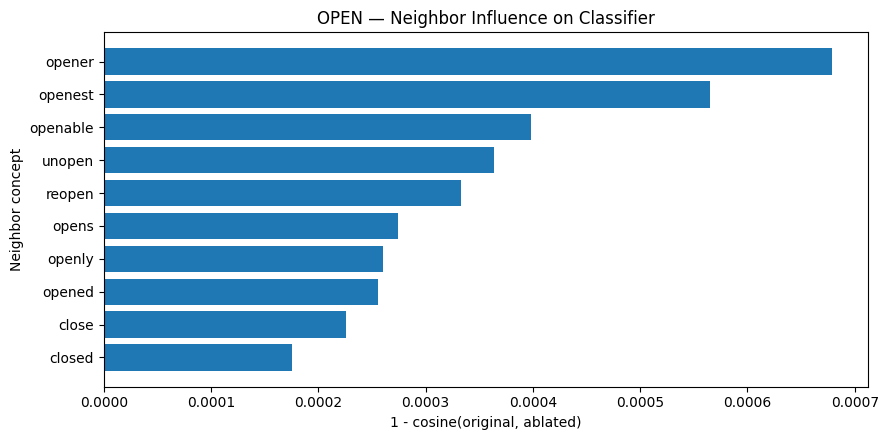

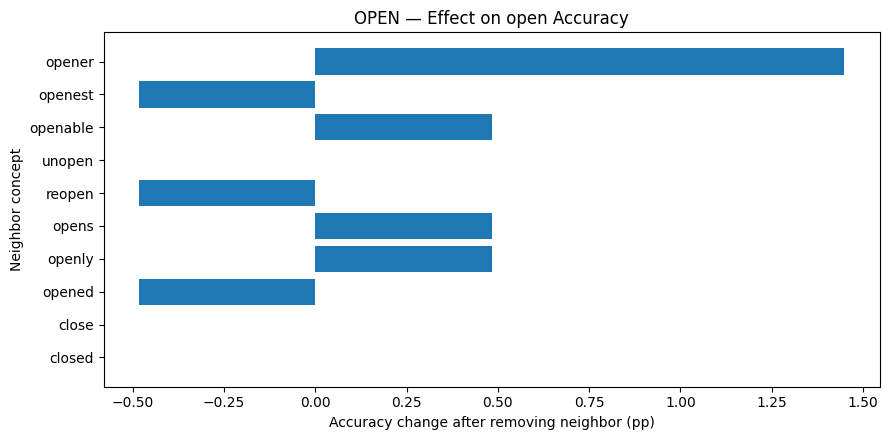

In [84]:
# ============================================================
# CELL 3 — First run: OPEN
# ============================================================

open_influence_df = analyze_state_neighbor_influence(
    target_state="open",
    top_k_neighbors=10,
    show_plots=True
)


STATE: open
Graph node ID: 3
Evaluating top 10 adaptive neighbors
Baseline adaptive state accuracy: 74.40%


,Rank,Neighbor,Neighbor Node ID,Adaptive Score,Cosine w/original,Vector Influence,Baseline State Acc (%),Ablated State Acc (%),Δ State Acc (pp)
0,10,opener,146,0.8192,0.9993,0.0007,74.3961,75.8454,1.4493
1,4,openest,155,0.8254,0.9994,0.0006,74.3961,73.9130,-0.4831
2,9,openable,158,0.8200,0.9996,0.0004,74.3961,74.8792,0.4831
3,8,unopen,147,0.8203,0.9996,0.0004,74.3961,74.3961,0.0000
4,6,reopen,2,0.8234,0.9997,0.0003,74.3961,73.9130,-0.4831
5,5,opens,165,0.8247,0.9997,0.0003,74.3961,74.8792,0.4831
6,7,openly,152,0.8205,0.9997,0.0003,74.3961,74.8792,0.4831
7,2,opened,164,0.8258,0.9997,0.0003,74.3961,73.9130,-0.4831
8,3,close,168,0.8256,0.9998,0.0002,74.3961,74.3961,0.0000
9,1,closed,88,0.9432,0.9998,0.0002,74.3961,74.3961,0.0000


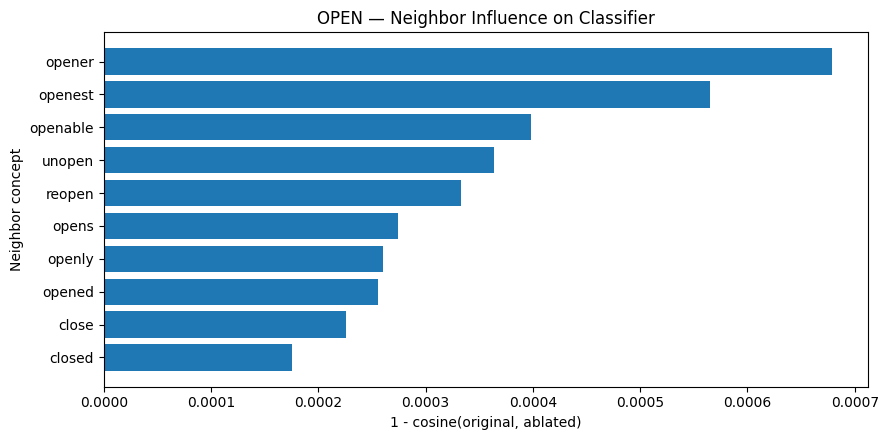

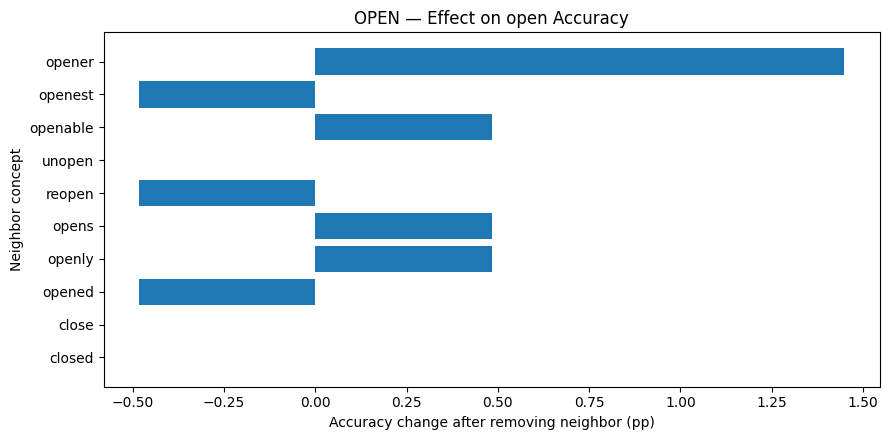


STATE: filled
Graph node ID: 105
Evaluating top 10 adaptive neighbors
Baseline adaptive state accuracy: 18.37%


,Rank,Neighbor,Neighbor Node ID,Adaptive Score,Cosine w/original,Vector Influence,Baseline State Acc (%),Ablated State Acc (%),Δ State Acc (pp)
0,3,billabong,323,0.8403,0.9974,0.0026,18.3673,21.4286,3.0612
1,2,jeon,395,0.8484,0.9977,0.0023,18.3673,16.3265,-2.0408
2,4,black,376,0.8260,0.9979,0.0021,18.3673,20.9184,2.5510
3,5,funfilled,368,0.7935,0.9980,0.0020,18.3673,14.7959,-3.5714
4,6,inflated,402,0.7909,0.9983,0.0017,18.3673,17.8571,-0.5102
5,10,rife,116,0.7848,0.9987,0.0013,18.3673,20.4082,2.0408
6,1,chockablock,398,0.9347,0.9990,0.0010,18.3673,19.3878,1.0204
7,7,painfilled,135,0.7878,0.9999,0.0001,18.3673,18.3673,0.0000
8,8,starfilled,111,0.7853,0.9999,0.0001,18.3673,18.3673,0.0000
9,9,ungorged,371,0.7848,0.9999,0.0001,18.3673,18.3673,0.0000


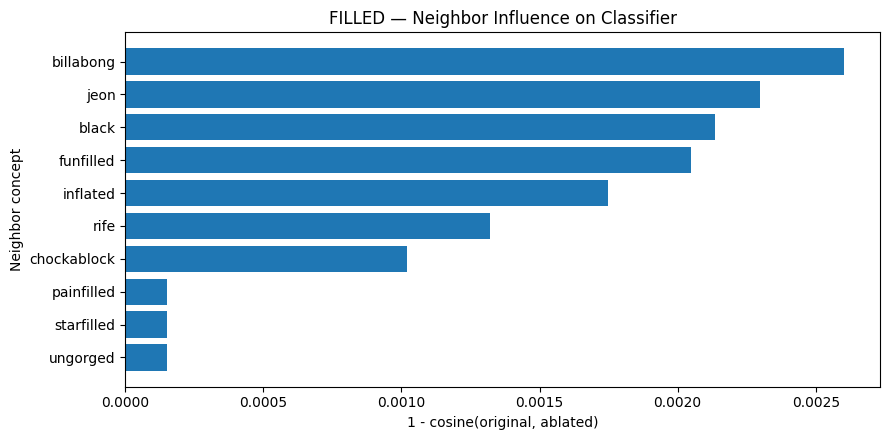

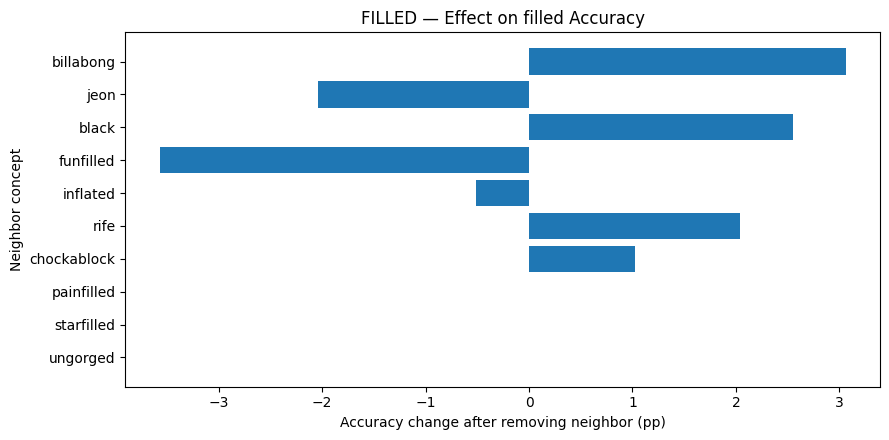


STATE: empty
Graph node ID: 1
Evaluating top 10 adaptive neighbors
Baseline adaptive state accuracy: 58.73%


,Rank,Neighbor,Neighbor Node ID,Adaptive Score,Cosine w/original,Vector Influence,Baseline State Acc (%),Ablated State Acc (%),Δ State Acc (pp)
0,2,full,16,0.9020,0.9996,0.0004,58.7326,59.6600,0.9274
1,9,jejune,54,0.8055,0.9996,0.0004,58.7326,60.2782,1.5456
2,10,gassing,55,0.8044,0.9996,0.0004,58.7326,60.7419,2.0093
3,1,space,72,0.9297,0.9996,0.0004,58.7326,60.5873,1.8547
4,5,emptied,12,0.8225,0.9997,0.0003,58.7326,59.3508,0.6182
5,8,emptiest,14,0.8085,0.9997,0.0003,58.7326,60.2782,1.5456
6,3,evacuate,75,0.8512,0.9997,0.0003,58.7326,60.1236,1.3910
7,6,area,64,0.8119,0.9998,0.0002,58.7326,60.2782,1.5456
8,7,arnk,61,0.8116,0.9998,0.0002,58.7326,59.6600,0.9274
9,4,nullness,28,0.8246,0.9998,0.0002,58.7326,59.6600,0.9274


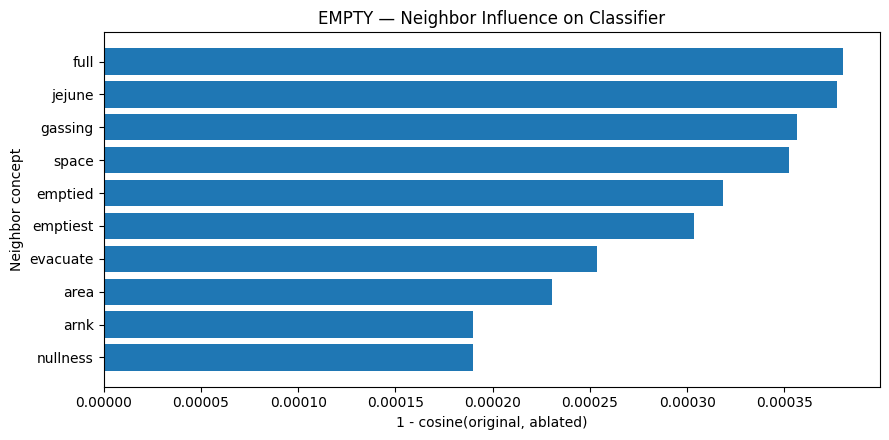

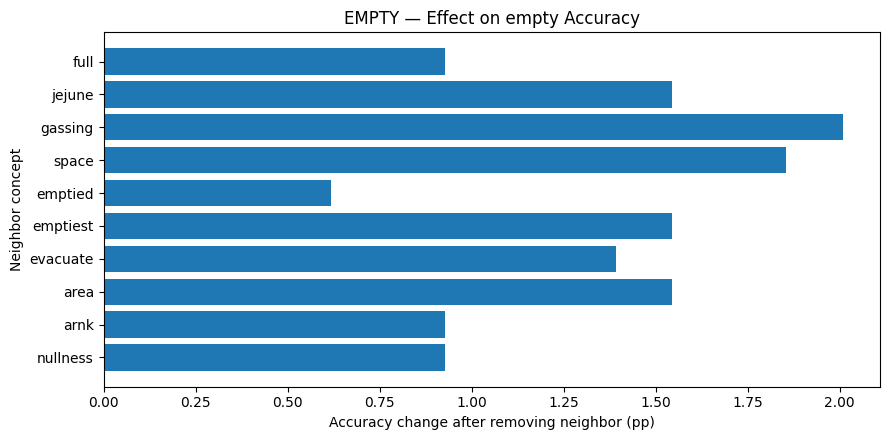


STATE: closed
Graph node ID: 88
Evaluating top 10 adaptive neighbors
Baseline adaptive state accuracy: 11.27%


,Rank,Neighbor,Neighbor Node ID,Adaptive Score,Cosine w/original,Vector Influence,Baseline State Acc (%),Ablated State Acc (%),Δ State Acc (pp)
0,5,unopened,350,0.7290,0.9996,0.0004,11.2701,12.1646,0.8945
1,2,cycle,89,0.7345,0.9997,0.0003,11.2701,12.1646,0.8945
2,7,closedness,310,0.7276,0.9997,0.0003,11.2701,11.6279,0.3578
3,10,unclosed,180,0.7249,0.9998,0.0002,11.2701,11.6279,0.3578
4,6,close,168,0.7286,0.9999,0.0001,11.2701,11.6279,0.3578
5,1,open,3,0.9467,1.0000,0.0000,11.2701,11.2701,0.0000
6,8,pluriclosed,327,0.7272,1.0000,0.0000,11.2701,11.2701,0.0000
7,3,coclosed,121,0.7305,1.0000,0.0000,11.2701,11.2701,0.0000
8,9,superdisk,326,0.7270,1.0000,0.0000,11.2701,11.2701,0.0000
9,4,nonclosed,319,0.7294,1.0000,-0.0000,11.2701,11.2701,0.0000


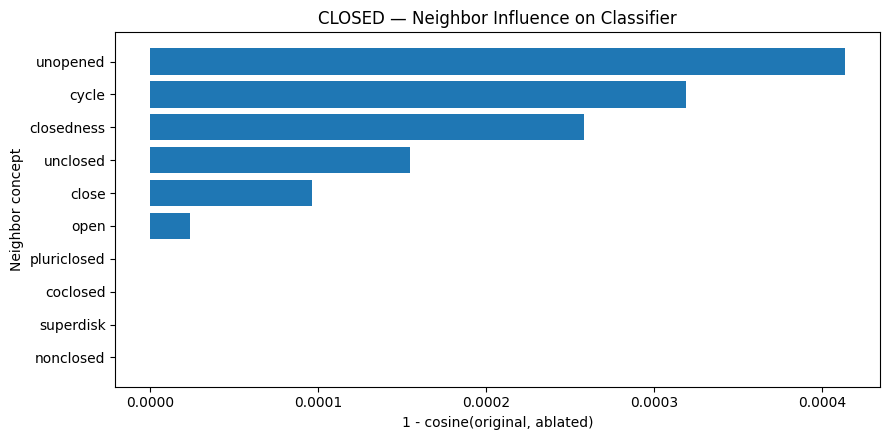

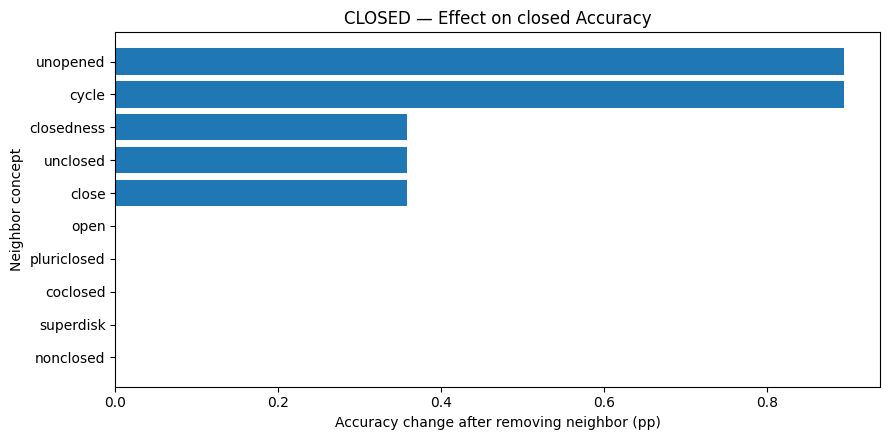

In [85]:
# ============================================================
# CELL 4 — Run for several states
# ============================================================

states_to_analyze = ["open", "filled", "empty", "closed"]

influence_results = {}

for state in states_to_analyze:
    influence_results[state] = analyze_state_neighbor_influence(
        target_state=state,
        top_k_neighbors=10,
        show_plots=True
    )

In [86]:
# ============================================================
# CELL 5 — Compact summary table for slides
# ============================================================

summary_rows = []

for state, df in influence_results.items():

    top3 = df.head(3).copy()

    for i, (_, row) in enumerate(top3.iterrows(), start=1):
        summary_rows.append({
            "State": state,
            "Top-k": i,
            "Neighbor": row["Neighbor"],
            "Adaptive Score": row["Adaptive Score"],
            "Vector Influence": row["Vector Influence"],
            "Δ State Acc (pp)": row["Δ State Acc (pp)"]
        })

summary_df = pd.DataFrame(summary_rows)

print("===== TOP INFLUENTIAL NEIGHBORS =====")
display(summary_df.round(4))

===== TOP INFLUENTIAL NEIGHBORS =====


,State,Top-k,Neighbor,Adaptive Score,Vector Influence,Δ State Acc (pp)
0,open,1,opener,0.8192,0.0007,1.4493
1,open,2,openest,0.8254,0.0006,-0.4831
2,open,3,openable,0.8200,0.0004,0.4831
3,filled,1,billabong,0.8403,0.0026,3.0612
4,filled,2,jeon,0.8484,0.0023,-2.0408
5,filled,3,black,0.8260,0.0021,2.5510
6,empty,1,full,0.9020,0.0004,0.9274
7,empty,2,jejune,0.8055,0.0004,1.5456
8,empty,3,gassing,0.8044,0.0004,2.0093
9,closed,1,unopened,0.7290,0.0004,0.8945


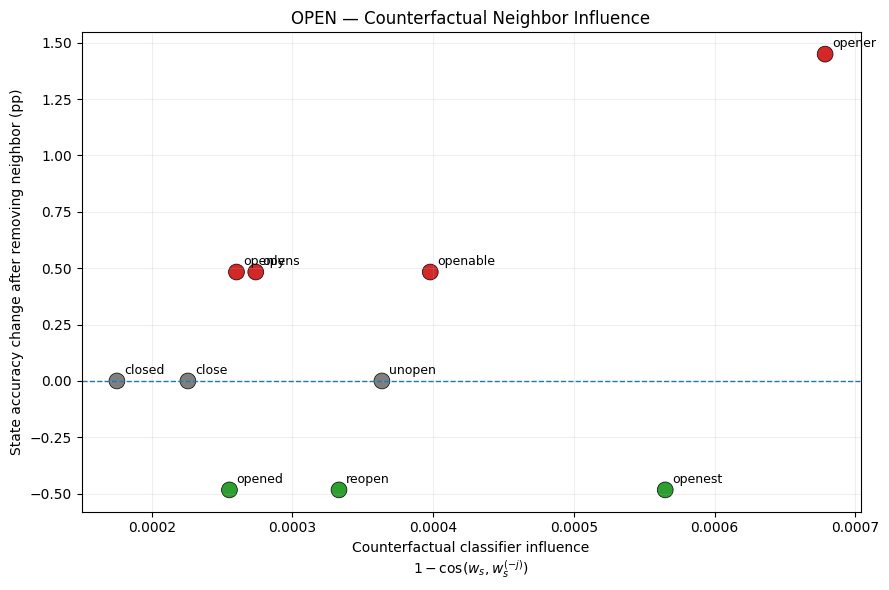

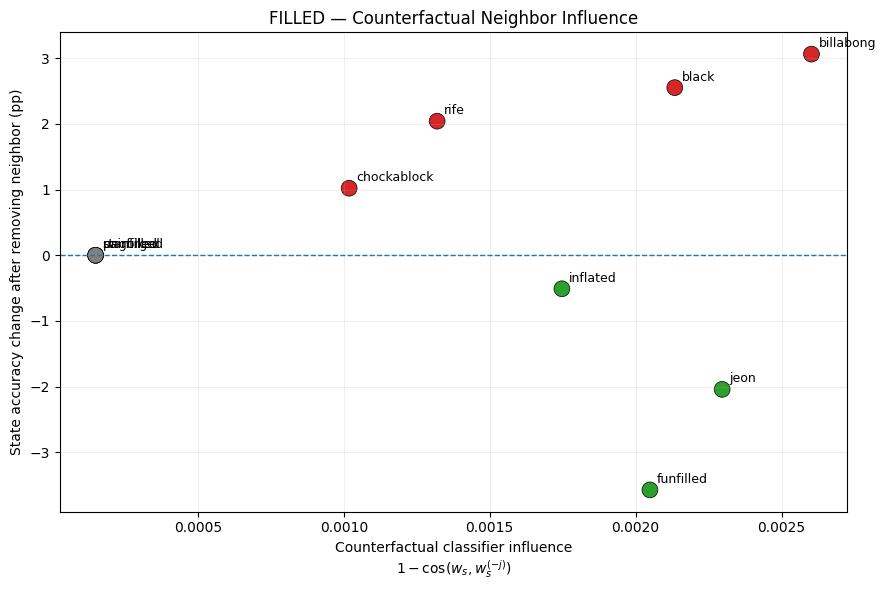

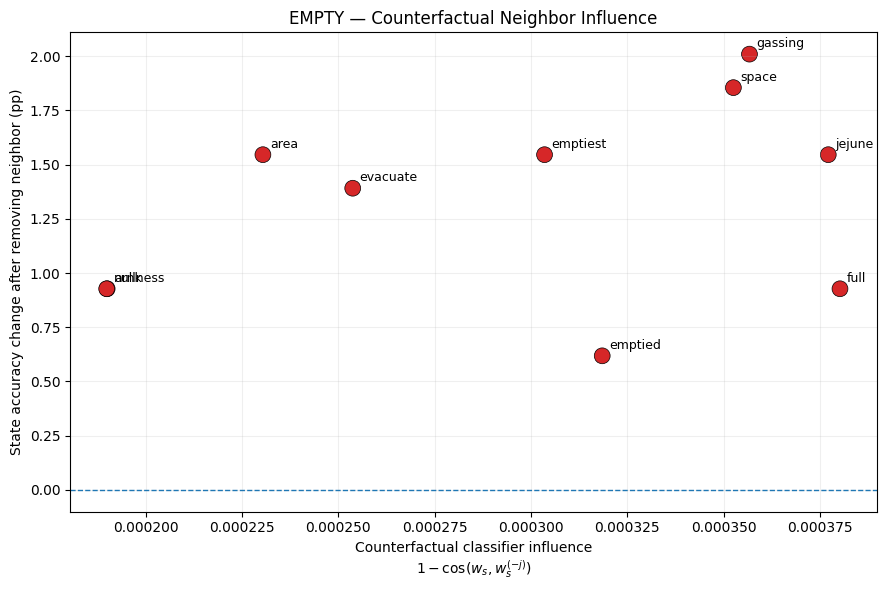

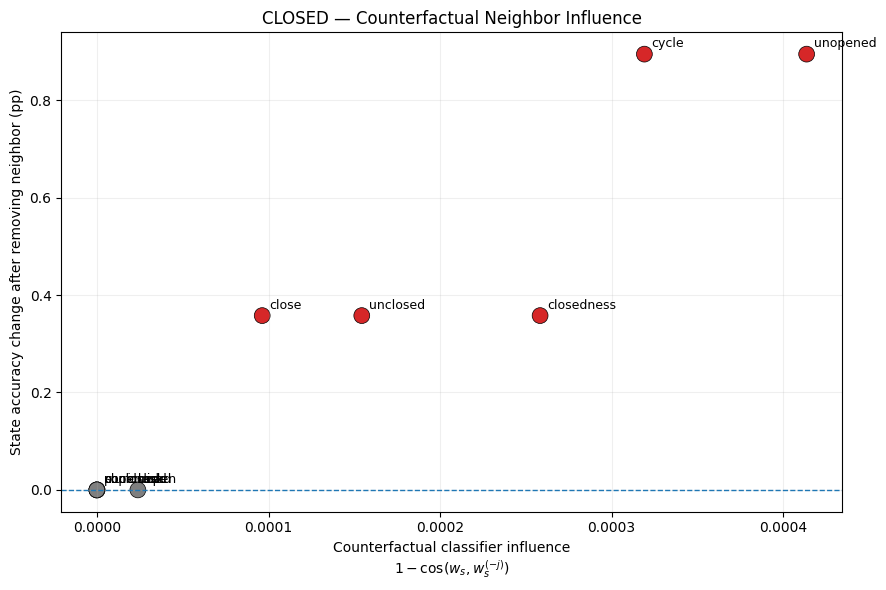

In [90]:
def plot_counterfactual_neighbor_map_clean(
    influence_df,
    state
):

    df = influence_df.copy()

    colors = []

    for delta in df["Δ State Acc (pp)"]:

        if delta > 0.1:
            colors.append("tab:red")      # harmful
        elif delta < -0.1:
            colors.append("tab:green")    # useful
        else:
            colors.append("tab:gray")     # neutral


    plt.figure(figsize=(9, 6))

    plt.scatter(
        df["Vector Influence"],
        df["Δ State Acc (pp)"],
        s=130,
        c=colors,
        edgecolors="black",
        linewidths=0.5
    )

    plt.axhline(
        0,
        linestyle="--",
        linewidth=1
    )


    for _, row in df.iterrows():

        plt.annotate(
            row["Neighbor"],
            (
                row["Vector Influence"],
                row["Δ State Acc (pp)"]
            ),
            xytext=(5, 5),
            textcoords="offset points",
            fontsize=9
        )


    plt.xlabel(
        "Counterfactual classifier influence\n"
        r"$1-\cos(w_s,w_s^{(-j)})$"
    )

    plt.ylabel(
        "State accuracy change after removing neighbor (pp)"
    )

    plt.title(
        f"{state.upper()} — Counterfactual Neighbor Influence"
    )

    plt.grid(alpha=0.2)

    plt.tight_layout()
    plt.show()


# ------------------------------------------------------------
# Plot important states
# ------------------------------------------------------------

for state in [
    "open",
    "filled",
    "empty",
    "closed"
]:

    plot_counterfactual_neighbor_map_clean(
        influence_results[state],
        state
    )

In [88]:
# ============================================================
# COUNTERFACTUAL INFLUENCE-AWARE RISK
#
# LABEL FREE:
#
# risk =
# normalized classifier influence
#       ×
# semantic mismatch
# ============================================================

import torch
import pandas as pd


def add_semantic_risk(
    influence_df,
    state
):

    df = influence_df.copy()

    target_feature = (
        state_clip_features[state]
        .detach()
        .float()
        .cpu()
    )

    semantic_scores = []


    for _, row in df.iterrows():

        neighbor_id = int(
            row["Neighbor Node ID"]
        )

        neighbor_feature = (
            clip_node_features[
                neighbor_id
            ]
            .detach()
            .float()
            .cpu()
        )

        similarity = torch.dot(
            target_feature,
            neighbor_feature
        ).item()

        # [-1,1] -> [0,1]
        similarity01 = (
            similarity + 1.0
        ) / 2.0

        semantic_scores.append(
            similarity01
        )


    df["CLIP Semantic Alignment"] = (
        semantic_scores
    )


    # ----------------------------------------
    # Normalize influence WITHIN state
    # ----------------------------------------

    influence = (
        df["Vector Influence"]
        .to_numpy()
    )

    if influence.max() > influence.min():

        influence_norm = (
            influence - influence.min()
        ) / (
            influence.max()
            - influence.min()
        )

    else:

        influence_norm = (
            influence * 0
        )


    df[
        "Normalized Influence"
    ] = influence_norm


    # ----------------------------------------
    # Influence × semantic mismatch
    # ----------------------------------------

    df["Counterfactual Risk"] = (
        df["Normalized Influence"]
        *
        (
            1.0
            -
            df[
                "CLIP Semantic Alignment"
            ]
        )
    )


    return df.sort_values(
        "Counterfactual Risk",
        ascending=False
    ).reset_index(drop=True)

In [89]:
risk_results = {}

for state in [
    "open",
    "filled",
    "empty",
    "closed"
]:

    risk_results[state] = (
        add_semantic_risk(
            influence_results[state],
            state
        )
    )


for state, df in risk_results.items():

    print(
        f"\n===== {state.upper()} ====="
    )

    display(
        df[[
            "Neighbor",
            "CLIP Semantic Alignment",
            "Vector Influence",
            "Counterfactual Risk",
            "Δ State Acc (pp)"
        ]].round(4)
    )


===== OPEN =====


,Neighbor,CLIP Semantic Alignment,Vector Influence,Counterfactual Risk,Δ State Acc (pp)
0,opener,0.9340,0.0007,0.0660,1.4493
1,openest,0.9412,0.0006,0.0455,-0.4831
2,openable,0.9350,0.0004,0.0288,0.4831
3,unopen,0.9352,0.0004,0.0242,0.0000
4,reopen,0.9388,0.0003,0.0192,-0.4831
5,opens,0.9404,0.0003,0.0117,0.4831
6,openly,0.9355,0.0003,0.0109,0.4831
7,opened,0.9365,0.0003,0.0101,-0.4831
8,close,0.9313,0.0002,0.0069,0.0000
9,closed,0.9349,0.0002,0.0000,0.0000



===== FILLED =====


,Neighbor,CLIP Semantic Alignment,Vector Influence,Counterfactual Risk,Δ State Acc (pp)
0,billabong,0.8814,0.0026,0.1186,3.0612
1,jeon,0.8933,0.0023,0.0934,-2.0408
2,black,0.9176,0.0021,0.0667,2.5510
3,funfilled,0.9273,0.0020,0.0563,-3.5714
4,inflated,0.9236,0.0017,0.0497,-0.5102
5,rife,0.9147,0.0013,0.0407,2.0408
6,chockablock,0.9050,0.0010,0.0337,1.0204
7,starfilled,0.9154,0.0001,0.0000,0.0000
8,painfilled,0.9190,0.0001,0.0000,0.0000
9,ungorged,0.9147,0.0001,0.0000,0.0000



===== EMPTY =====


,Neighbor,CLIP Semantic Alignment,Vector Influence,Counterfactual Risk,Δ State Acc (pp)
0,jejune,0.8977,0.0004,0.1006,1.5456
1,gassing,0.8963,0.0004,0.0909,2.0093
2,full,0.9129,0.0004,0.0871,0.9274
3,space,0.9125,0.0004,0.0747,1.8547
4,emptied,0.9188,0.0003,0.0548,0.6182
5,evacuate,0.8847,0.0003,0.0387,1.3910
6,emptiest,0.9363,0.0003,0.0380,1.5456
7,area,0.9057,0.0002,0.0201,1.5456
8,arnk,0.9052,0.0002,0.0001,0.9274
9,nullness,0.8865,0.0002,0.0000,0.9274



===== CLOSED =====


,Neighbor,CLIP Semantic Alignment,Vector Influence,Counterfactual Risk,Δ State Acc (pp)
0,unopened,0.9240,0.0004,0.0760,0.8945
1,cycle,0.9209,0.0003,0.0610,0.8945
2,closedness,0.9325,0.0003,0.0422,0.3578
3,unclosed,0.9290,0.0002,0.0265,0.3578
4,close,0.9338,0.0001,0.0154,0.3578
5,open,0.9309,0.0000,0.0040,0.0000
6,superdisk,0.9011,0.0000,0.0000,0.0000
7,pluriclosed,0.9116,0.0000,0.0000,0.0000
8,coclosed,0.9362,0.0000,0.0000,0.0000
9,nonclosed,0.9348,-0.0000,0.0000,0.0000


In [91]:
# ============================================================
# COUNTERFACTUAL GRAPH ATTRIBUTION VISUALIZATION
#
# Node size  = classifier influence
# Edge width = adaptive graph score
# Red        = harmful neighbor
# Green      = useful neighbor
# Gray       = neutral
# ============================================================

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np


def plot_counterfactual_graph(
    influence_df,
    state,
    figsize=(9, 9)
):

    df = influence_df.copy()

    G = nx.Graph()

    # --------------------------------------------------------
    # Center state node
    # --------------------------------------------------------

    center = state.upper()

    G.add_node(
        center,
        kind="state"
    )


    # --------------------------------------------------------
    # Neighbor nodes + edges
    # --------------------------------------------------------

    for _, row in df.iterrows():

        neighbor = str(
            row["Neighbor"]
        )

        G.add_node(
            neighbor,
            kind="neighbor"
        )

        G.add_edge(
            center,
            neighbor,
            weight=float(
                row["Adaptive Score"]
            )
        )


    # --------------------------------------------------------
    # Circular layout with state at center
    # --------------------------------------------------------

    neighbors = list(
        df["Neighbor"]
        .astype(str)
    )

    pos = {
        center: np.array(
            [0.0, 0.0]
        )
    }

    angles = np.linspace(
        0,
        2 * np.pi,
        len(neighbors),
        endpoint=False
    )

    for angle, neighbor in zip(
        angles,
        neighbors
    ):

        pos[neighbor] = np.array([
            np.cos(angle),
            np.sin(angle)
        ])


    # --------------------------------------------------------
    # Scale influence -> node size
    # --------------------------------------------------------

    influence = (
        df["Vector Influence"]
        .to_numpy()
    )

    if influence.max() > influence.min():

        influence_norm = (
            influence - influence.min()
        ) / (
            influence.max()
            - influence.min()
        )

    else:

        influence_norm = np.zeros_like(
            influence
        )


    neighbor_sizes = (
        900
        +
        2200 * influence_norm
    )


    # --------------------------------------------------------
    # Node colors based on counterfactual effect
    #
    # removal improves accuracy -> harmful -> red
    # removal hurts accuracy    -> useful   -> green
    # --------------------------------------------------------

    neighbor_colors = []

    for delta in df[
        "Δ State Acc (pp)"
    ]:

        if delta > 0.1:

            neighbor_colors.append(
                "tab:red"
            )

        elif delta < -0.1:

            neighbor_colors.append(
                "tab:green"
            )

        else:

            neighbor_colors.append(
                "lightgray"
            )


    # --------------------------------------------------------
    # Edge widths from adaptive graph relevance
    # --------------------------------------------------------

    adaptive_scores = (
        df["Adaptive Score"]
        .to_numpy()
    )

    if adaptive_scores.max() > adaptive_scores.min():

        edge_norm = (
            adaptive_scores
            - adaptive_scores.min()
        ) / (
            adaptive_scores.max()
            - adaptive_scores.min()
        )

    else:

        edge_norm = np.zeros_like(
            adaptive_scores
        )


    edge_widths = (
        1.0
        +
        4.0 * edge_norm
    )


    # ========================================================
    # DRAW
    # ========================================================

    plt.figure(
        figsize=figsize
    )


    # edges
    edge_list = [
        (center, n)
        for n in neighbors
    ]

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=edge_list,
        width=edge_widths,
        alpha=0.55
    )


    # center state
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=[center],
        node_size=4200,
        node_color="tab:blue",
        edgecolors="black",
        linewidths=1.5
    )


    # neighbors
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=neighbors,
        node_size=neighbor_sizes,
        node_color=neighbor_colors,
        edgecolors="black",
        linewidths=1.0
    )


    # labels
    nx.draw_networkx_labels(
        G,
        pos,
        font_size=10,
        font_weight="bold"
    )


    plt.title(
        f"{center} — Counterfactual Graph Attribution",
        fontsize=16
    )


    # --------------------------------------------------------
    # Legend
    # --------------------------------------------------------

    from matplotlib.lines import Line2D

    legend_elements = [

        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="None",
            markerfacecolor="tab:red",
            markeredgecolor="black",
            markersize=12,
            label="Harmful: removal improves accuracy"
        ),

        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="None",
            markerfacecolor="tab:green",
            markeredgecolor="black",
            markersize=12,
            label="Useful: removal reduces accuracy"
        ),

        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="None",
            markerfacecolor="lightgray",
            markeredgecolor="black",
            markersize=12,
            label="Neutral"
        )
    ]


    plt.legend(
        handles=legend_elements,
        loc="lower center",
        bbox_to_anchor=(0.5, -0.09),
        ncol=1
    )


    plt.axis("off")
    plt.tight_layout()
    plt.show()

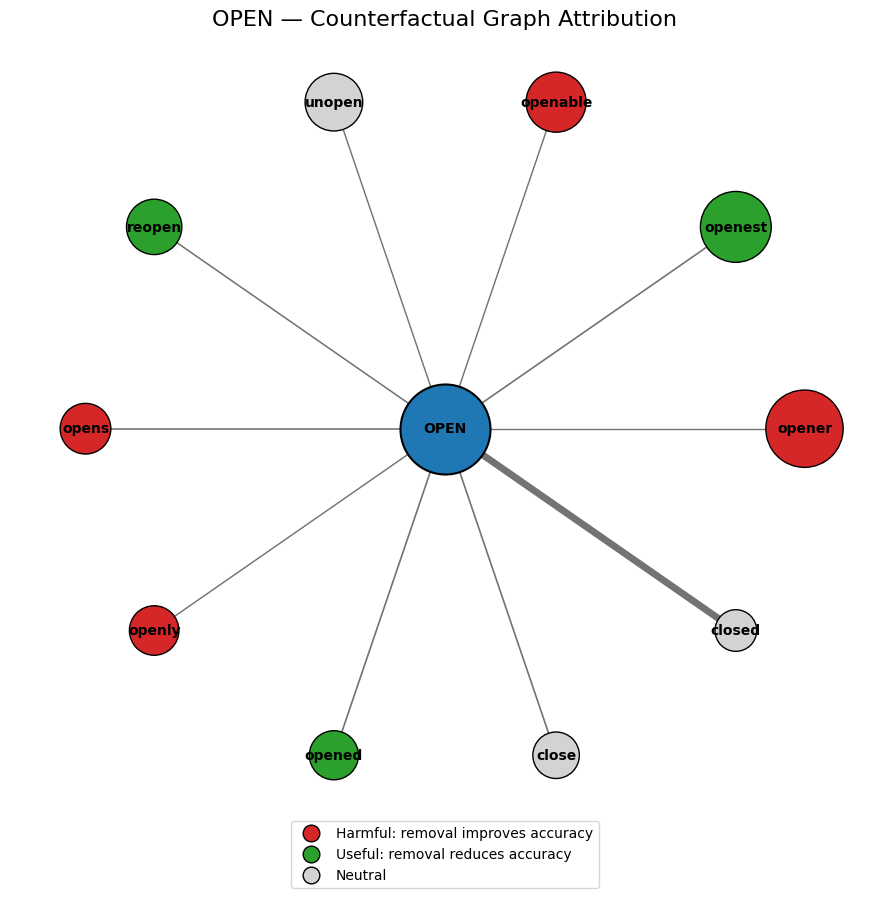

In [92]:
plot_counterfactual_graph(
    influence_results["open"],
    "open"
)

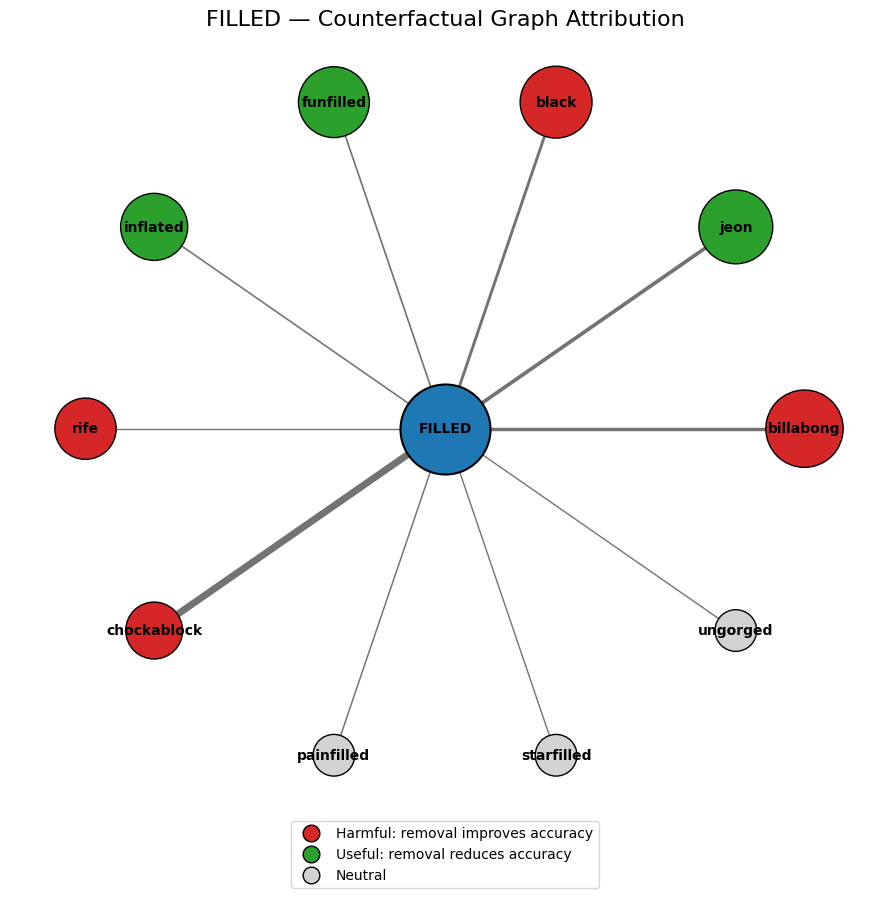

In [93]:
plot_counterfactual_graph(
    influence_results["filled"],
    "filled"
)

In [104]:
# ============================================================
# OPPOSITION-AWARE CONTRASTIVE GRAPH GATING (OCGG)
#
# Instead of absolute:
#     sim(neighbor, state)
#
# use contrastive:
#     sim(neighbor, state)
#       -
#     sim(neighbor, opposite_state)
#
# Then fuse with original RW relevance using the SAME
# ambiguity-adaptive lambda already computed earlier.
# ============================================================

import copy
import torch
import pandas as pd


OPPOSITE_STATE = {
    "open": "closed",
    "closed": "open",

    "empty": "filled",
    "filled": "empty",

    "folded": "unfolded",
    "unfolded": "folded",

    "plugged": "unplugged",
    "unplugged": "plugged",
}


def minmax01(x):

    x = torch.tensor(
        x,
        dtype=torch.float32
    )

    if x.max() > x.min():

        return (
            x - x.min()
        ) / (
            x.max() - x.min()
        )

    return torch.ones_like(x)


def deduplicate_neighbors(items):

    best = {}

    for item in items:

        nid = int(item[0])
        rw = float(item[-1])

        if (
            nid not in best
            or rw > float(best[nid][-1])
        ):

            best[nid] = item

    return list(
        best.values()
    )


def build_opposition_aware_graph():

    modified_rw = copy.deepcopy(
        rw_adj_lists
    )


    for state, state_id in state_node_ids.items():

        items = deduplicate_neighbors(
            rw_adj_lists[state_id]
        )

        if not items:
            continue


        # ====================================================
        # 1. Original graph relevance
        # ====================================================

        rw_raw = [
            float(item[-1])
            for item in items
        ]

        rw_norm = minmax01(
            rw_raw
        )


        # ====================================================
        # 2. Visual-semantic score
        # ====================================================

        target_feature = (
            state_clip_features[state]
        )


        semantic_raw = []


        # ----------------------------------------------------
        # Contrastive states
        # ----------------------------------------------------

        if state in OPPOSITE_STATE:

            opposite = (
                OPPOSITE_STATE[state]
            )

            opposite_feature = (
                state_clip_features[
                    opposite
                ]
            )


            for item in items:

                nid = int(
                    item[0]
                )

                neighbor_feature = (
                    clip_node_features[
                        nid
                    ]
                )


                target_sim = torch.dot(
                    target_feature,
                    neighbor_feature
                ).item()


                opposite_sim = torch.dot(
                    opposite_feature,
                    neighbor_feature
                ).item()


                # ============================================
                # THE NEW CONTRASTIVE SIGNAL
                # ============================================

                semantic_raw.append(
                    target_sim
                    -
                    opposite_sim
                )


        # ----------------------------------------------------
        # containing has no natural opposite
        # -> retain absolute CLIP semantic relevance
        # ----------------------------------------------------

        else:

            for item in items:

                nid = int(
                    item[0]
                )

                neighbor_feature = (
                    clip_node_features[
                        nid
                    ]
                )


                similarity = torch.dot(
                    target_feature,
                    neighbor_feature
                ).item()


                semantic_raw.append(
                    similarity
                )


        semantic_norm = minmax01(
            semantic_raw
        )


        # ====================================================
        # 3. SAME ambiguity-adaptive fusion
        # ====================================================

        clip_weight = float(
            state_clip_weights[state]
        )

        rw_weight = (
            1.0
            -
            clip_weight
        )


        combined = (
            rw_weight
            * rw_norm

            +

            clip_weight
            * semantic_norm
        )


        reranked = []


        for item, score in zip(
            items,
            combined
        ):

            new_item = list(
                item
            )

            new_item[-1] = float(
                score
            )

            reranked.append(
                tuple(new_item)
            )


        reranked.sort(
            key=lambda x: x[-1],
            reverse=True
        )


        # Do NOT truncate.
        # Original Tr-GCN still selects top100/top50.
        modified_rw[
            state_id
        ] = reranked


    graph = copy.deepcopy(g)

    graph[
        "rw_adj_lists"
    ] = modified_rw

    return graph


contrastive_graph = (
    build_opposition_aware_graph()
)

print(
    "✓ Opposition-aware graph created"
)

✓ Opposition-aware graph created


In [105]:
# ============================================================
# INSPECT CONTRASTIVE NEIGHBORHOODS
# ============================================================

def show_top_neighbors(
    graph,
    state,
    k=12
):

    sid = state_node_ids[
        state
    ]

    items = graph[
        "rw_adj_lists"
    ][sid][:k]


    print(
        f"\n===== {state.upper()} ====="
    )


    for rank, item in enumerate(
        items,
        start=1
    ):

        nid = int(
            item[0]
        )

        name = str(
            g["nodes"][nid]
        )

        score = float(
            item[-1]
        )


        print(
            f"{rank:2d}. "
            f"{name:18s} "
            f"{score:.4f}"
        )


for state in [
    "empty",
    "filled",
    "open",
    "closed"
]:

    show_top_neighbors(
        contrastive_graph,
        state
    )


===== EMPTY =====
 1. emptiest           0.8596
 2. emptiness          0.7669
 3. emptyish           0.5526
 4. nonempty           0.5312
 5. empties            0.5212
 6. emptieth           0.5039
 7. vacant             0.4794
 8. emptyhanded        0.4699
 9. emptied            0.4553
10. emptier            0.4393
11. emptiable          0.4250
12. emptily            0.4140

===== FILLED =====
 1. inflated           0.8434
 2. starfilled         0.6712
 3. overladen          0.5986
 4. billabong          0.5486
 5. rife               0.5088
 6. funfilled          0.4509
 7. chockablock        0.4365
 8. waterfilled        0.4210
 9. aswarm             0.3936
10. jeon               0.3766
11. ungorged           0.3523
12. sunfilled          0.3471

===== OPEN =====
 1. openbill           0.8723
 2. openability        0.8481
 3. openhanded         0.8447
 4. openable           0.8431
 5. openedst           0.8300
 6. openture           0.8169
 7. openeth            0.8168
 8. semiopen 

In [106]:
# ============================================================
# GENERATE OPPOSITION-AWARE Tr-GCN CLASSIFIERS
# ============================================================

with torch.inference_mode():

    contrastive_vectors = (
        trgcn_predict_nodes(
            oasc_state_node_ids,
            contrastive_graph
        )
    )


print(
    "Contrastive vectors:",
    contrastive_vectors.shape
)


# ------------------------------------------------------------
# How much did classifiers change?
# ------------------------------------------------------------

contrastive_cos = F.cosine_similarity(
    adaptive_clip_vectors.to(DEVICE),
    contrastive_vectors,
    dim=1
)


contrastive_change_df = pd.DataFrame({
    "State":
        OSDD_CLASSES,

    "Type": [
        "UNSEEN"
        if i in UNSEEN_IDS
        else "SEEN"
        for i in range(
            len(OSDD_CLASSES)
        )
    ],

    "Adaptive vs OCGG cosine":
        contrastive_cos.cpu().numpy()
})


display(
    contrastive_change_df.round(5)
)

Contrastive vectors: torch.Size([9, 2049])


,State,Type,Adaptive vs OCGG cosine
0,closed,SEEN,0.99625
1,containing,SEEN,1.00000
2,empty,UNSEEN,0.99741
3,filled,UNSEEN,1.00000
4,folded,UNSEEN,1.00000
5,open,UNSEEN,0.98606
6,plugged,SEEN,1.00000
7,unfolded,SEEN,1.00000
8,unplugged,SEEN,1.00000


In [107]:
# ============================================================
# EVALUATE OCGG
# ============================================================

test_X = (
    cached_test_features_aug
    .to(DEVICE)
)


with torch.inference_mode():

    contrastive_scores = (
        test_X
        @ contrastive_vectors.T
    ).cpu()


contrastive_rows = []


for gamma in gammas:

    total, seen, unseen, hm = (
        evaluate_gamma(
            contrastive_scores,
            cached_test_targets,
            gamma
        )
    )


    contrastive_rows.append({
        "gamma":
            gamma,

        "total_acc":
            total,

        "seen_acc":
            seen,

        "unseen_acc":
            unseen,

        "harmonic_mean":
            hm
    })


contrastive_results = pd.DataFrame(
    contrastive_rows
)


contrastive_best = (
    contrastive_results.loc[
        contrastive_results[
            "harmonic_mean"
        ].idxmax()
    ]
)


try:

    contrastive_auc = np.trapezoid(
        contrastive_results[
            "seen_acc"
        ].to_numpy(),

        contrastive_results[
            "unseen_acc"
        ].to_numpy()
    )

except AttributeError:

    contrastive_auc = np.trapz(
        contrastive_results[
            "seen_acc"
        ].to_numpy(),

        contrastive_results[
            "unseen_acc"
        ].to_numpy()
    )


print(
    "\n=============================================="
)

print(
    " OPPOSITION-AWARE CONTRASTIVE GRAPH GATING"
)

print(
    "=============================================="
)

print(
    f"Best gamma       : "
    f"{contrastive_best['gamma']:.2f}"
)

print(
    f"Seen @ best HM   : "
    f"{100*contrastive_best['seen_acc']:.2f}%"
)

print(
    f"Unseen @ best HM : "
    f"{100*contrastive_best['unseen_acc']:.2f}%"
)

print(
    f"Best HM          : "
    f"{100*contrastive_best['harmonic_mean']:.2f}%"
)

print(
    f"Max seen acc     : "
    f"{100*contrastive_results['seen_acc'].max():.2f}%"
)

print(
    f"Max unseen acc   : "
    f"{100*contrastive_results['unseen_acc'].max():.2f}%"
)

print(
    f"AUC              : "
    f"{100*contrastive_auc:.2f}"
)


 OPPOSITION-AWARE CONTRASTIVE GRAPH GATING
Best gamma       : 2.50
Seen @ best HM   : 44.79%
Unseen @ best HM : 58.10%
Best HM          : 50.58%
Max seen acc     : 84.36%
Max unseen acc   : 66.41%
AUC              : 40.96


In [108]:
# ============================================================
# FINAL PER-STATE ANALYSIS
#
# Original OaSC
# vs
# Adaptive CLIP KG
# vs
# Opposition-Aware Contrastive Graph Gating (OCGG)
#
# Each method evaluated at ITS OWN best-HM gamma.
# ============================================================

import torch
import pandas as pd


# ------------------------------------------------------------
# Recompute all score matrices CLEANLY from cached features
# ------------------------------------------------------------

X_test = (
    cached_test_features_aug
    .detach()
    .cpu()
    .float()
)

targets_clean = (
    cached_test_targets
    .detach()
    .cpu()
)


# Original OaSC
original_vectors_cpu = (
    state_vectors
    .detach()
    .cpu()
    .float()
)

original_scores_clean = (
    X_test
    @ original_vectors_cpu.T
)


# Adaptive CLIP KG
adaptive_vectors_cpu = (
    adaptive_clip_vectors
    .detach()
    .cpu()
    .float()
)

adaptive_scores_clean = (
    X_test
    @ adaptive_vectors_cpu.T
)


# OCGG
ocgg_vectors_cpu = (
    contrastive_vectors
    .detach()
    .cpu()
    .float()
)

ocgg_scores_clean = (
    X_test
    @ ocgg_vectors_cpu.T
)


print("Original :", original_scores_clean.shape)
print("Adaptive :", adaptive_scores_clean.shape)
print("OCGG     :", ocgg_scores_clean.shape)


# ------------------------------------------------------------
# Helper
# ------------------------------------------------------------

def predict_with_gamma(
    scores,
    gamma
):

    calibrated = (
        scores.clone()
    )

    calibrated[
        :,
        UNSEEN_IDS
    ] += float(gamma)

    return calibrated.argmax(
        dim=1
    )


# ------------------------------------------------------------
# Predictions at each method's best HM
# ------------------------------------------------------------

original_preds = predict_with_gamma(
    original_scores_clean,
    float(best["gamma"])
)

adaptive_preds = predict_with_gamma(
    adaptive_scores_clean,
    float(adaptive_best["gamma"])
)

ocgg_preds = predict_with_gamma(
    ocgg_scores_clean,
    float(contrastive_best["gamma"])
)


print(
    "\nBest gammas:"
)

print(
    "Original :",
    float(best["gamma"])
)

print(
    "Adaptive :",
    float(adaptive_best["gamma"])
)

print(
    "OCGG     :",
    float(contrastive_best["gamma"])
)


# ============================================================
# PER-STATE ACCURACY
# ============================================================

rows = []


for class_id, state in enumerate(
    OSDD_CLASSES
):

    mask = (
        targets_clean
        == class_id
    )

    n = int(
        mask.sum().item()
    )


    original_acc = (
        (
            original_preds[mask]
            ==
            targets_clean[mask]
        )
        .float()
        .mean()
        .item()
    )


    adaptive_acc = (
        (
            adaptive_preds[mask]
            ==
            targets_clean[mask]
        )
        .float()
        .mean()
        .item()
    )


    ocgg_acc = (
        (
            ocgg_preds[mask]
            ==
            targets_clean[mask]
        )
        .float()
        .mean()
        .item()
    )


    rows.append({

        "State":
            state,

        "Type":
            "UNSEEN"
            if class_id in UNSEEN_IDS
            else "SEEN",

        "Samples":
            n,

        "Original (%)":
            100 * original_acc,

        "Adaptive (%)":
            100 * adaptive_acc,

        "OCGG (%)":
            100 * ocgg_acc,

        "Adaptive Δ vs Original":
            100 * (
                adaptive_acc
                - original_acc
            ),

        "OCGG Δ vs Original":
            100 * (
                ocgg_acc
                - original_acc
            ),

        "OCGG Δ vs Adaptive":
            100 * (
                ocgg_acc
                - adaptive_acc
            )
    })


ocgg_state_analysis = pd.DataFrame(
    rows
)


print(
    "\n=============================================="
)

print(
    " OCGG — PER-STATE ANALYSIS"
)

print(
    "=============================================="
)

display(
    ocgg_state_analysis.round(2)
)

Original : torch.Size([3109, 9])
Adaptive : torch.Size([3109, 9])
OCGG     : torch.Size([3109, 9])

Best gammas:
Original : 2.5
Adaptive : 2.5
OCGG     : 2.5

 OCGG — PER-STATE ANALYSIS


,State,Type,Samples,Original (%),Adaptive (%),OCGG (%),Adaptive Δ vs Original,OCGG Δ vs Original,OCGG Δ vs Adaptive
0,closed,SEEN,559,9.66,11.27,10.73,1.61,1.07,-0.54
1,containing,SEEN,297,21.21,21.21,21.55,0.00,0.34,0.34
2,empty,UNSEEN,647,58.58,58.73,61.82,0.15,3.25,3.09
3,filled,UNSEEN,196,16.84,18.37,16.84,1.53,0.00,-1.53
4,folded,UNSEEN,141,81.56,81.56,82.27,0.00,0.71,0.71
5,open,UNSEEN,207,72.95,74.40,69.08,1.45,-3.86,-5.31
6,plugged,SEEN,260,60.38,60.77,60.00,0.38,-0.38,-0.77
7,unfolded,SEEN,121,3.31,3.31,3.31,0.00,0.00,0.00
8,unplugged,SEEN,681,85.02,84.73,84.43,-0.29,-0.59,-0.29


In [109]:
# ============================================================
# NEIGHBORHOOD CHANGE:
# Adaptive CLIP KG vs OCGG
# ============================================================

def get_top_neighbor_names(
    graph,
    state,
    k=10
):

    sid = state_node_ids[
        state
    ]

    items = (
        graph[
            "rw_adj_lists"
        ][sid][:k]
    )

    rows = []

    for rank, item in enumerate(
        items,
        start=1
    ):

        nid = int(
            item[0]
        )

        rows.append({
            "Rank":
                rank,

            "Neighbor":
                str(
                    g["nodes"][nid]
                ),

            "Score":
                float(
                    item[-1]
                )
        })

    return pd.DataFrame(
        rows
    )


for state in [
    "empty",
    "filled",
    "open",
    "closed"
]:

    adaptive_n = get_top_neighbor_names(
        adaptive_clip_graph,
        state,
        k=10
    )

    ocgg_n = get_top_neighbor_names(
        contrastive_graph,
        state,
        k=10
    )


    comparison = pd.DataFrame({
        "Adaptive Rank":
            adaptive_n["Rank"],

        "Adaptive Neighbor":
            adaptive_n["Neighbor"],

        "Adaptive Score":
            adaptive_n["Score"],

        "OCGG Rank":
            ocgg_n["Rank"],

        "OCGG Neighbor":
            ocgg_n["Neighbor"],

        "OCGG Score":
            ocgg_n["Score"]
    })


    print(
        f"\n===== {state.upper()} ====="
    )

    display(
        comparison.round(4)
    )


===== EMPTY =====


,Adaptive Rank,Adaptive Neighbor,Adaptive Score,OCGG Rank,OCGG Neighbor,OCGG Score
0,1,space,0.9297,1,emptiest,0.8596
1,2,full,0.9020,2,emptiness,0.7669
2,3,evacuate,0.8512,3,emptyish,0.5526
3,4,nullness,0.8246,4,nonempty,0.5312
4,5,emptied,0.8225,5,empties,0.5212
5,6,area,0.8119,6,emptieth,0.5039
6,7,arnk,0.8116,7,vacant,0.4794
7,8,emptiest,0.8085,8,emptyhanded,0.4699
8,9,jejune,0.8055,9,emptied,0.4553
9,10,gassing,0.8044,10,emptier,0.4393



===== FILLED =====


,Adaptive Rank,Adaptive Neighbor,Adaptive Score,OCGG Rank,OCGG Neighbor,OCGG Score
0,1,chockablock,0.9347,1,inflated,0.8434
1,2,jeon,0.8484,2,starfilled,0.6712
2,3,billabong,0.8403,3,overladen,0.5986
3,4,black,0.8260,4,billabong,0.5486
4,5,funfilled,0.7935,5,rife,0.5088
5,6,inflated,0.7909,6,funfilled,0.4509
6,7,painfilled,0.7878,7,chockablock,0.4365
7,8,starfilled,0.7853,8,waterfilled,0.4210
8,9,ungorged,0.7848,9,aswarm,0.3936
9,10,rife,0.7848,10,jeon,0.3766



===== OPEN =====


,Adaptive Rank,Adaptive Neighbor,Adaptive Score,OCGG Rank,OCGG Neighbor,OCGG Score
0,1,closed,0.9432,1,openbill,0.8723
1,2,opened,0.8258,2,openability,0.8481
2,3,close,0.8256,3,openhanded,0.8447
3,4,openest,0.8254,4,openable,0.8431
4,5,opens,0.8247,5,openedst,0.8300
5,6,reopen,0.8234,6,openture,0.8169
6,7,openly,0.8205,7,openeth,0.8168
7,8,unopen,0.8203,8,semiopen,0.7934
8,9,openable,0.8200,9,breakopen,0.7910
9,10,opener,0.8192,10,openbsd,0.7688



===== CLOSED =====


,Adaptive Rank,Adaptive Neighbor,Adaptive Score,OCGG Rank,OCGG Neighbor,OCGG Score
0,1,open,0.9467,1,unclosed,0.7798
1,2,cycle,0.7345,2,closedness,0.7627
2,3,coclosed,0.7305,3,coclosed,0.7286
3,4,nonclosed,0.7294,4,nonclosed,0.7192
4,5,unopened,0.7290,5,claustrophobia,0.6873
5,6,close,0.7286,6,closedminded,0.6864
6,7,closedness,0.7276,7,close,0.6752
7,8,pluriclosed,0.7272,8,overclose,0.6188
8,9,superdisk,0.7270,9,knot,0.6149
9,10,unclosed,0.7249,10,stopped,0.5837


In [110]:
# ============================================================
# WHERE DOES THE OPPOSITE CONCEPT RANK?
# ============================================================

OPPOSITE_STATE = {
    "open": "closed",
    "closed": "open",
    "empty": "filled",
    "filled": "empty",
    "folded": "unfolded",
    "unfolded": "folded",
    "plugged": "unplugged",
    "unplugged": "plugged"
}


def find_neighbor_rank(
    graph,
    state,
    neighbor_name
):

    sid = state_node_ids[
        state
    ]

    items = graph[
        "rw_adj_lists"
    ][sid]


    for rank, item in enumerate(
        items,
        start=1
    ):

        nid = int(
            item[0]
        )

        name = str(
            g["nodes"][nid]
        )

        if name == neighbor_name:

            return (
                rank,
                float(item[-1])
            )

    return (
        None,
        None
    )


opposite_rows = []


for state, opposite in OPPOSITE_STATE.items():

    adaptive_rank, adaptive_score = (
        find_neighbor_rank(
            adaptive_clip_graph,
            state,
            opposite
        )
    )

    ocgg_rank, ocgg_score = (
        find_neighbor_rank(
            contrastive_graph,
            state,
            opposite
        )
    )


    opposite_rows.append({

        "State":
            state,

        "Opposite":
            opposite,

        "Adaptive rank":
            adaptive_rank,

        "OCGG rank":
            ocgg_rank,

        "Adaptive score":
            adaptive_score,

        "OCGG score":
            ocgg_score
    })


opposite_rank_df = pd.DataFrame(
    opposite_rows
)


print(
    "===== OPPOSITE-STATE NEIGHBOR ANALYSIS ====="
)

display(
    opposite_rank_df.round(4)
)

===== OPPOSITE-STATE NEIGHBOR ANALYSIS =====


,State,Opposite,Adaptive rank,OCGG rank,Adaptive score,OCGG score
0,open,closed,1.0,189.0,0.9432,0.1277
1,closed,open,1.0,56.0,0.9467,0.2281
2,empty,filled,NaN,NaN,NaN,NaN
3,filled,empty,NaN,NaN,NaN,NaN
4,folded,unfolded,NaN,NaN,NaN,NaN
5,unfolded,folded,NaN,NaN,NaN,NaN
6,plugged,unplugged,NaN,NaN,NaN,NaN
7,unplugged,plugged,NaN,NaN,NaN,NaN


In [111]:
# ============================================================
# OCGG MECHANISM ANALYSIS
#
# Which KG concepts were PROMOTED / DEMOTED
# by opposition-aware scoring?
# ============================================================

import pandas as pd
import torch


def compare_neighbor_ranks(
    state,
    top_show=8
):

    sid = state_node_ids[state]

    adaptive_items = (
        adaptive_clip_graph[
            "rw_adj_lists"
        ][sid]
    )

    ocgg_items = (
        contrastive_graph[
            "rw_adj_lists"
        ][sid]
    )


    # --------------------------------------------------------
    # Build rank dictionaries
    # --------------------------------------------------------

    adaptive_info = {}

    for rank, item in enumerate(
        adaptive_items,
        start=1
    ):

        nid = int(item[0])

        adaptive_info[nid] = {
            "rank": rank,
            "score": float(item[-1])
        }


    ocgg_info = {}

    for rank, item in enumerate(
        ocgg_items,
        start=1
    ):

        nid = int(item[0])

        ocgg_info[nid] = {
            "rank": rank,
            "score": float(item[-1])
        }


    # --------------------------------------------------------
    # Compare same concepts
    # --------------------------------------------------------

    rows = []


    for nid in adaptive_info:

        if nid not in ocgg_info:
            continue

        name = str(
            g["nodes"][nid]
        )


        adaptive_rank = (
            adaptive_info[nid]["rank"]
        )

        ocgg_rank = (
            ocgg_info[nid]["rank"]
        )


        adaptive_score = (
            adaptive_info[nid]["score"]
        )

        ocgg_score = (
            ocgg_info[nid]["score"]
        )


        # Positive = moved DOWN under OCGG
        rank_drop = (
            ocgg_rank
            - adaptive_rank
        )


        # Positive = score decreased
        score_drop = (
            adaptive_score
            - ocgg_score
        )


        # ----------------------------------------------------
        # Also compute raw contrastive semantic margin
        # ----------------------------------------------------

        if state in OPPOSITE_STATE:

            opposite = (
                OPPOSITE_STATE[state]
            )

            target_feat = (
                state_clip_features[state]
            )

            opposite_feat = (
                state_clip_features[
                    opposite
                ]
            )

            neighbor_feat = (
                clip_node_features[nid]
            )


            target_sim = torch.dot(
                target_feat,
                neighbor_feat
            ).item()


            opposite_sim = torch.dot(
                opposite_feat,
                neighbor_feat
            ).item()


            contrastive_margin = (
                target_sim
                - opposite_sim
            )

        else:

            target_sim = float("nan")
            opposite_sim = float("nan")
            contrastive_margin = float("nan")


        rows.append({

            "Neighbor":
                name,

            "Adaptive Rank":
                adaptive_rank,

            "OCGG Rank":
                ocgg_rank,

            "Rank Drop":
                rank_drop,

            "Adaptive Score":
                adaptive_score,

            "OCGG Score":
                ocgg_score,

            "Score Drop":
                score_drop,

            "Target Similarity":
                target_sim,

            "Opposite Similarity":
                opposite_sim,

            "Contrastive Margin":
                contrastive_margin
        })


    df = pd.DataFrame(
        rows
    )


    # ========================================================
    # MOST DEMOTED
    # ========================================================

    demoted = (
        df.sort_values(
            "Rank Drop",
            ascending=False
        )
        .head(top_show)
        .reset_index(drop=True)
    )


    # ========================================================
    # MOST PROMOTED
    # Negative rank drop = moved upward
    # ========================================================

    promoted = (
        df.sort_values(
            "Rank Drop",
            ascending=True
        )
        .head(top_show)
        .reset_index(drop=True)
    )


    print(
        f"\n===================================="
    )

    print(
        f"{state.upper()} — MOST DEMOTED BY OCGG"
    )

    print(
        f"===================================="
    )

    display(
        demoted[[
            "Neighbor",
            "Adaptive Rank",
            "OCGG Rank",
            "Rank Drop",
            "Contrastive Margin"
        ]].round(4)
    )


    print(
        f"\n{state.upper()} — MOST PROMOTED BY OCGG"
    )

    display(
        promoted[[
            "Neighbor",
            "Adaptive Rank",
            "OCGG Rank",
            "Rank Drop",
            "Contrastive Margin"
        ]].round(4)
    )


    return df, demoted, promoted

In [112]:
ocgg_rank_analysis = {}

for state in [
    "empty",
    "filled",
    "open",
    "closed",
    "folded",
    "unfolded"
]:

    ocgg_rank_analysis[state] = (
        compare_neighbor_ranks(
            state,
            top_show=8
        )
    )


EMPTY — MOST DEMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,fill,14,72,58,-0.0328
1,nullness,4,60,56,-0.0333
2,population,25,76,51,-0.0367
3,jejune,9,57,48,-0.0292
4,flatulent,21,69,48,-0.0302
5,gassing,10,52,42,-0.0281
6,exsufflicate,16,54,38,-0.0253
7,freehanded,41,79,38,-0.0392



EMPTY — MOST PROMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,vacancy,78,17,-61,-0.0049
1,emptieth,53,6,-47,0.0125
2,emptier,52,10,-42,0.0055
3,emptyish,44,3,-41,0.0177
4,dumpcart,54,14,-40,-0.0048
5,vacuity,55,18,-37,-0.0066
6,emptily,49,12,-37,0.0028
7,caked,73,40,-33,-0.0163



FILLED — MOST DEMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,black,4,18,14,0.0166
1,jeon,2,10,8,0.0228
2,chockablock,1,7,6,0.0218
3,bladder,15,21,6,0.0151
4,painfilled,7,13,6,0.0245
5,qingtuan,11,15,4,0.0231
6,ungorged,9,11,2,0.0257
7,unfilled,18,20,2,0.0201



FILLED — MOST PROMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,waterfilled,20,8,-12,0.0358
1,overladen,12,3,-9,0.0411
2,starfilled,8,2,-6,0.0429
3,rife,10,5,-5,0.0342
4,aswarm,14,9,-5,0.0301
5,inflated,6,1,-5,0.0522
6,void,19,14,-5,0.0284
7,gather,21,19,-2,0.0270



OPEN — MOST DEMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,closed,1,189,188,-0.0147
1,close,3,186,183,-0.0049
2,mean_not_shut,16,167,151,0.0062
3,closet,54,188,134,-0.0071
4,unclosed,58,191,133,-0.0105
5,door,52,184,132,-0.0002
6,clopen,25,157,132,0.0076
7,reclose,44,166,122,0.0063



OPEN — MOST PROMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,openbsd,187,10,-177,0.0302
1,opensightly,174,23,-151,0.0254
2,cephalotomy,175,24,-151,0.0251
3,hymenotomy,179,36,-143,0.0217
4,opencast,155,13,-142,0.0273
5,campania,183,43,-140,0.0210
6,cart,168,31,-137,0.0233
7,stomacher,170,46,-124,0.0206



CLOSED — MOST DEMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,open,1,56,55,-0.0304
1,compact,24,72,48,-0.0275
2,superdisk,9,54,45,-0.0189
3,opened,28,71,43,-0.0263
4,semialgebra,12,53,41,-0.0197
5,unopen,29,66,37,-0.0239
6,symplectic,20,55,35,-0.0190
7,unopened,5,40,35,-0.0149



CLOSED — MOST PROMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,deadlight,71,25,-46,-0.0084
1,claustrophobia,42,5,-37,0.0056
2,macrocyclic,66,33,-33,-0.0118
3,biodome,48,16,-32,-0.0061
4,subsemigroup,58,30,-28,-0.0107
5,overclose,36,8,-28,0.0019
6,heegaard,56,29,-27,-0.0098
7,plagiostomy,55,28,-27,-0.0100



FOLDED — MOST DEMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,convolution,4,19,15,-0.0679
1,linenfold,5,17,12,-0.0641
2,blintz,2,14,12,-0.0667
3,conduplicate,3,12,9,-0.0624
4,compress,16,23,7,-0.0673
5,newspaper,9,15,6,-0.0579
6,domain,12,18,6,-0.0575
7,agnolotti,17,20,3,-0.0630



FOLDED — MOST PROMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,rugal,21,5,-16,-0.0375
1,foldamer,22,8,-14,-0.0397
2,fold,14,1,-13,-0.0142
3,broadside,20,11,-9,-0.0482
4,seam,13,6,-7,-0.0442
5,backfolded,7,2,-5,-0.0350
6,downfolded,15,10,-5,-0.0440
7,polypeptide,10,7,-3,-0.0491



UNFOLDED — MOST DEMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,unfoldedness,1,1,0,0.0708



UNFOLDED — MOST PROMOTED BY OCGG


,Neighbor,Adaptive Rank,OCGG Rank,Rank Drop,Contrastive Margin
0,unfoldedness,1,1,0,0.0708


In [134]:
# ============================================================
# OLRP — CELL 1
# Verify that layer4 spatial features correspond to the
# pooled ResNet feature used by OaSC
# ============================================================

import torch
import torch.nn.functional as F
import pandas as pd
import numpy as np
from tqdm.auto import tqdm


# Fresh cache to avoid any old hooks
olrp_cache = {}

def olrp_layer4_hook(module, inp, out):
    olrp_cache["spatial"] = out


backbone = (
    cnn.module
    if hasattr(cnn, "module")
    else cnn
)

olrp_hook_handle = (
    backbone.layer4.register_forward_hook(
        olrp_layer4_hook
    )
)


cnn.eval()

images, _ = next(
    iter(test_loader)
)

images = images.to(DEVICE)


with torch.inference_mode():

    pooled = cnn(images)

    spatial = (
        olrp_cache["spatial"]
    )


spatial_mean = (
    spatial.mean(
        dim=(-2, -1)
    )
)


print(
    "Pooled feature :",
    pooled.shape
)

print(
    "Spatial feature:",
    spatial.shape
)

print(
    "Spatial mean   :",
    spatial_mean.shape
)


cosine = F.cosine_similarity(
    pooled,
    spatial_mean,
    dim=1
).mean()


mae = (
    pooled
    - spatial_mean
).abs().mean()


print(
    "\nMean cosine(pooled, spatial mean):",
    float(cosine)
)

print(
    "Mean absolute difference:",
    float(mae)
)

Pooled feature : torch.Size([128, 2048])
Spatial feature: torch.Size([128, 2048, 7, 7])
Spatial mean   : torch.Size([128, 2048])

Mean cosine(pooled, spatial mean): 1.0
Mean absolute difference: 0.0


In [135]:
# ============================================================
# OLRP — CELL 2
#
# OCGG + Opposition-Aware Local Region Pooling
# ============================================================

REGION_SIZE = 3
TOP_REGIONS = 3

# Small residual only.
LOCAL_ALPHA = 0.10


# ------------------------------------------------------------
# Opposite-state indices
# ------------------------------------------------------------

OPPOSITE_STATE = {
    "open": "closed",
    "closed": "open",

    "empty": "filled",
    "filled": "empty",

    "folded": "unfolded",
    "unfolded": "folded",

    "plugged": "unplugged",
    "unplugged": "plugged",
}


state_to_idx = {
    state: i
    for i, state
    in enumerate(OSDD_CLASSES)
}


opposite_idx = {}

for state, opposite in (
    OPPOSITE_STATE.items()
):

    opposite_idx[
        state_to_idx[state]
    ] = state_to_idx[opposite]


# ------------------------------------------------------------
# OCGG classifier
# ------------------------------------------------------------

ocgg_vectors = (
    contrastive_vectors
    .detach()
    .to(DEVICE)
)

ocgg_w = (
    ocgg_vectors[:, :-1]
)

ocgg_b = (
    ocgg_vectors[:, -1]
)


olrp_score_batches = []
olrp_target_batches = []

# Also save diagnostics
olrp_residual_batches = []


cnn.eval()


with torch.inference_mode():

    for images, folder_labels in tqdm(
        test_loader,
        desc="OCGG + OLRP inference"
    ):

        images = images.to(
            DEVICE,
            non_blocking=True
        )


        # ====================================================
        # 1. Normal global OCGG pathway
        # ====================================================

        pooled = cnn(images)

        spatial = (
            olrp_cache["spatial"]
        )

        global_scores = (
            pooled
            @ ocgg_w.T
            +
            ocgg_b.unsqueeze(0)
        )


        # ====================================================
        # 2. State-specific spatial evidence
        #
        # [B,C,H,W] x [S,C]
        #        -> [B,S,H,W]
        # ====================================================

        patch_scores = torch.einsum(
            "bchw,sc->bshw",
            spatial,
            ocgg_w
        )


        B, S, H, W = (
            patch_scores.shape
        )


        # ====================================================
        # 3. Coherent regional evidence
        # ====================================================

        region_input = (
            patch_scores
            .reshape(
                B * S,
                1,
                H,
                W
            )
        )


        region_scores = F.avg_pool2d(
            region_input,
            kernel_size=REGION_SIZE,
            stride=1
        )


        Hr, Wr = (
            region_scores.shape[-2:]
        )


        region_scores = (
            region_scores.reshape(
                B,
                S,
                Hr * Wr
            )
        )


        k = min(
            TOP_REGIONS,
            Hr * Wr
        )


        top_regions = torch.topk(
            region_scores,
            k=k,
            dim=-1
        ).values


        # strongest coherent local evidence
        local_score = (
            top_regions.mean(
                dim=-1
            )
        )


        # ====================================================
        # 4. Remove evidence already represented globally
        # ====================================================

        global_visual_score = (
            patch_scores.mean(
                dim=(-2, -1)
            )
        )


        localization_gain = (
            local_score
            -
            global_visual_score
        )


        # ====================================================
        # 5. Opposition-aware local evidence
        # ====================================================

        local_correction = (
            torch.zeros_like(
                localization_gain
            )
        )


        for state_idx, opp_idx in (
            opposite_idx.items()
        ):

            local_correction[
                :,
                state_idx
            ] = (
                localization_gain[
                    :,
                    state_idx
                ]
                -
                localization_gain[
                    :,
                    opp_idx
                ]
            )


        # containing has no natural opposite:
        # leave correction = 0


        # ====================================================
        # 6. SMALL visual residual
        # ====================================================

        final_scores = (
            global_scores
            +
            LOCAL_ALPHA
            * local_correction
        )


        # ----------------------------------------------------
        # Targets
        # ----------------------------------------------------

        batch_targets = torch.tensor(
            [
                folder_idx_to_global[
                    int(x)
                ]
                for x in folder_labels
            ],
            dtype=torch.long
        )


        olrp_score_batches.append(
            final_scores.cpu()
        )

        olrp_target_batches.append(
            batch_targets
        )

        olrp_residual_batches.append(
            local_correction.cpu()
        )


olrp_scores = torch.cat(
    olrp_score_batches
)

olrp_targets = torch.cat(
    olrp_target_batches
)

olrp_local_correction = torch.cat(
    olrp_residual_batches
)


print(
    "\nScores:",
    olrp_scores.shape
)

print(
    "Local correction:",
    olrp_local_correction.shape
)


print(
    "\nMean |global score|:",
    contrastive_scores.abs().mean().item()
)

print(
    "Mean |local correction|:",
    olrp_local_correction.abs().mean().item()
)

print(
    "Effective local contribution:",
    (
        LOCAL_ALPHA
        *
        olrp_local_correction.abs().mean()
    ).item()
)

OCGG + OLRP inference:   0%|          | 0/25 [00:00<?, ?it/s]


Scores: torch.Size([3109, 9])
Local correction: torch.Size([3109, 9])

Mean |global score|: 2.024902820587158
Mean |local correction|: 0.6211448311805725
Effective local contribution: 0.06211448460817337


In [136]:
# ============================================================
# OLRP — CELL 3
# SAME GZSL evaluation
# ============================================================

olrp_rows = []


for gamma in gammas:

    total, seen, unseen, hm = (
        evaluate_gamma(
            olrp_scores,
            olrp_targets,
            gamma
        )
    )


    olrp_rows.append({
        "gamma":
            gamma,

        "total_acc":
            total,

        "seen_acc":
            seen,

        "unseen_acc":
            unseen,

        "harmonic_mean":
            hm
    })


olrp_results = pd.DataFrame(
    olrp_rows
)


olrp_best = (
    olrp_results.loc[
        olrp_results[
            "harmonic_mean"
        ].idxmax()
    ]
)


try:

    olrp_auc = np.trapezoid(
        olrp_results[
            "seen_acc"
        ].to_numpy(),

        olrp_results[
            "unseen_acc"
        ].to_numpy()
    )

except AttributeError:

    olrp_auc = np.trapz(
        olrp_results[
            "seen_acc"
        ].to_numpy(),

        olrp_results[
            "unseen_acc"
        ].to_numpy()
    )


print(
    "\n=============================================="
)

print(
    " OCGG + OPPOSITION-AWARE LOCAL REGION POOLING"
)

print(
    "=============================================="
)

print(
    f"Best gamma       : "
    f"{olrp_best['gamma']:.2f}"
)

print(
    f"Seen @ best HM   : "
    f"{100*olrp_best['seen_acc']:.2f}%"
)

print(
    f"Unseen @ best HM : "
    f"{100*olrp_best['unseen_acc']:.2f}%"
)

print(
    f"Best HM          : "
    f"{100*olrp_best['harmonic_mean']:.2f}%"
)

print(
    f"Max seen acc     : "
    f"{100*olrp_results['seen_acc'].max():.2f}%"
)

print(
    f"Max unseen acc   : "
    f"{100*olrp_results['unseen_acc'].max():.2f}%"
)

print(
    f"AUC              : "
    f"{100*olrp_auc:.2f}"
)


 OCGG + OPPOSITION-AWARE LOCAL REGION POOLING
Best gamma       : 2.50
Seen @ best HM   : 46.30%
Unseen @ best HM : 58.19%
Best HM          : 51.57%
Max seen acc     : 83.89%
Max unseen acc   : 66.67%
AUC              : 41.50


## Next improvement hook — do not change this until baseline results are saved

Once the reproduction is stable, the clean experimental sequence is:

1. **Baseline:** original released OaSC results.
2. **Modification:** change only the KG/state-vector generation or graph construction.
3. Recompute the state vectors.
4. Keep the same OSDD split, visual training protocol, and evaluation code.
5. Compare Seen / Unseen / HM / AUC against the baseline.

That gives you a controlled ablation rather than changing several components at once.

For the semantic graph-pruning idea, the next code target is the graph construction / concept selection stage under `OaSC/src/KG/` and the GNN pipeline in `train_gnn.py`; **do not modify the evaluation cells above**. That way your result comparison remains fair.